In [1]:
#importing libraries

import nibabel as nib
from glob import glob
import matplotlib.pylab as plt
import numpy as np
import os
from tqdm import tqdm

In [2]:
!pip install pydicom -q
import pydicom as dicom


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.2 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#loading one example

path = "/content/drive/MyDrive/lungs/imagesTr/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260_0000.nii.gz"

In [5]:
lung_image = nib.load(path).get_fdata()
lung_image.shape

(512, 512, 121)

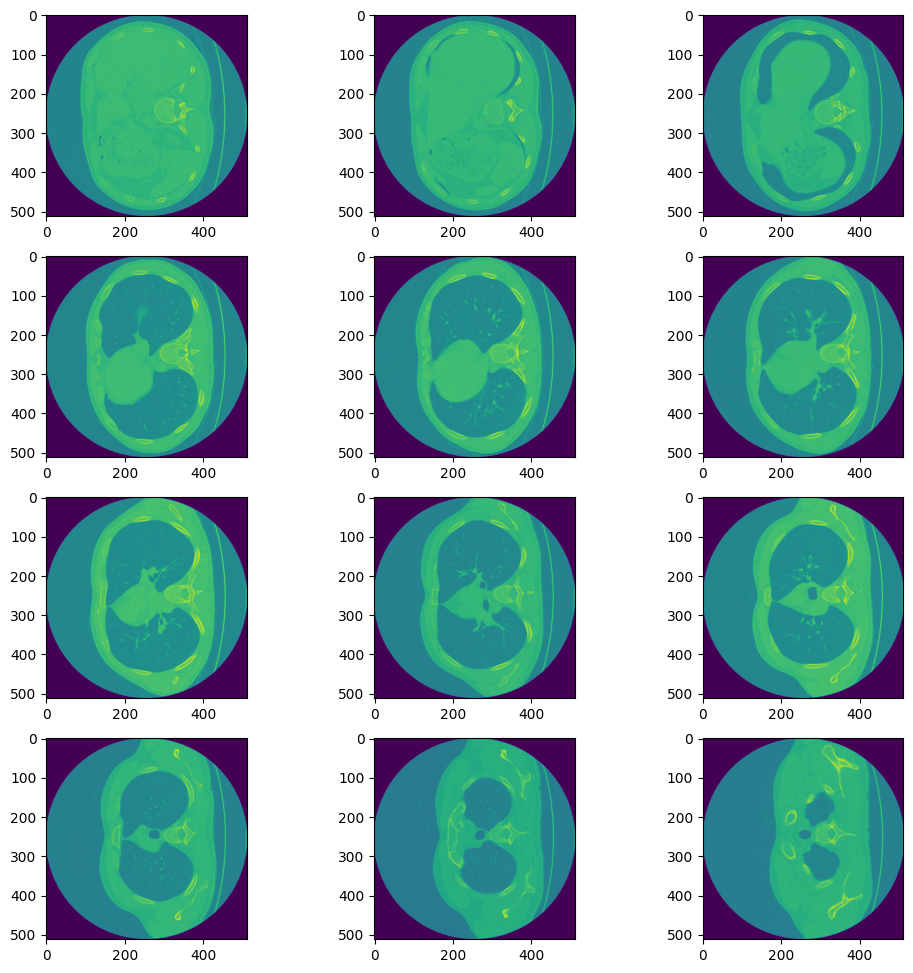

In [6]:
#plotting images at a distance of indexes of 10 to get a clear perspective
plt.style.use('default')
fig, axes = plt.subplots(4, 3, figsize=(12,12))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(lung_image[:, :, i*10])
plt.show()

In [7]:
path_label = "/content/drive/MyDrive/lungs/labelsTr/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.nii.gz"

In [8]:
img_label = nib.load(path_label).get_fdata() ## loading dataset from given path
img_label.shape

(512, 512, 121)

In [9]:
folder_path = "/content/drive/MyDrive/lungs/labelsTr/"

files = [f for f in os.listdir(folder_path) if f.endswith('.nii.gz')]
print(files)

['1.3.6.1.4.1.14519.5.2.1.6279.6001.188376349804761988217597754952.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.249530219848512542668813996730.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.111172165674661221381920536987.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.293757615532132808762625441831.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.137763212752154081977261297097.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.141069661700670042960678408762.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.303421828981831854739626597495.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.134996872583497382954024478441.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.219909753224298157409438012179.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.227962600322799211676960828223.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.216882370221919561230873289517.nii.gz', '1.3.6.1.4.1.14519.5.2.1.6279.6001.139258777898746693365877042411.nii.gz', '1.3.6.1.4.1.14519.5.2.1

In [10]:
#creating a dataset form 0th to 1st file.

for file in tqdm(files[:1]):
    file_path = os.path.join(folder_path, file)
    a, b = path_label.split('.nii.gz')[0], path_label.split('.nii.gz')[1]
    path_label_new = a + "_0000.nii.gz"
    print(path_label, path_label_new)
    img_label = np.concatenate((img_label, nib.load(path_label).get_fdata()), axis=2)
    lung_image = np.concatenate((lung_image, nib.load(path_label).get_fdata()), axis=2)


  0%|          | 0/1 [00:00<?, ?it/s]

/content/drive/MyDrive/lungs/labelsTr/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.nii.gz /content/drive/MyDrive/lungs/labelsTr/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260_0000.nii.gz


100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


In [11]:
img_label.shape, lung_image.shape

((512, 512, 242), (512, 512, 242))

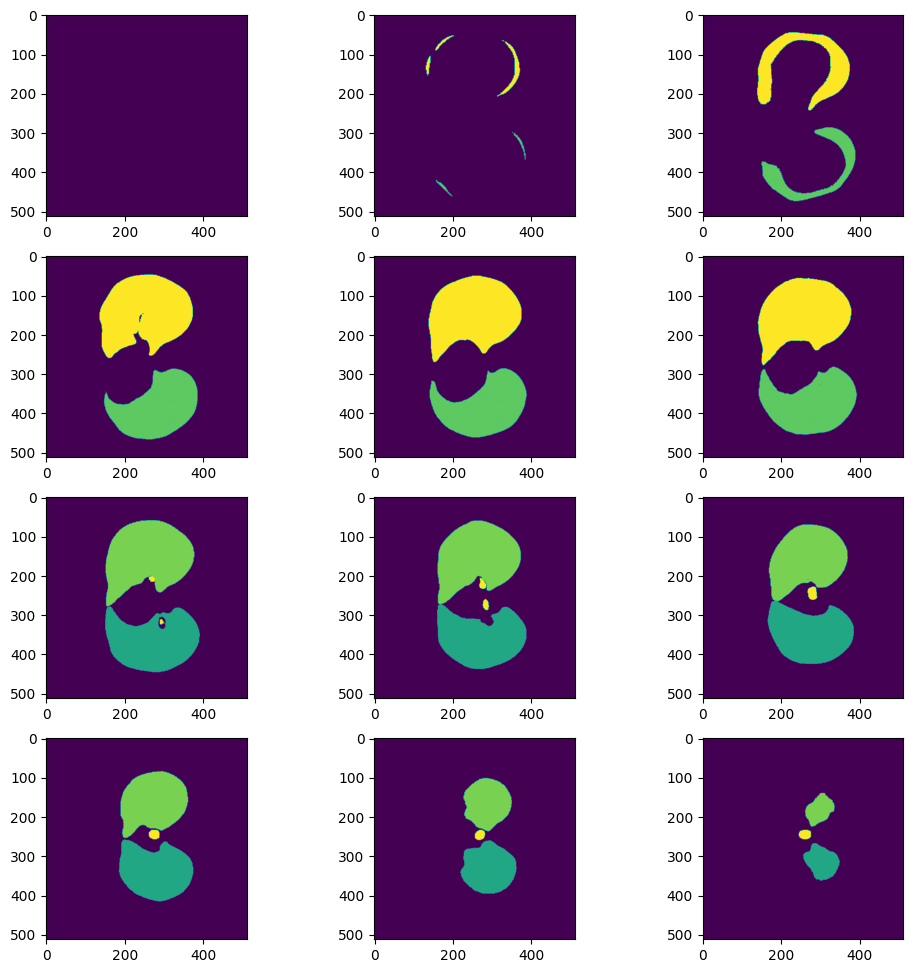

In [12]:
plt.style.use('default')
fig, axes = plt.subplots(4, 3, figsize=(12,12))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(img_label[:,:,i*10])
plt.show()

In [13]:
img_label[:,:,10]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [14]:
np.unique(img_label[:,:,50]), np.unique(img_label[:,:,60])

(array([0., 3., 4.]), array([0., 3., 4., 5.]))

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Assuming img_label contains the MRI image data and img_label contains the corresponding masks

# Step 1: Eliminate the trachea label (label 5)
img_label[img_label == 5] = 0  # Set trachea label to 0

# Step 2: Amalgamate left and right lung masks into a single label
lung_mask = np.logical_or(img_label == 3, img_label == 4)

print("lung_mask : ", lung_mask.shape)
print("lung_image : ", lung_image.shape)

# Step 3: Prepare data for training
X_train_temp = torch.from_numpy(lung_image).float()  # Input: Original MRI images
y_train_temp = torch.from_numpy(lung_mask).float()  # Output: Lung masks


lung_mask :  (512, 512, 242)
lung_image :  (512, 512, 242)


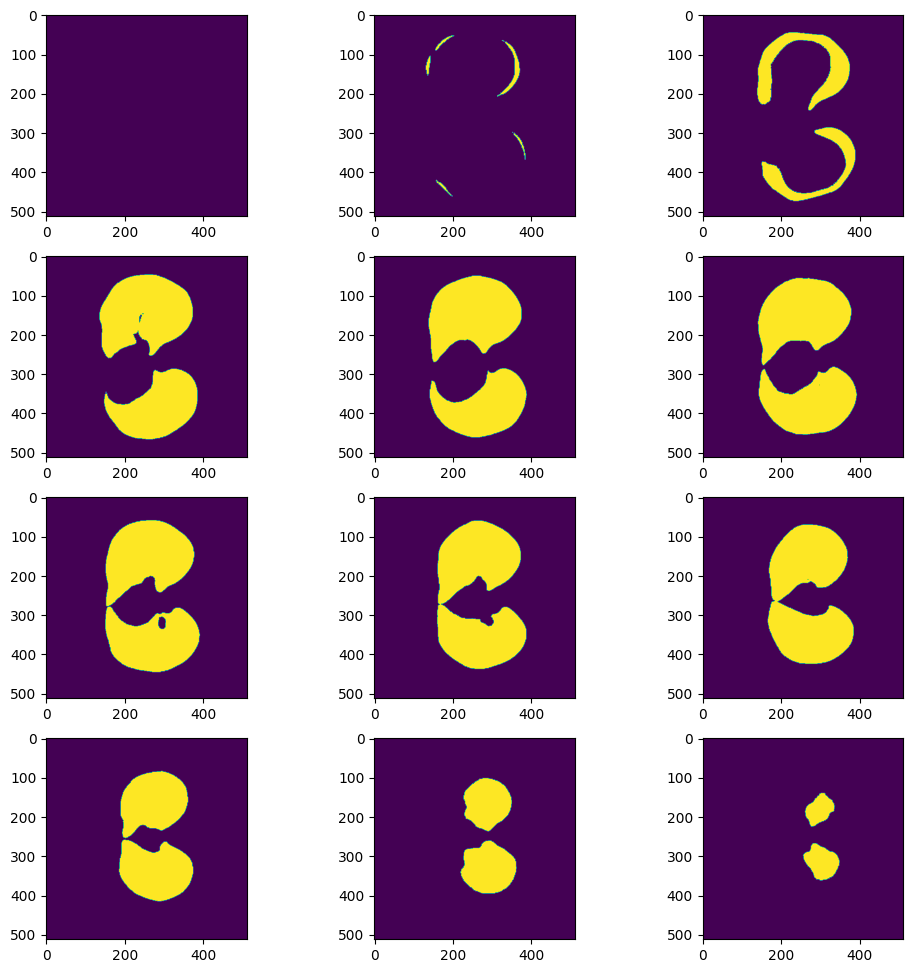

In [16]:
plt.style.use('default')
fig, axes = plt.subplots(4, 3, figsize=(12,12))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(y_train_temp[:,:,i*10])
plt.show()

In [17]:
X_train = X_train_temp.permute(2, 0, 1)
y_train = y_train_temp.permute(2, 0, 1)


In [18]:
y_train_temp[70].unique()

tensor([0., 1.])

In [19]:
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader


class LungDataset(Dataset):
    def __init__(self, X, y,transform=None):
        self.X = X
        self.y = y
        self.transform=transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        input_data = self.X[idx].unsqueeze(0)
        target = self.y[idx].unsqueeze(0)
        if self.transform:
            image = self.transform(input_data)
            mask=self.transform(target)
        return input_data, target



lung_dataset = LungDataset(X_train, y_train)

# Assuming you want to use batch_size = 32
batch_size = 8

# train_loader = DataLoader(dataset=lung_dataset, batch_size=batch_size, shuffle=True)


In [20]:
folder_path_labelsTr = "/content/drive/MyDrive/lungs/labelsTr/"
folder_path_imagesTr = "/content/drive/MyDrive/lungs/imagesTr/"

ATTENTION MODEL

Spatial Attention Matrix: First, we create a spatial attention matrix. This matrix helps us understand the spatial relationship between any two pixels in the features.

Matrix Multiplication: Next, we multiply the attention matrix with the original features. This step helps combine the attention information with the original features.

Sum Operation: Finally, we add up the multiplied resulting matrix and the original features using an element-wise sum operation. This gives us the final representations that reflect long-range contexts in the spatial domain.







This Position Attention Module enhances feature representations by capturing spatial interdependencies in an input tensor. Here's a breakdown:
Convolution Operations: Three convolutional operations are employed:
conv_b: Reduces the input channels to a fraction (1/8) for position information.
conv_c: Similar reduction for channel interdependency modeling.
conv_d: Maintains the original channel count for the final feature.
Parameter Initialization: An alpha parameter is introduced, initialized as zero, and learned during training.
Softmax Activation: A softmax activation is applied to normalize the spatial attention matrix, which models relationships between any two pixels in the input tensor.
Matrix Operations: Matrix operations, including multiplication and permutation, are performed to generate spatial attention and aggregate long-range contextual information.
Combining Information: The final feature representations are obtained by combining the original features with the spatially extended features, weighted by the learned alpha parameter.




In [21]:
class Position_Attention_Module(nn.Module):
    def __init__(self, in_channels):
        super(Position_Attention_Module, self).__init__()
        self.conv_b = nn.Conv2d(in_channels, in_channels // 8, 1)
        self.conv_c = nn.Conv2d(in_channels, in_channels // 8, 1)
        self.conv_d = nn.Conv2d(in_channels, in_channels, 1)
        self.alpha = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        batch_size, _, height, width = x.size()
        feat_b = self.conv_b(x).view(batch_size, -1, height * width).permute(0, 2, 1)
        feature_channel = self.conv_c(x).view(batch_size, -1, height * width)
        attention_s = self.softmax(torch.bmm(feat_b, feature_channel))
        
        feat_d = self.conv_d(x).view(batch_size, -1, height * width)
        features_ext = torch.bmm(feat_d, attention_s.permute(0, 2, 1)).view(batch_size, -1, height, width)
        out = self.alpha * features_ext + x

        return out

1. Initialization:
   - β (beta): Initialized to 0 (learned during training)

2. Softmax Activation:
   - Apply Softmax to normalize attention scores

3. Matrix Operations:
   - Compute attention matrix using matrix multiplication and transposition

4. Attention Score Adjustment:
   - Subtract maximum attention score to adjust scores

5. Channel Integration:
   - Apply attention matrix to original features to extend channels

6. Combining Information:
   - Combine original features with channel-extended features
   - Weighted combination using β

7. Adaptive Integration:
   - Final feature representations reflect integrated channel interdependencies




In [22]:
class Channel_Attention_Module(nn.Module):

    def __init__(self, ):
        super(Channel_Attention_Module, self).__init__()
        self.beta = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        batch_size, channel, height, width = x.size()
        feat_a = x.view(batch_size, -1, height * width)
        feat_a_transpose = x.view(batch_size, -1, height * width).permute(0, 2, 1)
        attention = torch.bmm(feat_a, feat_a_transpose)
        update_attention = torch.max(attention, dim=-1, keepdim=True)[0].expand_as(attention) - attention
        attention = self.softmax(update_attention)

        features_ext = torch.bmm(attention, feat_a).view(batch_size, -1, height, width)
        out = self.beta * features_ext + x

        return out

##
OVERVIEW: 

The DUAL attention mechanism enhances feature representations for scene segmentation by incorporating both position and channel attention modules. The position attention captures spatial interdependencies, modeling relationships between pixels. Simultaneously, the channel attention module captures interdependencies among different feature channels, improving the model's ability to understand complex patterns. Together, these attention mechanisms enable the network to adaptively aggregate global contextual information, leading to improved performance in diverse scenes with varying scales, lighting, and viewpoints.


The system uses a special technique called "self-attention" to make its understanding of a scene better. This helps the system recognize and highlight important parts of an image.

##
BASIC ARCHITECTURE OF OUR MODEL
There are two parts to this technique:

Position Attention Module: This part helps the system understand how different parts of the image relate to each other in terms of their position or location. For example, it helps the system recognize that certain pixels or regions are close to each other and might have a special relationship.

Channel Attention Module: This part helps the system understand the importance of different types of information in the image. It's like saying, "Pay more attention to these aspects or features, as they are crucial for understanding the scene."

By combining these two parts, the system becomes much better at figuring out what's happening in an image. It can capture important details, relationships between elements.

In the context of convolutional neural networks (CNNs), which are commonly used for image-related tasks, the local receptive field is determined by the size of the convolutional kernel or filter. When a filter slides over the input image during the convolution operation, it processes a small, localized region of the input at a time. This local region is the receptive field for that particular location of the filter.


##
WHY CONVOLUTIONAL ALONE WILL NOT WORK?
Convolutional operations, which are common in analyzing images, focus on small, local areas at a time. This can cause features related to pixels with the same label to differ because they're based on local information. These differences create inconsistencies within the same class, affecting how accurately we recognize things.

USE OF ATTENTION ?
To solve this problem, we use an attention mechanism to consider global context. This means we look at the entire picture and build connections between features, helping us understand the bigger picture. Our method can smartly bring in information from distant parts of the image, improving how we represent features for scene understanding.

WHY DILATED RESNET?
We remove the downsampling operations and use dilated convolutions in the last 3 ResNet blocks. This enlargement of the final feature map size to 1/16 of the input image allows us to keep more details without increasing the number of parameters, which helps in obtaining improved feature representations for predicting individual pixels.

POSITIONAL ATTENTION STEPS?
We take the features and pass them through the position attention module in three steps to capture spatial long-range contextual information.



In [ ]:
class Dual_Attention_Head(nn.Module):
    def __init__(self, in_channels, nclass, aux=True, norm_layer=nn.BatchNorm2d):
        super(Dual_Attention_Head, self).__init__()
        inter_channels = in_channels // 4
        self.conv_p1 = nn.Sequential(nn.Conv2d(in_channels, inter_channels, 3, padding=1, bias=False),nn.ReLU(True))
        self.conv_c1 = nn.Sequential(nn.Conv2d(in_channels, inter_channels, 3, padding=1, bias=False),nn.ReLU(True))
        self.pos_atten = Position_Attention_Module(inter_channels)
        
        self.channel_attention = Channel_Attention_Module()
        self.conv_p2 = nn.Sequential(nn.Conv2d(inter_channels, inter_channels, 3, padding=1, bias=False),nn.ReLU(True))
        self.conv_c2 = nn.Sequential(nn.Conv2d(inter_channels, inter_channels, 3, padding=1, bias=False),nn.ReLU(True))
        self.out = nn.Sequential(nn.Dropout(0.1), nn.Conv2d(inter_channels, nclass, 1))
        self.conv_p3 = nn.Sequential(nn.Dropout(0.1), nn.Conv2d(inter_channels, nclass, 1))
        self.conv_c3 = nn.Sequential(nn.Dropout(0.1), nn.Conv2d(inter_channels, nclass, 1))

    def forward(self, x):
        feature_parameters = self.conv_p1(x)
        # print("para", feature_parameters.shape)
        feature_parameters = self.pos_atten(feature_parameters)
        feature_parameters = self.conv_p2(feature_parameters)

        # feature_channel = self.conv_c1(x)
        # # print("feature", feature_channel.shape)
        # feature_channel = self.channel_attention(feature_channel)
        # feature_channel = self.conv_c2(feature_channel)

        feat_fusion = feature_parameters

        # outputs = []
        fusion_out = self.out(feat_fusion)
        # outputs.append(fusion_out)

        return fusion_out

In [24]:
import torchvision.models as models
import torch
from torchvision.models import resnet50
from torchsummary import summary

In [25]:
class ResNet50(nn.Module):
    def __init__(self,n_input=1):
        super(ResNet50, self).__init__()
        self.model = models.resnet50(pretrained=True)
        self.conv1 = nn.Conv2d(n_input, 64, kernel_size=7, stride=2, padding=3,bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.feature_maps = [self.model.layer1, self.model.layer2, self.model.layer3, self.model.layer4]
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))


    def base_forward(self, x):
        feature_map = []

        out = x
        out = self.conv1(out)
        out = self.bn1(out)
        out= self.relu(out)
        out= self.maxpool(out)
        for layer in self.feature_maps:
            out = layer(out)
            feature_map.append(out)
        out = self.avgpool(out)
        # out = out.view(out.size(0), -1)

        return out


In [26]:
# import torch

# import torch.nn as nn

# class Bottleneck(nn.Module):
#     expansion = 4

#     def __init__(self, in_channels, out_channels, stride=1, dilation=1):
#         super(Bottleneck, self).__init__()

#         self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
#         self.bn1 = nn.BatchNorm2d(out_channels)

#         self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=dilation, dilation=dilation, bias=False)
#         self.bn2 = nn.BatchNorm2d(out_channels)

#         self.conv3 = nn.Conv2d(out_channels, out_channels * self.expansion, kernel_size=1, bias=False)
#         self.bn3 = nn.BatchNorm2d(out_channels * self.expansion)

#         self.relu = nn.ReLU(inplace=True)
#         self.downsample = nn.Sequential()

#         # If stride is not 1 or the input channels do not match the output channels, use downsampling
#         if stride != 1 or in_channels != out_channels * self.expansion:
#             self.downsample = nn.Sequential(
#                 nn.Conv2d(in_channels, out_channels * self.expansion, kernel_size=1, stride=stride, bias=False),
#                 nn.BatchNorm2d(out_channels * self.expansion),
#             )

#     def forward(self, x):
#         residual = x

#         out = self.conv1(x)
#         out = self.bn1(out)
#         out = self.relu(out)

#         out = self.conv2(out)
#         out = self.bn2(out)
#         out = self.relu(out)

#         out = self.conv3(out)
#         out = self.bn3(out)

#         out += self.downsample(residual)
#         out = self.relu(out)

#         return out

# class DilatedResNet(nn.Module):
#     def __init__(self, block, layers, num_classes=1000):
#         super(DilatedResNet, self).__init__()
#         self.in_channels = 64

#         self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
#         self.bn1 = nn.BatchNorm2d(64)
#         self.relu = nn.ReLU(inplace=True)
#         self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

#         self.layer1 = self._make_layer(block, 64, layers[0])
#         self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
#         self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
#         self.layer4 = self._make_layer(block, 512, layers[3], stride=1, dilation=2)
#         self.layer5 = self._make_layer(block, 512, layers[4], stride=1, dilation=4)

#         self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
#         self.fc = nn.Linear(512 * block.expansion, num_classes)

#     def _make_layer(self, block, channels, blocks, stride=1, dilation=1):
#         layers = []
#         layers.append(block(self.in_channels, channels, stride, dilation=dilation))
#         self.in_channels = channels * block.expansion
#         for _ in range(1, blocks):
#             layers.append(block(self.in_channels, channels, dilation=dilation))

#         return nn.Sequential(*layers)

#     def forward(self, x):
#         x = self.conv1(x)
#         x = self.bn1(x)
#         x = self.relu(x)
#         x = self.maxpool(x)

#         x = self.layer1(x)
#         x = self.layer2(x)
#         x = self.layer3(x)
#         x = self.layer4(x)
#         x = self.layer5(x)

#         x = self.avgpool(x)
#         x = torch.flatten(x, 1)
#         x = self.fc(x)

#         return x

# def dilated_resnet50_custom(pretrained=False, **kwargs):
#     model = DilatedResNet(Bottleneck, [3, 4, 6, 3, 3], **kwargs)
#     if pretrained:
#         # Load pre-trained weights
#         state_dict = torch.hub.load_state_dict_from_url('https://download.pytorch.org/models/resnet50-19c8e357.pth')
#         model.load_state_dict(state_dict, strict=False)
#     return model

# # Example usage:
# model = dilated_resnet50_custom(pretrained=True).to(device)


In [27]:
device="cuda"

1. Initialization:
   - Inherits from nn.Module
   - Uses a pretrained ResNet-50 as the initial model

2. Input Modification:
   - Changes the first convolutional layer to accept a single-channel input

3. Layer Modification:
   - Extracts all layers of the ResNet except the last three blocks
   - Modifies the last three blocks by replacing 3x3 convolutions with dilated convolutions
     - Dilated convolutions have dilation rate (2, 2) and padding (2, 2)

4. Forward Pass:
   - Passes input through the modified ResNet layers


In [28]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchsummary import summary

class ModifiedDilatedResNet(nn.Module):
    def __init__(self):
        super(ModifiedDilatedResNet, self).__init__()

        # Use a pretrained ResNet-50 as the initial model
        resnet = models.resnet50(pretrained=True)

        # Modify the first convolutional layer to accept a single-channel input
        resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Extract the layers of the original ResNet
        self.resnet_layers = nn.Sequential(*list(resnet.children())[:-3])

        # Modify the last two blocks with dilated convolutions
        self.modify_last_two_blocks()

    def modify_last_two_blocks(self):
        # Find the last two ResNet blocks
        last_two_blocks = list(self.resnet_layers.children())[-3:]

        # Modify the last two blocks by replacing the 3x3 convolutions with dilated convolutions
        for block in last_two_blocks:
            for module in block.children():
                if isinstance(module, nn.Conv2d):
                    # Modify the convolutional layers to use dilated convolutions
                    module.dilation = (2, 2)
                    module.padding = (2, 2)

    def forward(self, x):
        # Forward pass through the modified ResNet
        x = self.resnet_layers(x)

        return x

# Create an instance of ModifiedDilatedResNet
model = ModifiedDilatedResNet().to(device)

# Display the model summary with the adjusted input size
summary(model, input_size=(1, 512, 512))


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 147MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           3,136
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
         MaxPool2d-4         [-1, 64, 128, 128]               0
            Conv2d-5         [-1, 64, 128, 128]           4,096
       BatchNorm2d-6         [-1, 64, 128, 128]             128
              ReLU-7         [-1, 64, 128, 128]               0
            Conv2d-8         [-1, 64, 128, 128]          36,864
       BatchNorm2d-9         [-1, 64, 128, 128]             128
             ReLU-10         [-1, 64, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]          16,384
      BatchNorm2d-12        [-1, 256, 128, 128]             512
           Conv2d-13        [-1, 256, 128, 128]          16,384
      BatchNorm2d-14        [-1, 256, 1

In [29]:
class Model(nn.Module):
  def __init__(self):
    super(Model,self).__init__()
    self.resnet = ModifiedDilatedResNet()
    self.decoder = nn.Sequential(
            nn.Conv2d(1, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 1, kernel_size=1)
        )
    self.upsample = nn.Upsample(size=(512, 512), mode='bilinear', align_corners=False)
    self.dual = Dual_Attention_Head(1024, 1)

  def forward(self,x):
    x=self.resnet.forward(x)
    # print(x.shape)
    x=self.dual.forward(x)
    # print(x.shape)
    x = self.upsample(x)
    return x

In [30]:
model=Model()
# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [31]:
import torchvision.transforms as transforms
import torch.nn.functional as F

In [32]:
transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.Normalize((0.5,), (0.5,))
    ])

In [33]:
from sklearn.model_selection import train_test_split

learning_rate = 0.001
model = model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
num_epochs = 2
files = [f for f in os.listdir(folder_path_labelsTr) if f.endswith('.nii.gz')]
prev_loss = 100
no_of_sets = 1

# data_augmentation = transforms.Compose([
#     transforms.RandomHorizontalFlip(),
#     transforms.RandomRotation(degrees=(-1, 1)),
#     transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0, hue=0)
# ])

loss_lst = []
loss_lst_val = []
for i in range(0, len(files), no_of_sets):
    temp_file = files[i]
    label_path = os.path.join(folder_path_labelsTr, temp_file)
    a = temp_file.split('.nii.gz')
    image_path = folder_path_imagesTr + a[0] + "_0000.nii.gz"
    lung_image = nib.load(image_path).get_fdata()
    img_label = nib.load(label_path).get_fdata()

    for temp_file in files[i+1: i+no_of_sets]:
        label_path = os.path.join(folder_path_labelsTr, temp_file)
        a = temp_file.split('.nii.gz')
        image_path = folder_path_imagesTr + a[0] + "_0000.nii.gz"
        img_label = np.concatenate((img_label, nib.load(label_path).get_fdata()), axis=2)
        lung_image = np.concatenate((lung_image, nib.load(image_path).get_fdata()), axis=2)

    img_label[img_label == 5] = 0
    lung_mask = np.logical_or(img_label == 3, img_label == 4)

    lung_image_train_temp = torch.from_numpy(lung_image).float()  # Input: Original MRI images
    lung_label_train_temp = torch.from_numpy(lung_mask).float()

    lung_image_train_temp = lung_image_train_temp.permute(2, 0, 1)
    lung_label_train_temp = lung_label_train_temp.permute(2, 0, 1)

    lung_image_train, lung_image_val, lung_label_train, lung_label_val = train_test_split(
        lung_image_train_temp, lung_label_train_temp, test_size=0.2, random_state=42)

    lung_dataset_train = LungDataset(lung_image_train, lung_label_train)
    lung_dataset_val = LungDataset(lung_image_val, lung_label_val)

    batch_size = 4
    train_loader = DataLoader(dataset=lung_dataset_train, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(dataset=lung_dataset_val, batch_size=batch_size, shuffle=False)



    # lung_dataset = LungDataset(lung_image_train, lung_label_train)
    # batch_size = 8
    # train_loader = DataLoader(dataset=lung_dataset, batch_size=batch_size, shuffle=True)


    for epoch in tqdm(range(num_epochs)):
        total_loss = 0.0
        num_batches = 0

        for inputs, labels in (train_loader):
            optimizer.zero_grad()
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            num_batches += 1

        average_loss = total_loss / num_batches

        # Validation
        model.eval()  # Set the model to evaluation mode
        total_loss_val = 0.0
        num_batches_val = 0

        with torch.no_grad():
            for inputs_val, labels_val in val_loader:
                inputs_val = inputs_val.to(device)
                labels_val = labels_val.to(device)
                outputs_val = model(inputs_val)
                loss_val = criterion(outputs_val, labels_val)
                total_loss_val += loss_val.item()
                num_batches_val += 1

        average_loss_val = total_loss_val / num_batches_val

        print(f'Epoch [{epoch + 1}/{num_epochs}], '
              f'Training Loss: {average_loss/len(val_loader):.4f}, Validation Loss: {average_loss_val/len(train_loader):.4f}')

    loss_lst_val.append(average_loss_val)
    loss_lst.append(average_loss)
    # Save the trained model
    if(prev_loss > average_loss_val):
        prev_loss = average_loss_val
        # torch.save(model.state_dict(), '/content/drive/MyDrive/lungs/lung_segmentation_model_unet_temp.pth')
        torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict()
        }, '/content/drive/MyDrive/lungs/lung_segmentation_1.pth')

 50%|█████     | 1/2 [00:09<00:09,  9.91s/it]

Epoch [1/2], Training Loss: 0.0056, Validation Loss: 0.0009


100%|██████████| 2/2 [00:18<00:00,  9.19s/it]

Epoch [2/2], Training Loss: 0.0118, Validation Loss: 0.0011



 50%|█████     | 1/2 [00:16<00:16, 16.87s/it]

Epoch [1/2], Training Loss: 0.0021, Validation Loss: 0.0003


100%|██████████| 2/2 [00:33<00:00, 16.92s/it]

Epoch [2/2], Training Loss: 0.0010, Validation Loss: 0.0002



 50%|█████     | 1/2 [00:19<00:19, 19.11s/it]

Epoch [1/2], Training Loss: 0.0009, Validation Loss: 0.0001


100%|██████████| 2/2 [00:38<00:00, 19.12s/it]

Epoch [2/2], Training Loss: 0.0005, Validation Loss: 0.0001



 50%|█████     | 1/2 [00:17<00:17, 17.07s/it]

Epoch [1/2], Training Loss: 0.0005, Validation Loss: 0.0001


100%|██████████| 2/2 [00:34<00:00, 17.08s/it]

Epoch [2/2], Training Loss: 0.0004, Validation Loss: 0.0001



 50%|█████     | 1/2 [00:08<00:08,  8.87s/it]

Epoch [1/2], Training Loss: 0.0392, Validation Loss: 0.0016


100%|██████████| 2/2 [00:17<00:00,  8.82s/it]

Epoch [2/2], Training Loss: 0.0045, Validation Loss: 0.0006



 50%|█████     | 1/2 [00:10<00:10, 10.09s/it]

Epoch [1/2], Training Loss: 0.0031, Validation Loss: 0.0005


100%|██████████| 2/2 [00:20<00:00, 10.08s/it]

Epoch [2/2], Training Loss: 0.0024, Validation Loss: 0.0006



 50%|█████     | 1/2 [00:10<00:10, 10.78s/it]

Epoch [1/2], Training Loss: 0.0025, Validation Loss: 0.0005


100%|██████████| 2/2 [00:21<00:00, 10.77s/it]

Epoch [2/2], Training Loss: 0.0017, Validation Loss: 0.0003



 50%|█████     | 1/2 [00:07<00:07,  7.14s/it]

Epoch [1/2], Training Loss: 0.0016, Validation Loss: 0.0003


100%|██████████| 2/2 [00:14<00:00,  7.13s/it]

Epoch [2/2], Training Loss: 0.0013, Validation Loss: 0.0003



 50%|█████     | 1/2 [00:05<00:05,  5.12s/it]

Epoch [1/2], Training Loss: 0.0102, Validation Loss: 0.0021


100%|██████████| 2/2 [00:10<00:00,  5.11s/it]

Epoch [2/2], Training Loss: 0.0063, Validation Loss: 0.0022



 50%|█████     | 1/2 [00:07<00:07,  7.57s/it]

Epoch [1/2], Training Loss: 0.0027, Validation Loss: 0.0006


100%|██████████| 2/2 [00:15<00:00,  7.52s/it]

Epoch [2/2], Training Loss: 0.0020, Validation Loss: 0.0005



 50%|█████     | 1/2 [00:05<00:05,  5.91s/it]

Epoch [1/2], Training Loss: 0.0022, Validation Loss: 0.0006


100%|██████████| 2/2 [00:11<00:00,  5.84s/it]

Epoch [2/2], Training Loss: 0.0019, Validation Loss: 0.0006



 50%|█████     | 1/2 [00:08<00:08,  8.99s/it]

Epoch [1/2], Training Loss: 0.0025, Validation Loss: 0.0005


100%|██████████| 2/2 [00:17<00:00,  8.98s/it]

Epoch [2/2], Training Loss: 0.0019, Validation Loss: 0.0004



 50%|█████     | 1/2 [00:21<00:21, 21.16s/it]

Epoch [1/2], Training Loss: 0.0007, Validation Loss: 0.0001


100%|██████████| 2/2 [00:42<00:00, 21.16s/it]

Epoch [2/2], Training Loss: 0.0006, Validation Loss: 0.0001



 50%|█████     | 1/2 [00:16<00:16, 16.90s/it]

Epoch [1/2], Training Loss: 0.0006, Validation Loss: 0.0001


100%|██████████| 2/2 [00:33<00:00, 16.90s/it]

Epoch [2/2], Training Loss: 0.0005, Validation Loss: 0.0001



 50%|█████     | 1/2 [00:07<00:07,  7.13s/it]

Epoch [1/2], Training Loss: 0.0379, Validation Loss: 0.0099


100%|██████████| 2/2 [00:14<00:00,  7.09s/it]

Epoch [2/2], Training Loss: 0.0279, Validation Loss: 0.0056



 50%|█████     | 1/2 [00:04<00:04,  4.85s/it]

Epoch [1/2], Training Loss: 0.0254, Validation Loss: 0.0038


100%|██████████| 2/2 [00:09<00:00,  4.83s/it]

Epoch [2/2], Training Loss: 0.0395, Validation Loss: 0.0075



 50%|█████     | 1/2 [00:17<00:17, 17.28s/it]

Epoch [1/2], Training Loss: 0.0074, Validation Loss: 0.0007


100%|██████████| 2/2 [00:34<00:00, 17.32s/it]

Epoch [2/2], Training Loss: 0.0026, Validation Loss: 0.0004



 50%|█████     | 1/2 [00:04<00:04,  4.88s/it]

Epoch [1/2], Training Loss: 0.0210, Validation Loss: 0.0024


100%|██████████| 2/2 [00:09<00:00,  4.85s/it]

Epoch [2/2], Training Loss: 0.0077, Validation Loss: 0.0014



 50%|█████     | 1/2 [00:09<00:09,  9.20s/it]

Epoch [1/2], Training Loss: 0.0229, Validation Loss: 0.0035


100%|██████████| 2/2 [00:18<00:00,  9.17s/it]

Epoch [2/2], Training Loss: 0.0076, Validation Loss: 0.0012



 50%|█████     | 1/2 [00:06<00:06,  6.37s/it]

Epoch [1/2], Training Loss: 0.0037, Validation Loss: 0.0005


100%|██████████| 2/2 [00:12<00:00,  6.35s/it]

Epoch [2/2], Training Loss: 0.0022, Validation Loss: 0.0005



 50%|█████     | 1/2 [00:07<00:07,  7.05s/it]

Epoch [1/2], Training Loss: 0.0084, Validation Loss: 0.0011


100%|██████████| 2/2 [00:14<00:00,  7.02s/it]

Epoch [2/2], Training Loss: 0.0036, Validation Loss: 0.0008



 50%|█████     | 1/2 [00:05<00:05,  5.75s/it]

Epoch [1/2], Training Loss: 0.0037, Validation Loss: 0.0009


100%|██████████| 2/2 [00:11<00:00,  5.69s/it]

Epoch [2/2], Training Loss: 0.0038, Validation Loss: 0.0007



 50%|█████     | 1/2 [00:23<00:23, 23.98s/it]

Epoch [1/2], Training Loss: 0.0008, Validation Loss: 0.0002


100%|██████████| 2/2 [00:48<00:00, 24.03s/it]

Epoch [2/2], Training Loss: 0.0006, Validation Loss: 0.0001



 50%|█████     | 1/2 [00:05<00:05,  5.33s/it]

Epoch [1/2], Training Loss: 0.0169, Validation Loss: 0.0015


100%|██████████| 2/2 [00:10<00:00,  5.32s/it]

Epoch [2/2], Training Loss: 0.0050, Validation Loss: 0.0012



 50%|█████     | 1/2 [00:09<00:09,  9.07s/it]

Epoch [1/2], Training Loss: 0.0026, Validation Loss: 0.0005


100%|██████████| 2/2 [00:18<00:00,  9.02s/it]

Epoch [2/2], Training Loss: 0.0019, Validation Loss: 0.0005



 50%|█████     | 1/2 [00:07<00:07,  7.98s/it]

Epoch [1/2], Training Loss: 0.0020, Validation Loss: 0.0005


100%|██████████| 2/2 [00:15<00:00,  7.98s/it]

Epoch [2/2], Training Loss: 0.0017, Validation Loss: 0.0004



 50%|█████     | 1/2 [00:10<00:10, 10.59s/it]

Epoch [1/2], Training Loss: 0.0018, Validation Loss: 0.0004


100%|██████████| 2/2 [00:21<00:00, 10.59s/it]

Epoch [2/2], Training Loss: 0.0015, Validation Loss: 0.0004



 50%|█████     | 1/2 [00:09<00:09,  9.97s/it]

Epoch [1/2], Training Loss: 0.0018, Validation Loss: 0.0004


100%|██████████| 2/2 [00:19<00:00,  9.94s/it]

Epoch [2/2], Training Loss: 0.0014, Validation Loss: 0.0003



 50%|█████     | 1/2 [00:06<00:06,  6.65s/it]

Epoch [1/2], Training Loss: 0.0023, Validation Loss: 0.0004


100%|██████████| 2/2 [00:13<00:00,  6.63s/it]

Epoch [2/2], Training Loss: 0.0015, Validation Loss: 0.0004



 50%|█████     | 1/2 [00:04<00:04,  4.51s/it]

Epoch [1/2], Training Loss: 0.0022, Validation Loss: 0.0005


100%|██████████| 2/2 [00:09<00:00,  4.50s/it]

Epoch [2/2], Training Loss: 0.0019, Validation Loss: 0.0005



 50%|█████     | 1/2 [00:04<00:04,  4.45s/it]

Epoch [1/2], Training Loss: 0.0029, Validation Loss: 0.0008


100%|██████████| 2/2 [00:08<00:00,  4.44s/it]

Epoch [2/2], Training Loss: 0.0026, Validation Loss: 0.0007



 50%|█████     | 1/2 [00:04<00:04,  4.83s/it]

Epoch [1/2], Training Loss: 0.0057, Validation Loss: 0.0012


100%|██████████| 2/2 [00:09<00:00,  4.82s/it]

Epoch [2/2], Training Loss: 0.0047, Validation Loss: 0.0011



 50%|█████     | 1/2 [00:08<00:08,  8.37s/it]

Epoch [1/2], Training Loss: 0.0019, Validation Loss: 0.0004


100%|██████████| 2/2 [00:16<00:00,  8.35s/it]

Epoch [2/2], Training Loss: 0.0012, Validation Loss: 0.0003



 50%|█████     | 1/2 [00:10<00:10, 10.08s/it]

Epoch [1/2], Training Loss: 0.0038, Validation Loss: 0.0006


100%|██████████| 2/2 [00:20<00:00, 10.06s/it]

Epoch [2/2], Training Loss: 0.0018, Validation Loss: 0.0004



 50%|█████     | 1/2 [00:04<00:04,  4.26s/it]

Epoch [1/2], Training Loss: 0.0035, Validation Loss: 0.0008


100%|██████████| 2/2 [00:08<00:00,  4.25s/it]

Epoch [2/2], Training Loss: 0.0029, Validation Loss: 0.0007



 50%|█████     | 1/2 [00:04<00:04,  4.30s/it]

Epoch [1/2], Training Loss: 0.0027, Validation Loss: 0.0006


100%|██████████| 2/2 [00:08<00:00,  4.28s/it]

Epoch [2/2], Training Loss: 0.0025, Validation Loss: 0.0006



 50%|█████     | 1/2 [00:09<00:09,  9.90s/it]

Epoch [1/2], Training Loss: 0.0441, Validation Loss: 0.0018


100%|██████████| 2/2 [00:19<00:00,  9.84s/it]

Epoch [2/2], Training Loss: 0.0056, Validation Loss: 0.0012



 50%|█████     | 1/2 [00:05<00:05,  5.13s/it]

Epoch [1/2], Training Loss: 0.0296, Validation Loss: 0.0035


100%|██████████| 2/2 [00:10<00:00,  5.10s/it]

Epoch [2/2], Training Loss: 0.0093, Validation Loss: 0.0020



 50%|█████     | 1/2 [00:04<00:04,  4.67s/it]

Epoch [1/2], Training Loss: 0.0045, Validation Loss: 0.0010


100%|██████████| 2/2 [00:09<00:00,  4.64s/it]

Epoch [2/2], Training Loss: 0.0034, Validation Loss: 0.0009



 50%|█████     | 1/2 [00:13<00:13, 13.21s/it]

Epoch [1/2], Training Loss: 0.0020, Validation Loss: 0.0004


100%|██████████| 2/2 [00:26<00:00, 13.21s/it]

Epoch [2/2], Training Loss: 0.0012, Validation Loss: 0.0003



 50%|█████     | 1/2 [00:04<00:04,  4.53s/it]

Epoch [1/2], Training Loss: 0.0042, Validation Loss: 0.0009


100%|██████████| 2/2 [00:09<00:00,  4.50s/it]

Epoch [2/2], Training Loss: 0.0034, Validation Loss: 0.0008



 50%|█████     | 1/2 [00:26<00:26, 26.18s/it]

Epoch [1/2], Training Loss: 0.0027, Validation Loss: 0.0002


100%|██████████| 2/2 [00:52<00:00, 26.19s/it]

Epoch [2/2], Training Loss: 0.0005, Validation Loss: 0.0001



 50%|█████     | 1/2 [00:08<00:08,  8.87s/it]

Epoch [1/2], Training Loss: 0.0093, Validation Loss: 0.0008


100%|██████████| 2/2 [00:17<00:00,  8.83s/it]

Epoch [2/2], Training Loss: 0.0027, Validation Loss: 0.0007



 50%|█████     | 1/2 [00:11<00:11, 11.76s/it]

Epoch [1/2], Training Loss: 0.0026, Validation Loss: 0.0004


100%|██████████| 2/2 [00:23<00:00, 11.73s/it]

Epoch [2/2], Training Loss: 0.0014, Validation Loss: 0.0003



 50%|█████     | 1/2 [00:04<00:04,  4.43s/it]

Epoch [1/2], Training Loss: 0.0032, Validation Loss: 0.0009


100%|██████████| 2/2 [00:08<00:00,  4.38s/it]

Epoch [2/2], Training Loss: 0.0029, Validation Loss: 0.0008


With data augumentation

In [34]:
import os
import numpy as np
import nibabel as nib
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, RandomHorizontalFlip, RandomRotation, ColorJitter
from sklearn.model_selection import train_test_split
from tqdm import tqdm

def apply_augmentation(image, label):
    # Convert NumPy arrays to PyTorch tensors
    image = torch.from_numpy(image).float()
    label = torch.from_numpy(label).float()

    # Define a set of data augmentation transformations
    transform = Compose([
        RandomHorizontalFlip(),
        RandomRotation(degrees=(-1, 1)),
        ColorJitter(brightness=0.2, contrast=0.2, saturation=0, hue=0)
    ])

    # Apply the transformations
    image = transform(image)
    label = transform(label)

    return image, label

In [35]:
from sklearn.model_selection import train_test_split
model_attention=Model()
# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model_attention.parameters(), lr=0.001)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model_attention = model_attention.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model_attention.parameters(), lr=0.001)
num_epochs = 2
files = [f for f in os.listdir(folder_path_labelsTr) if f.endswith('.nii.gz')]
prev_loss = 100
no_of_sets = 1

# data_augmentation = transforms.Compose([
#     transforms.RandomHorizontalFlip(),
#     transforms.RandomRotation(degrees=(-1, 1)),
#     transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0, hue=0)
# ])

loss_lst = []
loss_lst_val = []
for i in range(0, len(files), no_of_sets):
    temp_file = files[i]
    label_path = os.path.join(folder_path_labelsTr, temp_file)
    a = temp_file.split('.nii.gz')
    image_path = folder_path_imagesTr + a[0] + "_0000.nii.gz"
    lung_image = nib.load(image_path).get_fdata()
    img_label = nib.load(label_path).get_fdata()

    for temp_file in files[i+1: i+no_of_sets]:
        label_path = os.path.join(folder_path_labelsTr, temp_file)
        a = temp_file.split('.nii.gz')
        image_path = folder_path_imagesTr + a[0] + "_0000.nii.gz"
        img_label = np.concatenate((img_label, nib.load(label_path).get_fdata()), axis=2)
        lung_image = np.concatenate((lung_image, nib.load(image_path).get_fdata()), axis=2)

    img_label[img_label == 5] = 0
    lung_mask = np.logical_or(img_label == 3, img_label == 4)

    lung_image_train_temp = torch.from_numpy(lung_image).float()  # Input: Original MRI images
    lung_label_train_temp = torch.from_numpy(lung_mask).float()

    lung_image_train_temp = lung_image_train_temp.permute(2, 0, 1)
    lung_label_train_temp = lung_label_train_temp.permute(2, 0, 1)

    lung_image_train, lung_image_val, lung_label_train, lung_label_val = train_test_split(
        lung_image_train_temp, lung_label_train_temp, test_size=0.2, random_state=42)

    lung_dataset_train = LungDataset(lung_image_train, lung_label_train)
    lung_dataset_val = LungDataset(lung_image_val, lung_label_val)

    batch_size = 4
    train_loader = DataLoader(dataset=lung_dataset_train, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(dataset=lung_dataset_val, batch_size=batch_size, shuffle=False)



    # lung_dataset = LungDataset(lung_image_train, lung_label_train)
    # batch_size = 8
    # train_loader = DataLoader(dataset=lung_dataset, batch_size=batch_size, shuffle=True)


    for epoch in tqdm(range(num_epochs)):
        total_loss = 0.0
        num_batches = 0

        for inputs, labels in (train_loader):
            optimizer.zero_grad()

            augmented_inputs, augmented_labels = [], []
            for i in range(inputs.size(0)):
                augmented_input, augmented_label = apply_augmentation(inputs[i].numpy(), labels[i].numpy())
                augmented_inputs.append(augmented_input)
                augmented_labels.append(augmented_label)

            augmented_inputs = torch.stack(augmented_inputs)
            augmented_labels = torch.stack(augmented_labels)

            augmented_inputs = augmented_inputs.to(device)
            augmented_labels = augmented_labels.to(device)
                # inputs = inputs.to(device)
                # labels = labels.to(device)
            outputs = model_attention(augmented_inputs)
            loss = criterion(outputs, augmented_labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            num_batches += 1

        average_loss = total_loss / num_batches

        # Validation
        model_attention.eval()  # Set the model_attention to evaluation mode
        total_loss_val = 0.0
        num_batches_val = 0

        with torch.no_grad():
            for inputs_val, labels_val in val_loader:
                inputs_val = inputs_val.to(device)
                labels_val = labels_val.to(device)
                outputs_val = model_attention(inputs_val)
                loss_val = criterion(outputs_val, labels_val)
                total_loss_val += loss_val.item()
                num_batches_val += 1

        average_loss_val = total_loss_val / num_batches_val

        print(f'Epoch [{epoch + 1}/{num_epochs}], '
              f'Training Loss: {average_loss:.4f}, Validation Loss: {average_loss_val:.4f}')

    loss_lst_val.append(average_loss_val)
    loss_lst.append(average_loss)
    # Save the trained model_attention
    if(prev_loss > average_loss_val):
        prev_loss = average_loss_val
        torch.save(model_attention.state_dict(), '/content/drive/MyDrive/lungs/lung_segmentation_model_attention_unet.pth')


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
 50%|█████     | 1/2 [00:12<00:12, 12.89s/it]

Epoch [1/2], Training Loss: 0.1818, Validation Loss: 134.5285


100%|██████████| 2/2 [00:25<00:00, 12.53s/it]

Epoch [2/2], Training Loss: 0.3181, Validation Loss: 36.9971



 50%|█████     | 1/2 [00:23<00:23, 23.38s/it]

Epoch [1/2], Training Loss: 0.2776, Validation Loss: 55.3703


100%|██████████| 2/2 [00:47<00:00, 23.53s/it]

Epoch [2/2], Training Loss: 0.2428, Validation Loss: 65.0879



 50%|█████     | 1/2 [00:26<00:26, 26.34s/it]

Epoch [1/2], Training Loss: 0.1773, Validation Loss: 31.1026


100%|██████████| 2/2 [00:52<00:00, 26.36s/it]

Epoch [2/2], Training Loss: 0.1690, Validation Loss: 23.0461



 50%|█████     | 1/2 [00:23<00:23, 23.42s/it]

Epoch [1/2], Training Loss: 0.1457, Validation Loss: 36.4589


100%|██████████| 2/2 [00:46<00:00, 23.34s/it]

Epoch [2/2], Training Loss: 0.1381, Validation Loss: 34.7503



 50%|█████     | 1/2 [00:12<00:12, 12.20s/it]

Epoch [1/2], Training Loss: 0.1824, Validation Loss: 13.9528


100%|██████████| 2/2 [00:24<00:00, 12.01s/it]

Epoch [2/2], Training Loss: 0.1724, Validation Loss: 9.9912



 50%|█████     | 1/2 [00:14<00:14, 14.07s/it]

Epoch [1/2], Training Loss: 0.2516, Validation Loss: 10.8228


100%|██████████| 2/2 [00:27<00:00, 13.95s/it]

Epoch [2/2], Training Loss: 0.2967, Validation Loss: 2.1034



 50%|█████     | 1/2 [00:14<00:14, 14.68s/it]

Epoch [1/2], Training Loss: 0.1677, Validation Loss: 26.4670


100%|██████████| 2/2 [00:29<00:00, 14.61s/it]

Epoch [2/2], Training Loss: 0.1520, Validation Loss: 13.9115



 50%|█████     | 1/2 [00:09<00:09,  9.41s/it]

Epoch [1/2], Training Loss: 0.1117, Validation Loss: 16.4950


100%|██████████| 2/2 [00:19<00:00,  9.53s/it]

Epoch [2/2], Training Loss: 0.0977, Validation Loss: 12.2139



 50%|█████     | 1/2 [00:07<00:07,  7.16s/it]

Epoch [1/2], Training Loss: 0.2212, Validation Loss: 12.6279


100%|██████████| 2/2 [00:13<00:00,  6.88s/it]

Epoch [2/2], Training Loss: 0.2114, Validation Loss: 24.4343



 50%|█████     | 1/2 [00:10<00:10, 10.31s/it]

Epoch [1/2], Training Loss: 0.1269, Validation Loss: 38.4091


100%|██████████| 2/2 [00:20<00:00, 10.29s/it]

Epoch [2/2], Training Loss: 0.1232, Validation Loss: 40.4987



 50%|█████     | 1/2 [00:07<00:07,  7.66s/it]

Epoch [1/2], Training Loss: 0.1389, Validation Loss: 15.1987


100%|██████████| 2/2 [00:15<00:00,  7.82s/it]

Epoch [2/2], Training Loss: 0.1221, Validation Loss: 10.2889



 50%|█████     | 1/2 [00:12<00:12, 12.31s/it]

Epoch [1/2], Training Loss: 0.1766, Validation Loss: 19.4774


100%|██████████| 2/2 [00:24<00:00, 12.27s/it]

Epoch [2/2], Training Loss: 0.1883, Validation Loss: 75.8992



 50%|█████     | 1/2 [00:28<00:28, 28.31s/it]

Epoch [1/2], Training Loss: 0.2720, Validation Loss: 38.1414


100%|██████████| 2/2 [00:56<00:00, 28.35s/it]

Epoch [2/2], Training Loss: 0.2531, Validation Loss: 14.1394



 50%|█████     | 1/2 [00:22<00:22, 22.52s/it]

Epoch [1/2], Training Loss: 0.4058, Validation Loss: 163.7125


100%|██████████| 2/2 [00:45<00:00, 22.72s/it]

Epoch [2/2], Training Loss: 0.2301, Validation Loss: 560.5400



 50%|█████     | 1/2 [00:09<00:09,  9.77s/it]

Epoch [1/2], Training Loss: 0.1802, Validation Loss: 170.2590


100%|██████████| 2/2 [00:18<00:00,  9.50s/it]

Epoch [2/2], Training Loss: 0.1622, Validation Loss: 195.1280



 50%|█████     | 1/2 [00:06<00:06,  6.39s/it]

Epoch [1/2], Training Loss: 0.2053, Validation Loss: 214.8694


100%|██████████| 2/2 [00:12<00:00,  6.38s/it]

Epoch [2/2], Training Loss: 0.1890, Validation Loss: 246.5748



 50%|█████     | 1/2 [00:23<00:23, 23.23s/it]

Epoch [1/2], Training Loss: 0.2299, Validation Loss: 333.4322


100%|██████████| 2/2 [00:46<00:00, 23.16s/it]

Epoch [2/2], Training Loss: 0.2204, Validation Loss: 266.2125



 50%|█████     | 1/2 [00:06<00:06,  6.72s/it]

Epoch [1/2], Training Loss: 0.1237, Validation Loss: 131.9970


100%|██████████| 2/2 [00:12<00:00,  6.46s/it]

Epoch [2/2], Training Loss: 0.0948, Validation Loss: 157.0901



 50%|█████     | 1/2 [00:12<00:12, 12.45s/it]

Epoch [1/2], Training Loss: 0.1545, Validation Loss: 399.3689


100%|██████████| 2/2 [00:24<00:00, 12.44s/it]

Epoch [2/2], Training Loss: 0.1337, Validation Loss: 323.6199



 50%|█████     | 1/2 [00:08<00:08,  8.82s/it]

Epoch [1/2], Training Loss: 0.1322, Validation Loss: 115.5851


100%|██████████| 2/2 [00:17<00:00,  8.53s/it]

Epoch [2/2], Training Loss: 0.1236, Validation Loss: 123.6269



 50%|█████     | 1/2 [00:09<00:09,  9.35s/it]

Epoch [1/2], Training Loss: 0.1833, Validation Loss: 205.3531


100%|██████████| 2/2 [00:19<00:00,  9.70s/it]

Epoch [2/2], Training Loss: 0.1848, Validation Loss: 266.0290



 50%|█████     | 1/2 [00:07<00:07,  7.48s/it]

Epoch [1/2], Training Loss: 0.2068, Validation Loss: 190.3726


100%|██████████| 2/2 [00:15<00:00,  7.57s/it]

Epoch [2/2], Training Loss: 0.1995, Validation Loss: 112.2806



 50%|█████     | 1/2 [00:32<00:32, 32.38s/it]

Epoch [1/2], Training Loss: 0.2173, Validation Loss: 192.0529


100%|██████████| 2/2 [01:04<00:00, 32.35s/it]

Epoch [2/2], Training Loss: 0.2112, Validation Loss: 213.6682



 50%|█████     | 1/2 [00:07<00:07,  7.47s/it]

Epoch [1/2], Training Loss: 0.1950, Validation Loss: 203.6008


100%|██████████| 2/2 [00:15<00:00,  7.90s/it]

Epoch [2/2], Training Loss: 0.1905, Validation Loss: 199.2388



  0%|          | 0/2 [00:03<?, ?it/s]


KeyboardInterrupt: ignored

In [36]:
def predict(model, input_array):
    # Add batch dimension if needed
    if len(input_array.shape) == 2:
        input_array = input_array.unsqueeze(0)

    # Move the input tensor to the appropriate device
    input_tensor = input_array.to(device)

    # Perform inference
    with torch.no_grad():
        model_output = model(input_tensor)
    predicted_probs = torch.sigmoid(model_output)

    # You can further process the predicted probabilities as needed
    # input_tensor = torch.from_numpy(input_array).float()
    return predicted_probs.cpu().numpy()  # Move the result to CPU and convert to NumPy array


# def loss_dice(pred, target):
#     smooth = 1e-5

#     pred_flat = pred.flatten()
#     target_flat = target.flatten()

#     intersection = np.sum(pred_flat * target_flat)
#     union = np.sum(pred_flat) + np.sum(target_flat)

#     dice = (2.0 * intersection + smooth) / (union + smooth)
#     return 1 - dice  # We often minimize the loss, so we return 1 - dice for training

def loss_dice(pred, target):
    pred_flat = pred.flatten()
    target_flat = target.flatten()

    # Convert PyTorch tensor to NumPy array
    target_flat = target_flat.cpu().numpy()

    intersection = np.sum(pred_flat * target_flat)
    union = np.sum(pred_flat) + np.sum(target_flat)
    # print("union", union)
    # print("intersection", intersection)
    dice_coefficient = (2.0 * intersection) / (union + 1e-8)
    return 1-dice_coefficient

In [37]:
# Example usage with a NumPy array
def inference(model):

    total = 0
    for i in range(1, len(lung_image_train)):
        input_array = lung_image_train[i]  # Replace with your actual input array
        ground_array = lung_label_train[i]  # Replace with your actual input array

        # Add an extra dimension to input_array
        input_array = np.expand_dims(input_array, axis=0)
        print(input_array.shape)
        input_array = np.expand_dims(input_array, axis=1)
        # Convert to PyTorch tensor
        input_tensor = torch.from_numpy(input_array).float()

        # Make a prediction
        prediction = predict(model, input_tensor)
        # print("prediction :", prediction.shape)

        # Convert to binary mask (assuming a threshold of 0.5)
        binary_mask = (prediction > 0.3).astype(np.uint8)
        lossy = loss_dice(binary_mask, ground_array)
        print("DICE loss : ", lossy)
        total+=lossy
        # Plot the original image, ground truth, and predicted image
        plt.figure(figsize=(12, 4))

        # Original image
        plt.subplot(1, 4, 1)
        plt.imshow(input_array.squeeze(), cmap='gray')  # Use cmap='gray' for grayscale images
        plt.title('Original Image')
        plt.axis('off')

        # Predicted image
        plt.subplot(1, 4, 2)
        plt.imshow(prediction.squeeze(), cmap='gray')  # Use cmap='gray' for grayscale images
        plt.title('Predicted Image')
        plt.axis('off')

        # Ground image
        plt.subplot(1, 4, 3)
        plt.imshow(ground_array.squeeze(), cmap='gray')  # Use cmap='gray' for grayscale images
        plt.title('Ground Image')
        plt.axis('off')

        # Binary image
        plt.subplot(1, 4, 4)
        plt.imshow(binary_mask.squeeze(), cmap='gray')
        plt.title('Binary Mask')
        plt.axis('off')

        plt.show()

    return total

(1, 512, 512)
DICE loss :  0.05481794407587626


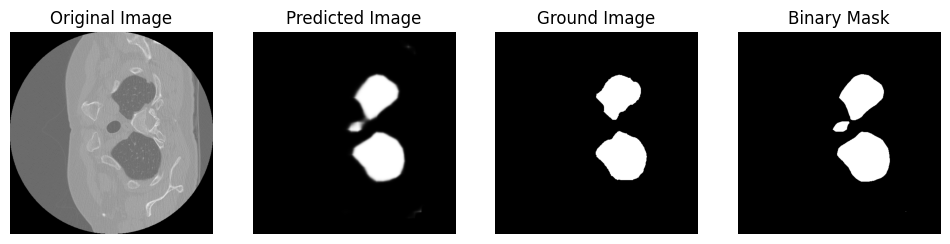

(1, 512, 512)
DICE loss :  0.1714068441077241


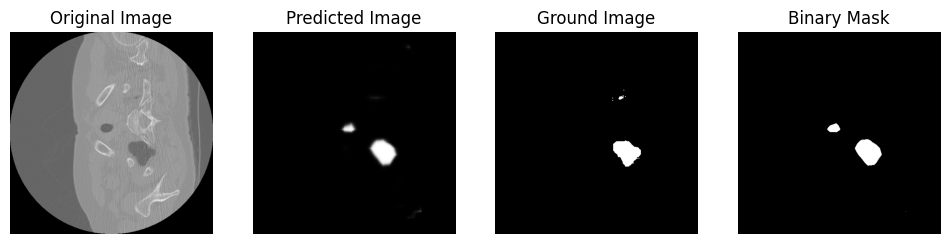

(1, 512, 512)
DICE loss :  0.022232377154240424


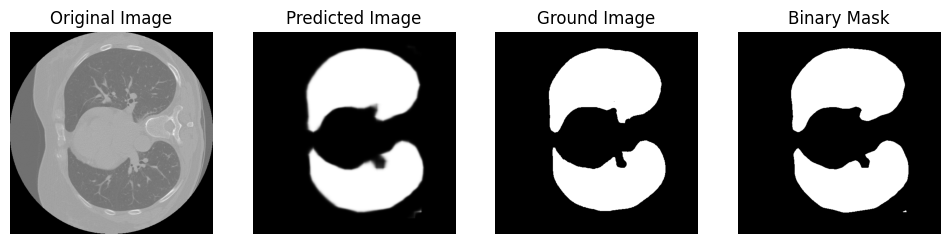

(1, 512, 512)
DICE loss :  0.022710496039859973


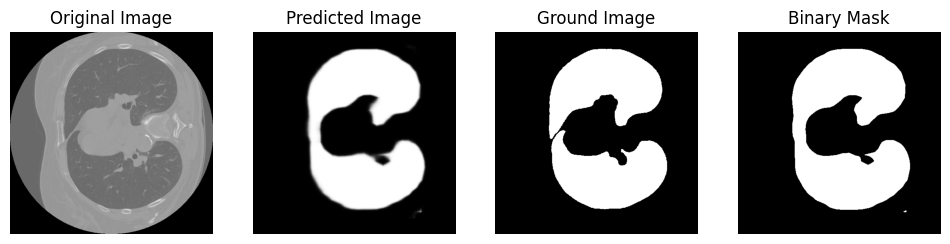

(1, 512, 512)
DICE loss :  0.03447796468797493


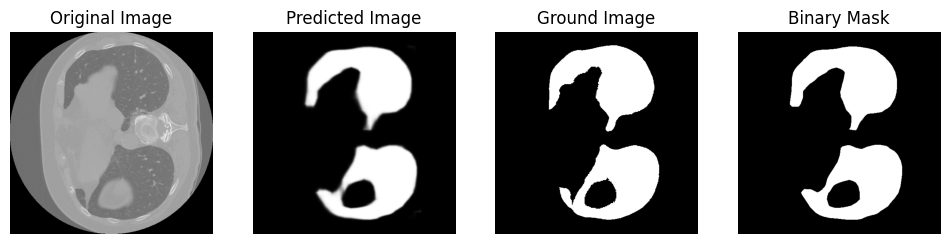

(1, 512, 512)
DICE loss :  0.05690658927620118


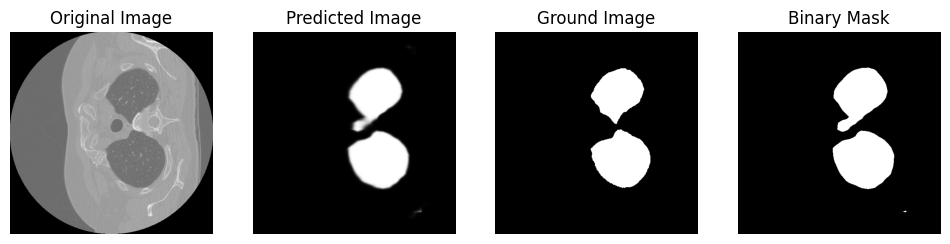

(1, 512, 512)
DICE loss :  0.03434985003331614


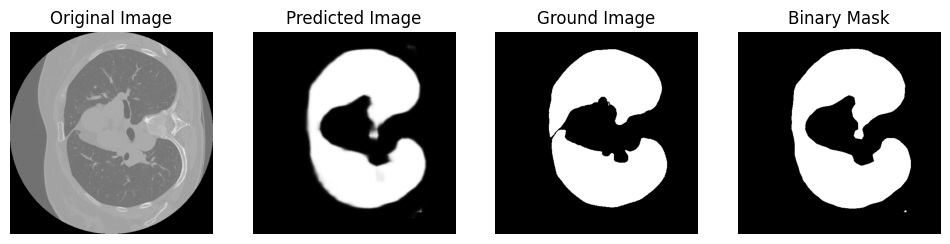

(1, 512, 512)
DICE loss :  0.02907865677565069


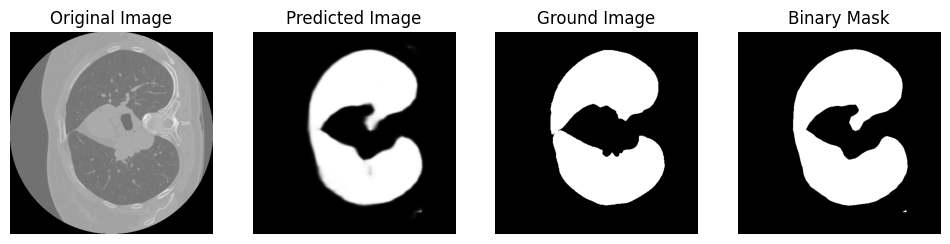

(1, 512, 512)
DICE loss :  0.08401898194015778


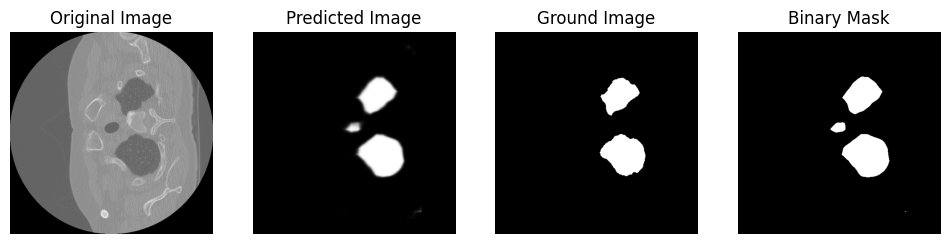

(1, 512, 512)
DICE loss :  0.09260850881011362


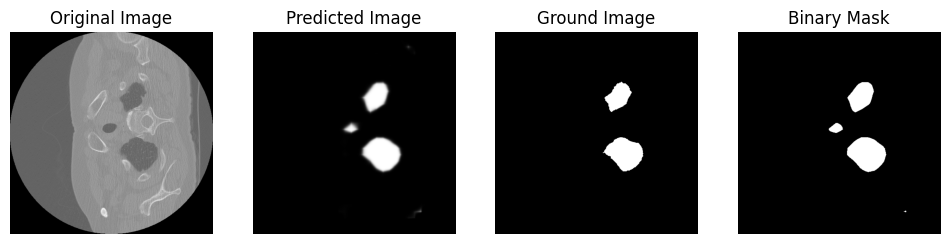

(1, 512, 512)
DICE loss :  0.034251138758648936


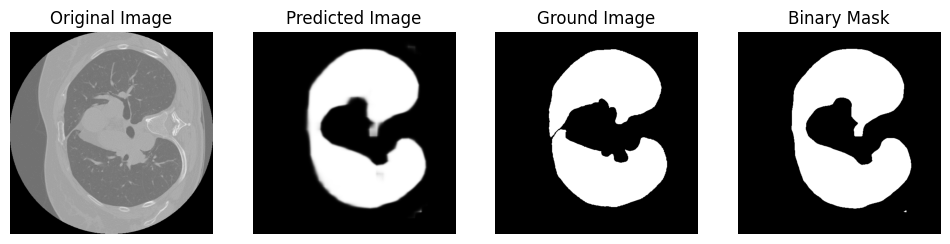

(1, 512, 512)
DICE loss :  0.022452288018324884


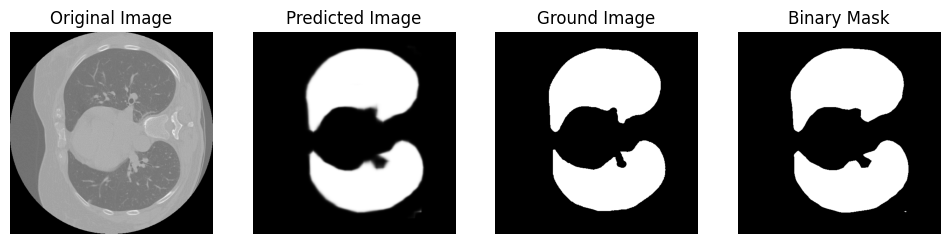

(1, 512, 512)
DICE loss :  0.020877467456226206


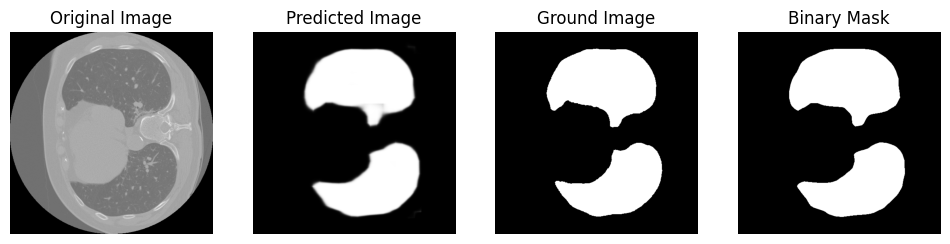

(1, 512, 512)
DICE loss :  0.02862296163197131


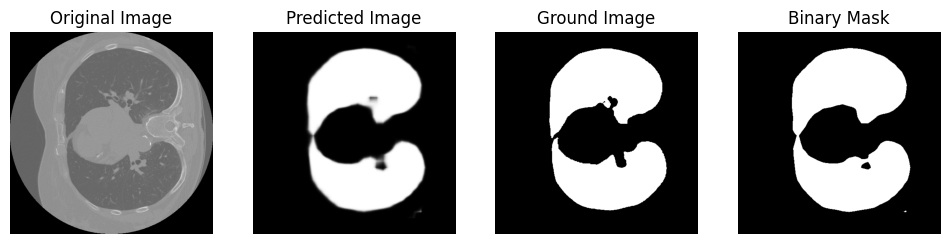

(1, 512, 512)
DICE loss :  0.0286942731278218


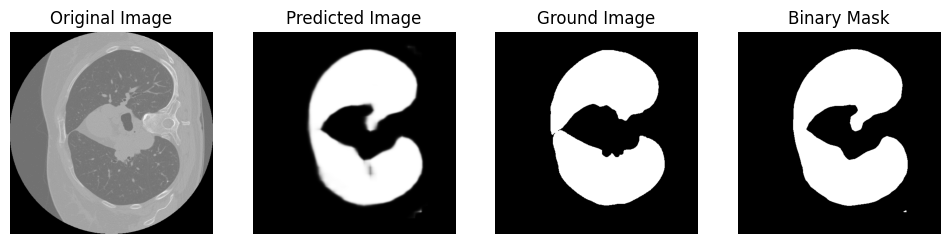

(1, 512, 512)
DICE loss :  1.0


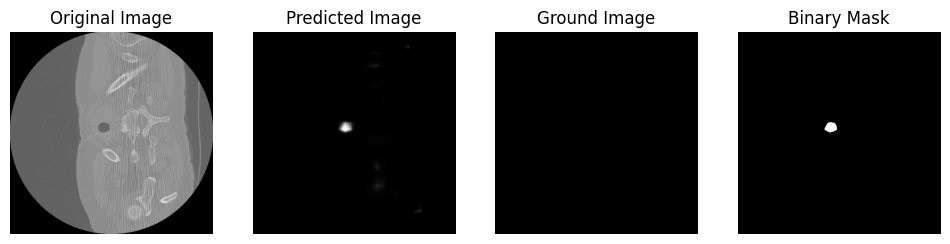

(1, 512, 512)
DICE loss :  0.026415945420271147


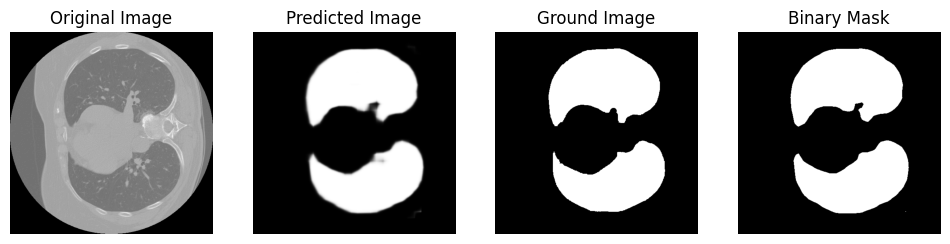

(1, 512, 512)
DICE loss :  0.027624467181288637


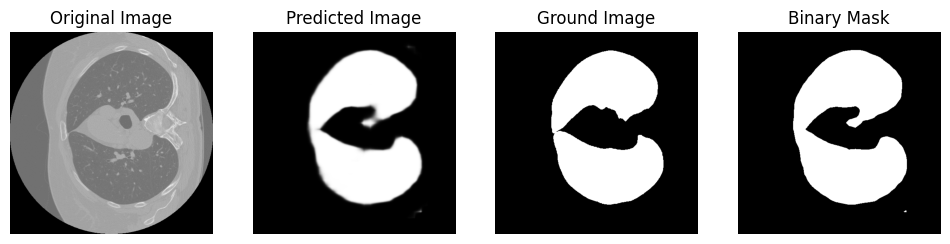

(1, 512, 512)
DICE loss :  0.09494451294753703


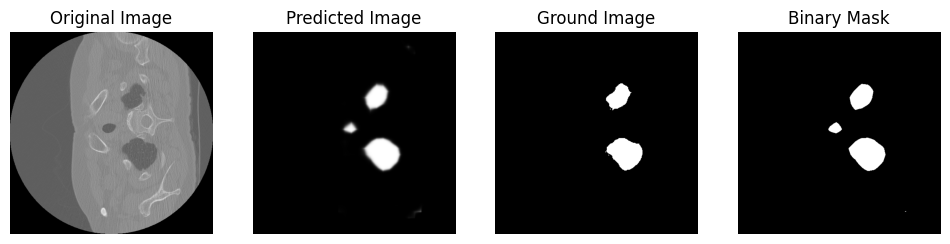

(1, 512, 512)
DICE loss :  0.02351924442119946


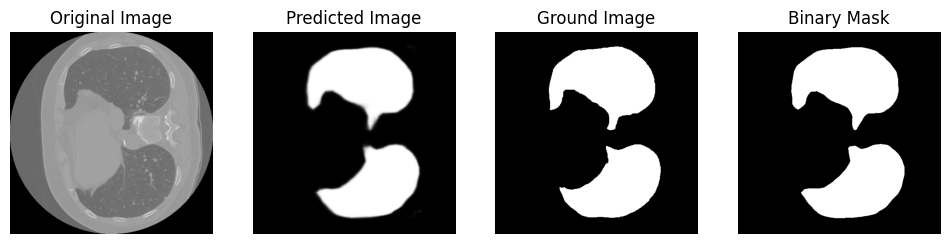

(1, 512, 512)
DICE loss :  0.031821129885712174


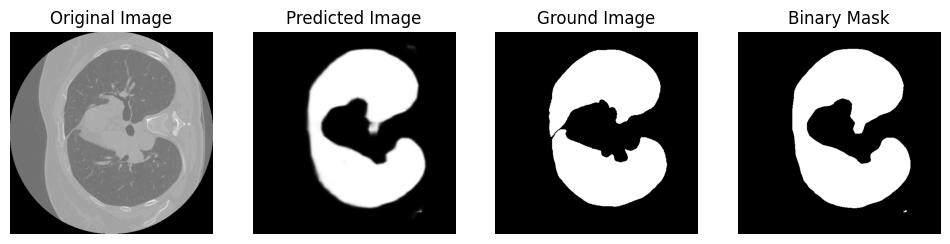

(1, 512, 512)
DICE loss :  0.0245843024265614


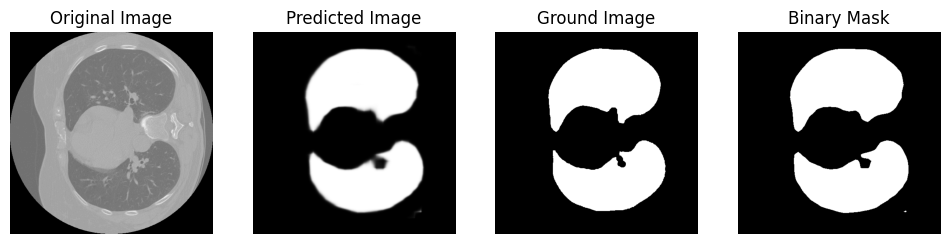

(1, 512, 512)
DICE loss :  0.02373183944848678


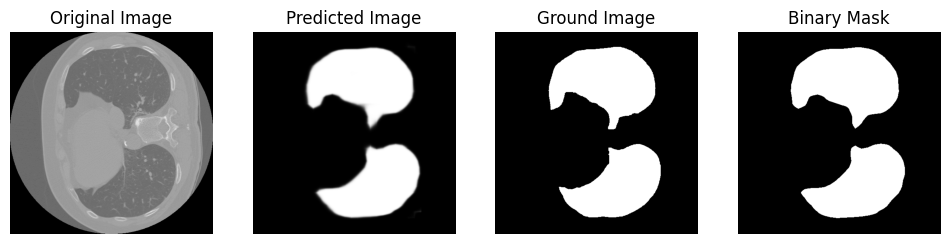

(1, 512, 512)
DICE loss :  0.15135627991890666


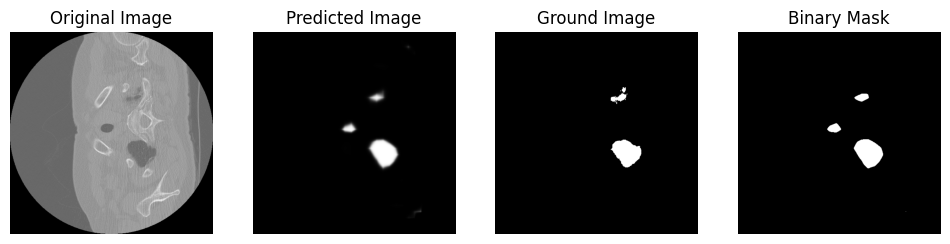

(1, 512, 512)
DICE loss :  0.01972605637534519


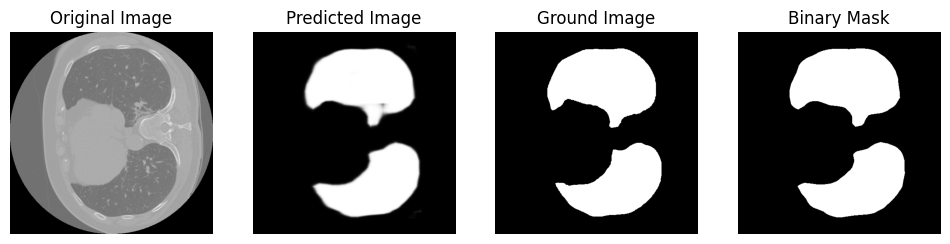

(1, 512, 512)
DICE loss :  0.24228078852593637


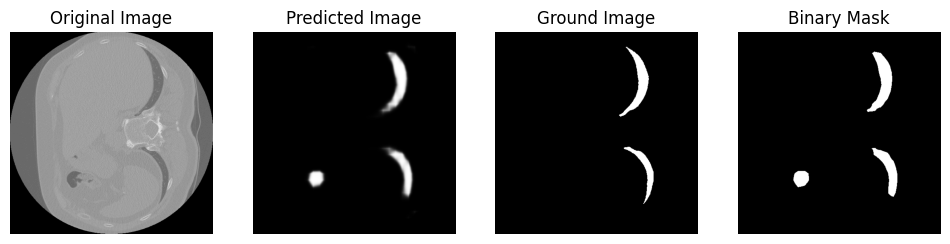

(1, 512, 512)
DICE loss :  0.027825911067725695


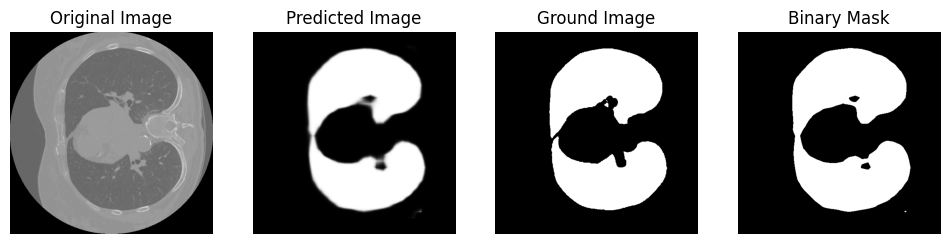

(1, 512, 512)
DICE loss :  0.02210649297104983


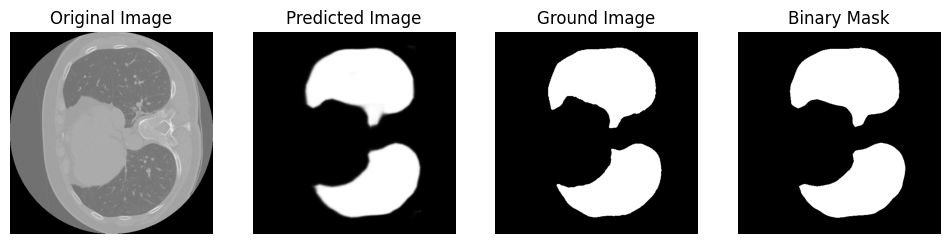

(1, 512, 512)
DICE loss :  0.020748124473919938


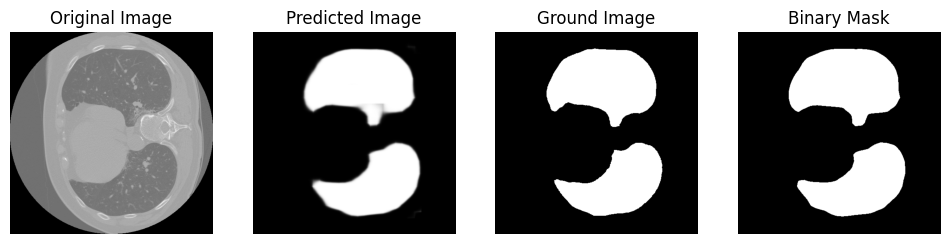

(1, 512, 512)
DICE loss :  1.0


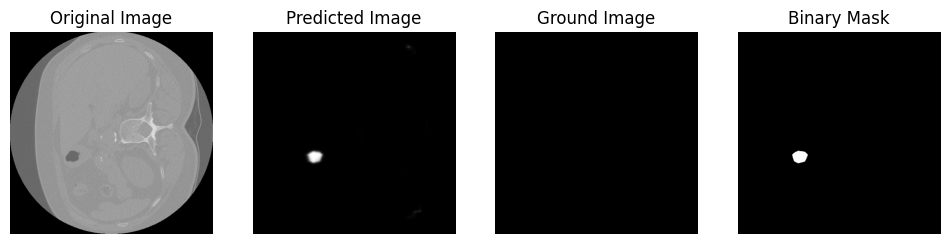

(1, 512, 512)
DICE loss :  0.05999664354454848


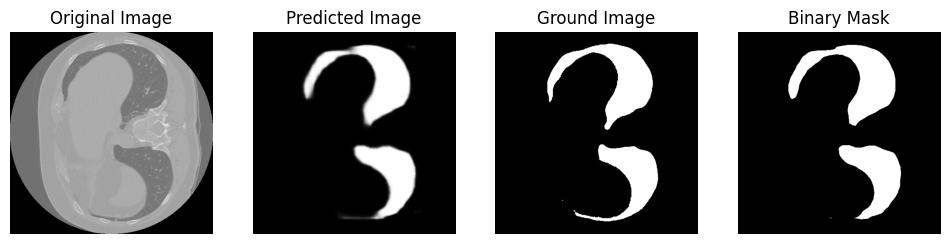

(1, 512, 512)
DICE loss :  0.030942746168801216


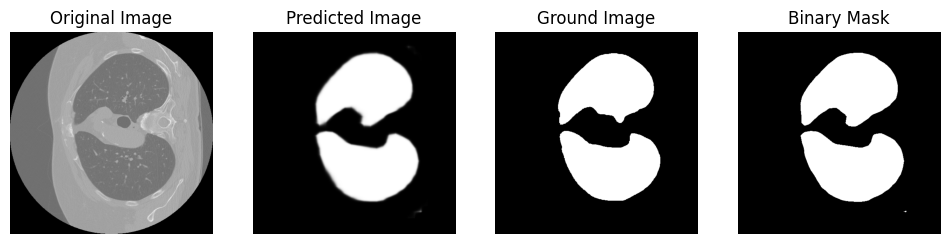

(1, 512, 512)
DICE loss :  0.08257976454569083


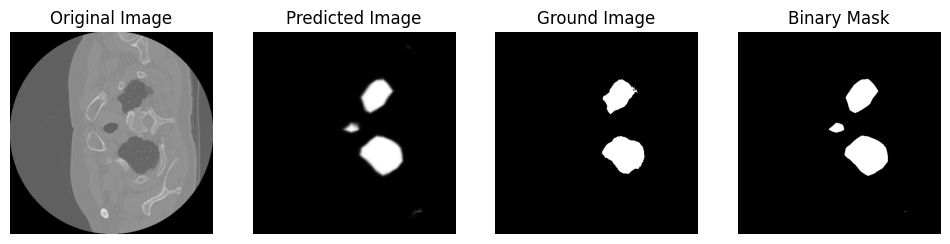

(1, 512, 512)
DICE loss :  0.032452291778203635


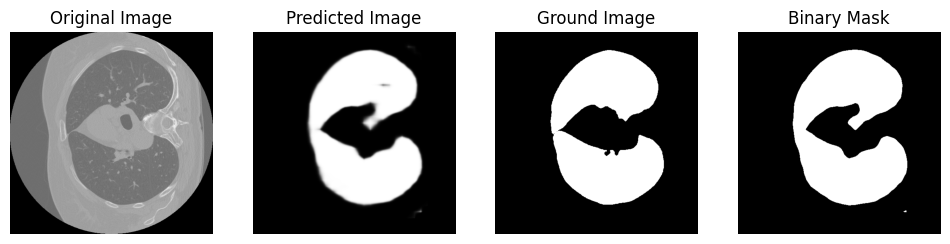

(1, 512, 512)
DICE loss :  0.04587037156952278


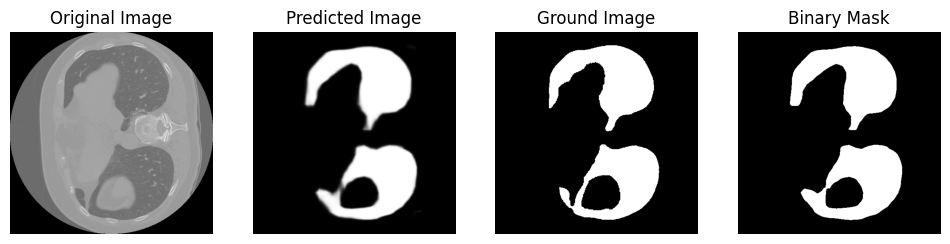

(1, 512, 512)
DICE loss :  0.02316329295459052


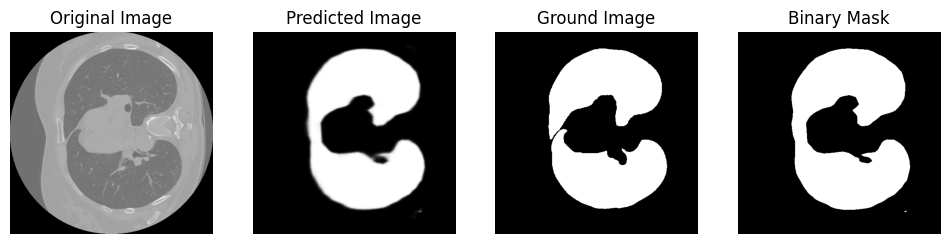

(1, 512, 512)
DICE loss :  0.028735205853658297


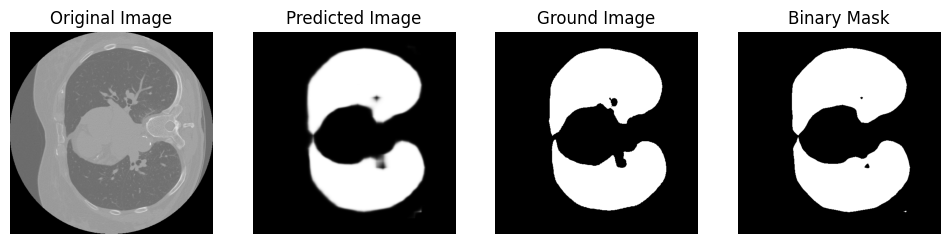

(1, 512, 512)
DICE loss :  0.04973516064911443


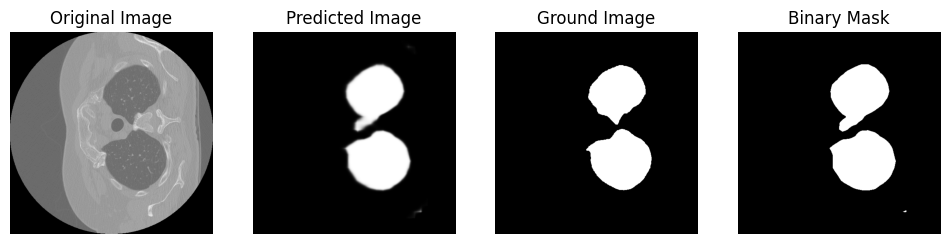

(1, 512, 512)
DICE loss :  0.03053184284120969


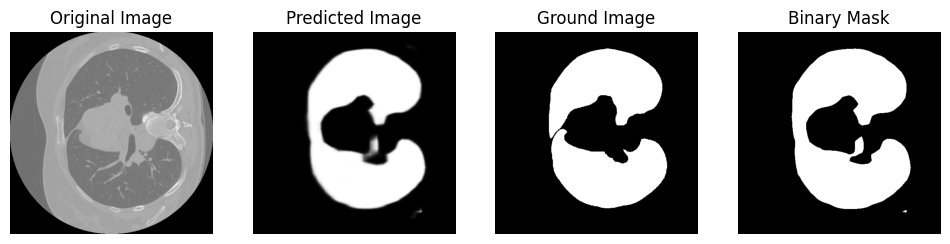

(1, 512, 512)
DICE loss :  0.21597230807317602


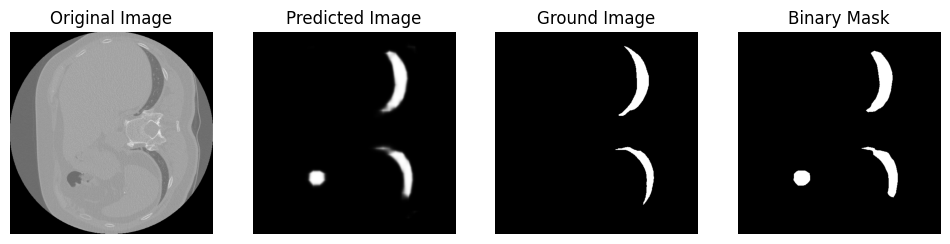

(1, 512, 512)
DICE loss :  1.0


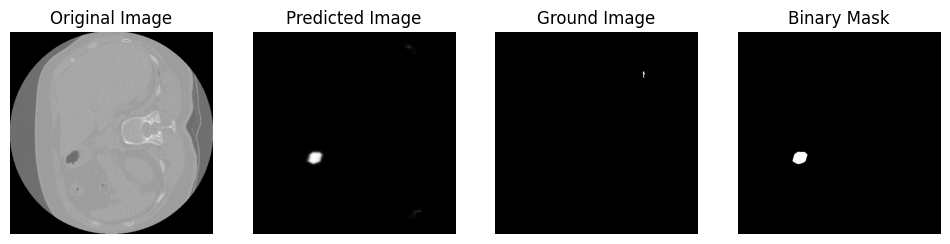

(1, 512, 512)
DICE loss :  0.1689034210145094


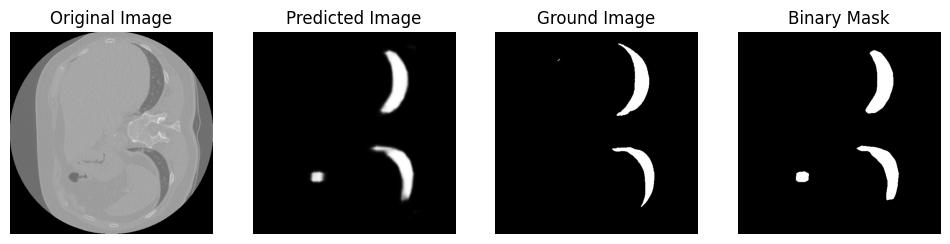

(1, 512, 512)
DICE loss :  0.24939024390301123


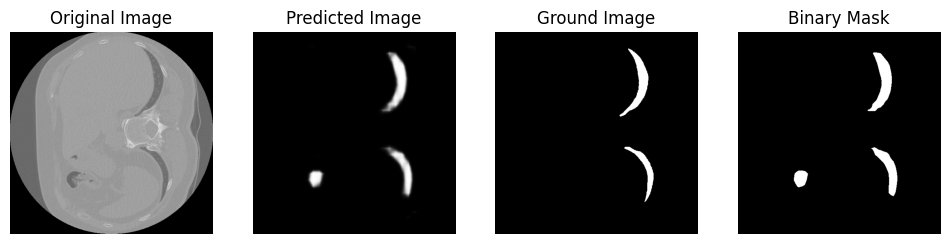

(1, 512, 512)
DICE loss :  0.09782767167251838


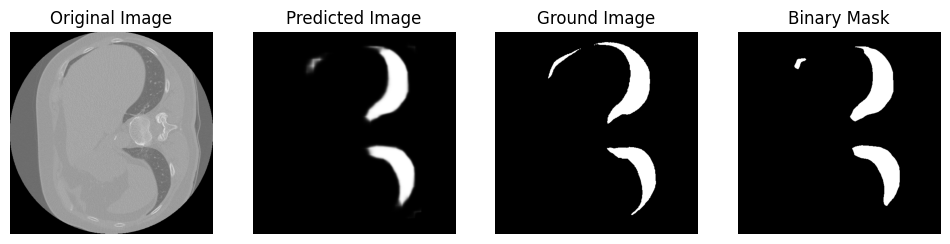

(1, 512, 512)
DICE loss :  0.055293988831881524


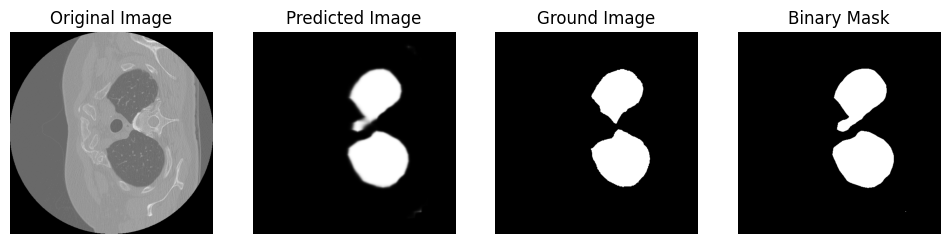

(1, 512, 512)
DICE loss :  0.36092715231884265


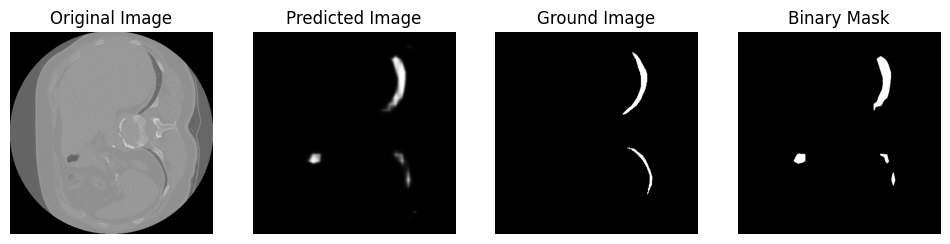

(1, 512, 512)
DICE loss :  0.021509290973600437


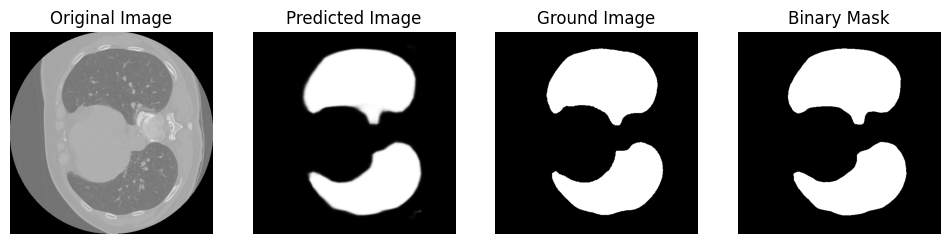

(1, 512, 512)
DICE loss :  0.040714908456983334


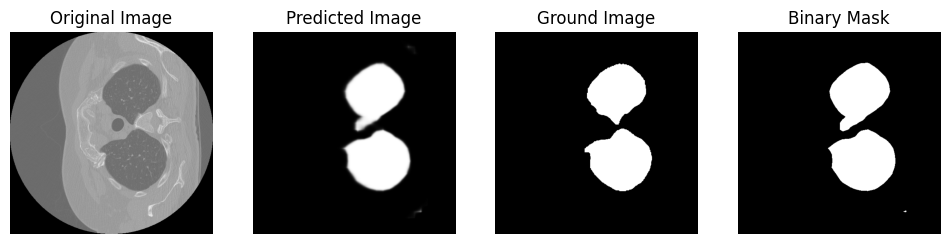

(1, 512, 512)
DICE loss :  0.02449381409981022


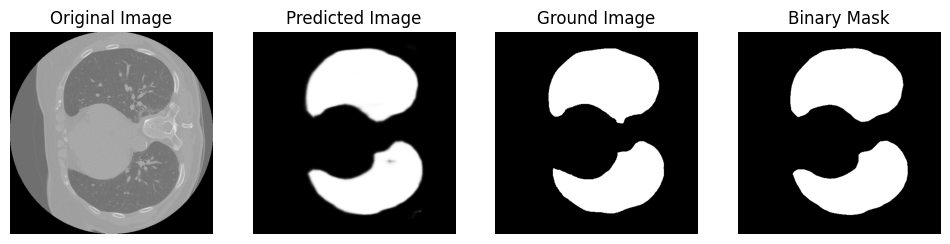

(1, 512, 512)
DICE loss :  0.07107200574626116


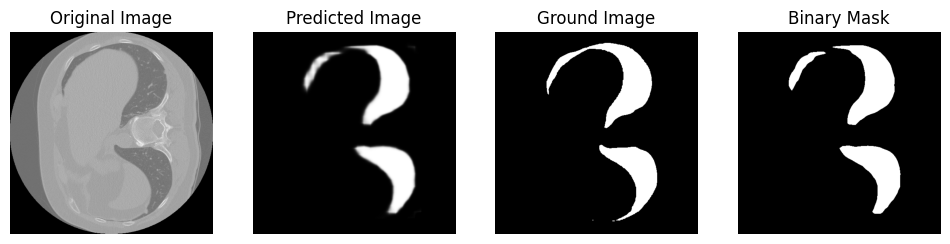

(1, 512, 512)
DICE loss :  0.01884510281190599


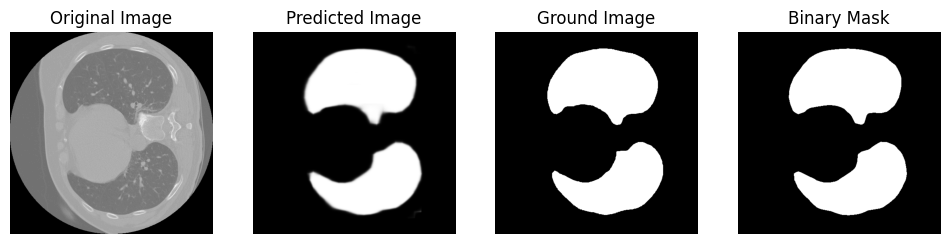

(1, 512, 512)
DICE loss :  0.025566446197636927


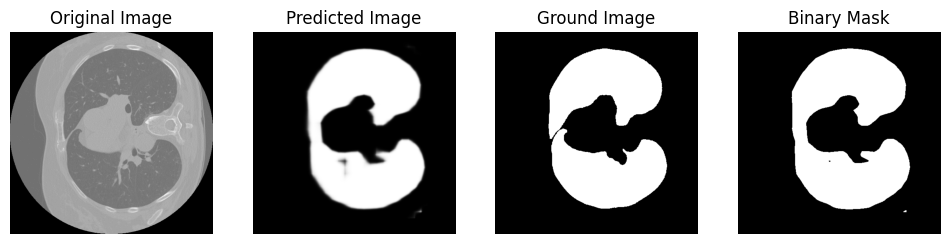

(1, 512, 512)
DICE loss :  0.03890119097501954


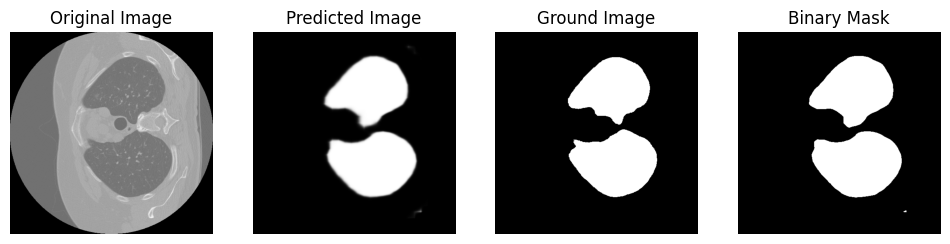

(1, 512, 512)
DICE loss :  0.022753460646267154


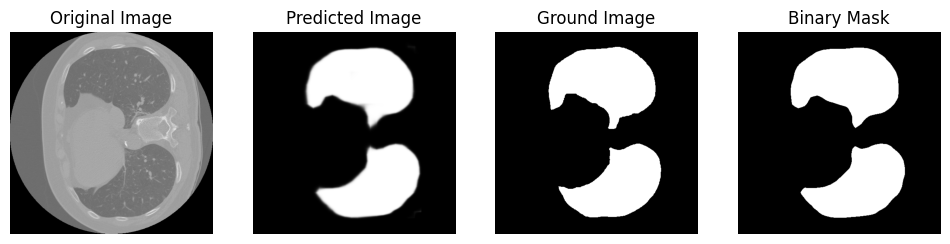

(1, 512, 512)
DICE loss :  0.10436456199195865


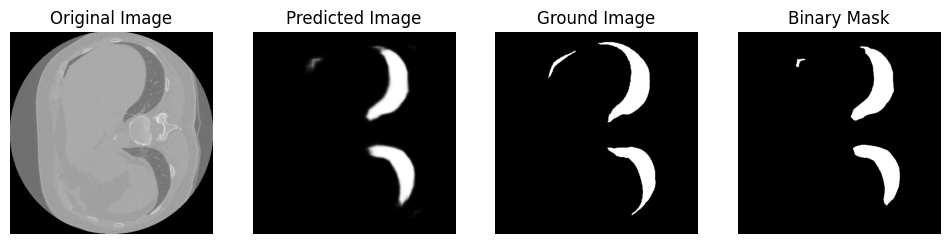

(1, 512, 512)
DICE loss :  0.026454952823692146


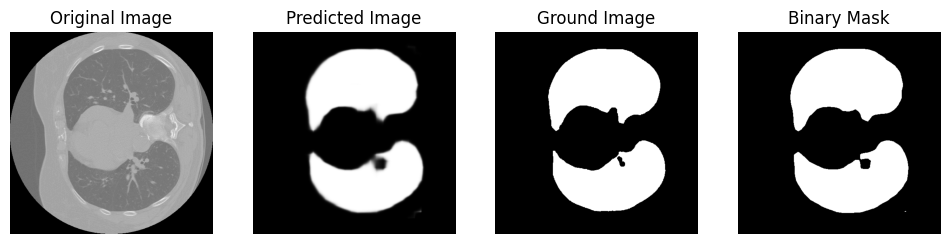

(1, 512, 512)
DICE loss :  0.032215665417853034


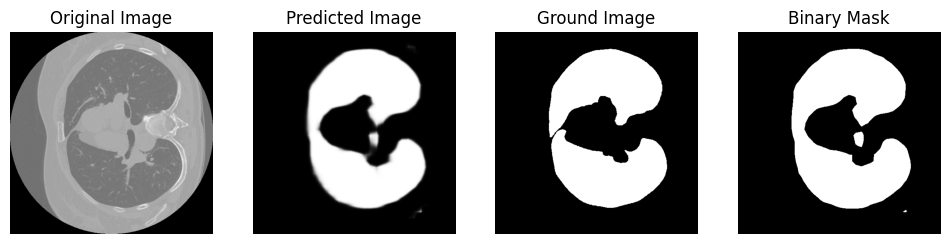

(1, 512, 512)
DICE loss :  0.021658079481934656


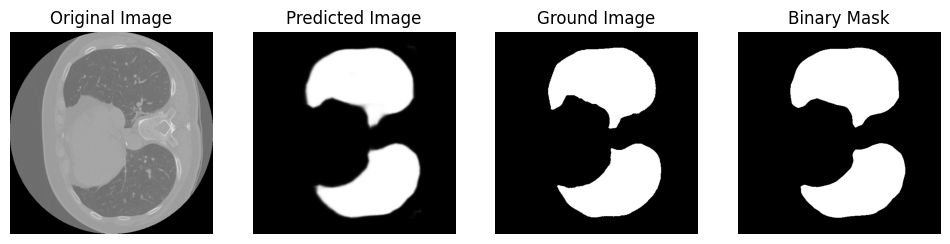

(1, 512, 512)
DICE loss :  0.028760290686826062


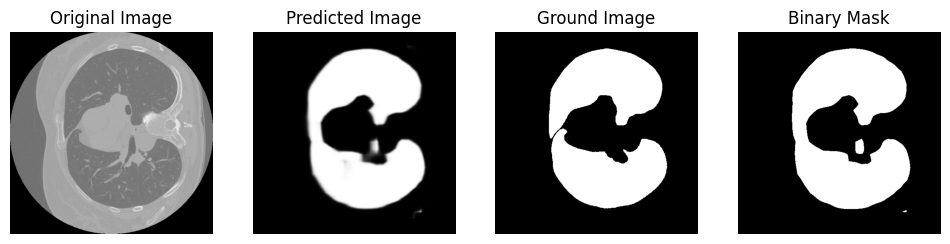

(1, 512, 512)
DICE loss :  0.25520643039892665


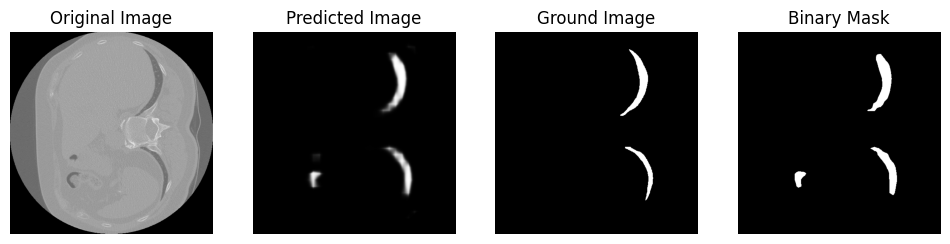

(1, 512, 512)
DICE loss :  0.37045630317335476


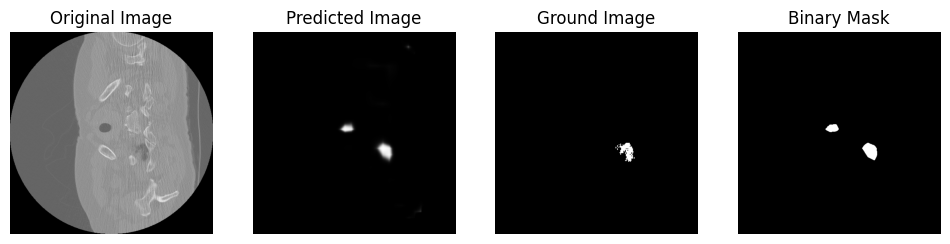

(1, 512, 512)
DICE loss :  0.03292155264319785


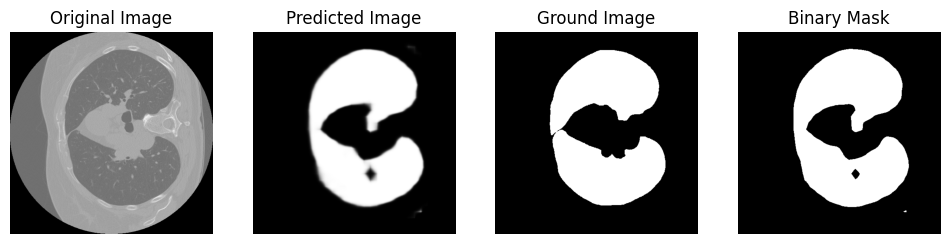

(1, 512, 512)
DICE loss :  1.0


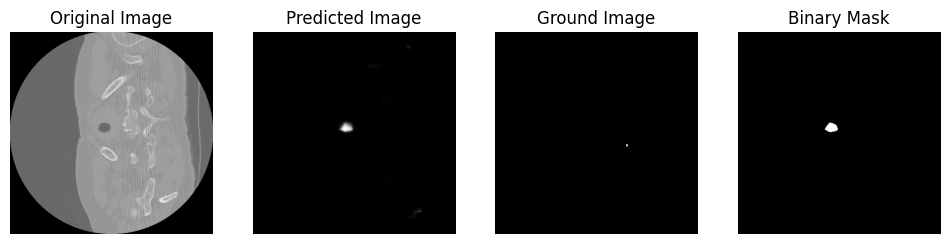

(1, 512, 512)
DICE loss :  0.02241699867204372


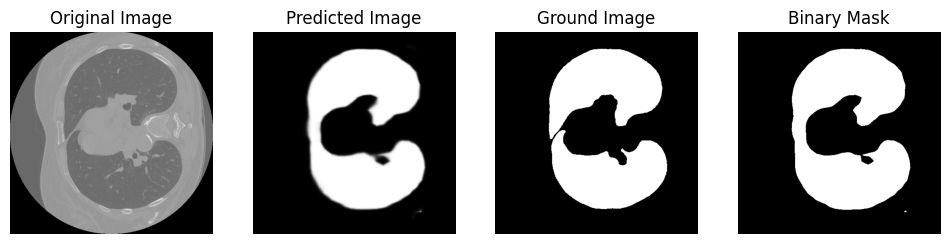

(1, 512, 512)
DICE loss :  1.0


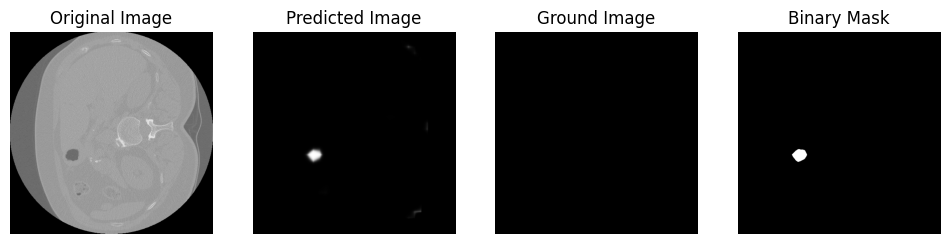

(1, 512, 512)
DICE loss :  1.0


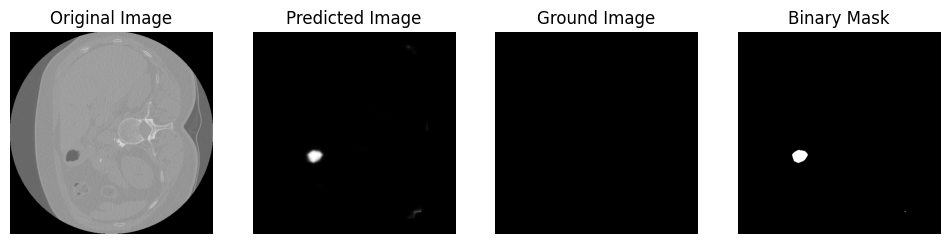

(1, 512, 512)
DICE loss :  0.022303692227529703


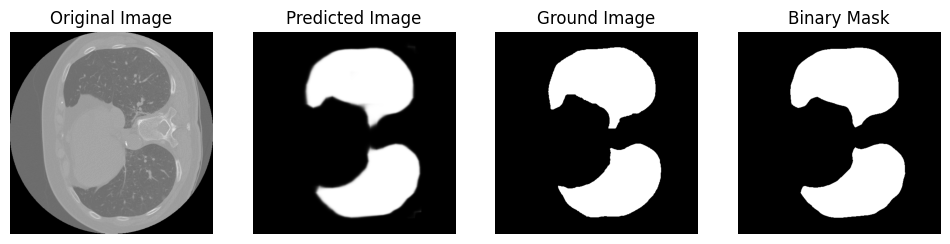

(1, 512, 512)
DICE loss :  0.08498119476704924


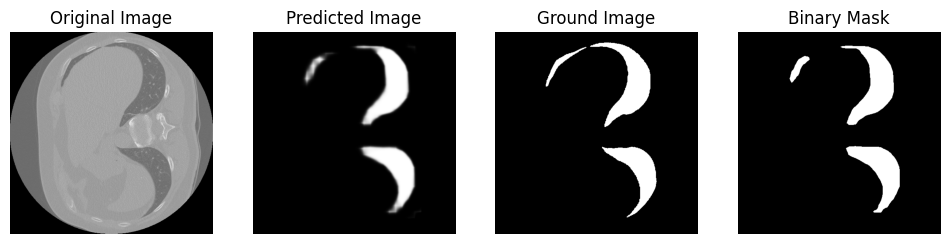

(1, 512, 512)
DICE loss :  0.023772678368850664


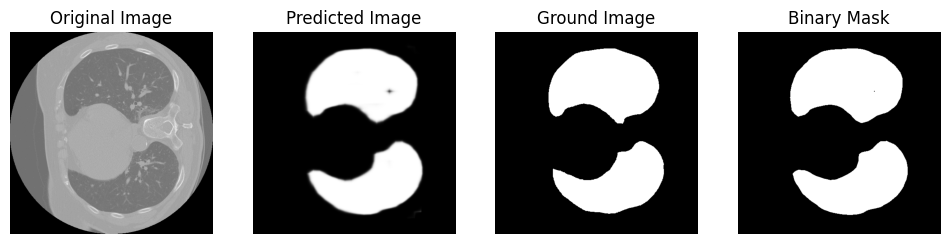

(1, 512, 512)
DICE loss :  0.025268179613024633


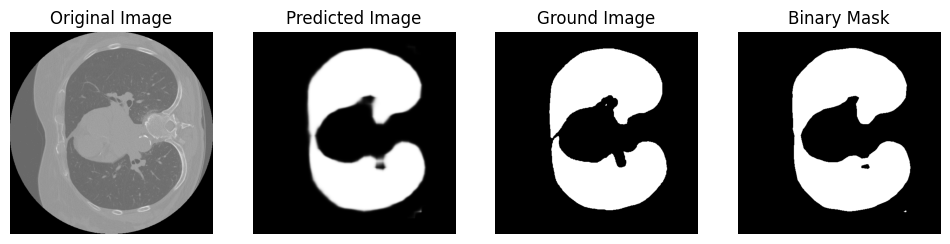

(1, 512, 512)
DICE loss :  0.03320695251634542


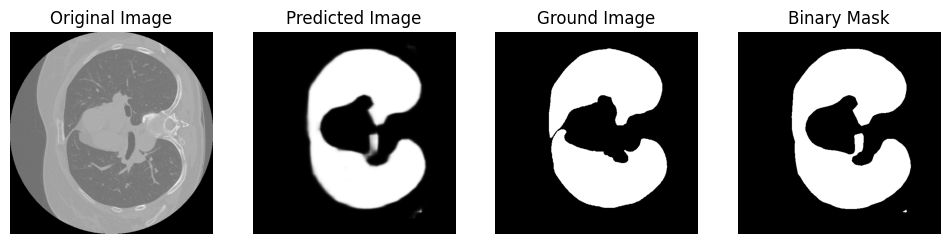

(1, 512, 512)
DICE loss :  1.0


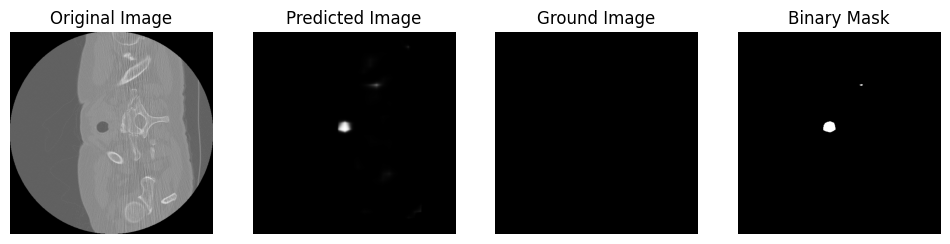

(1, 512, 512)
DICE loss :  0.021007403883394837


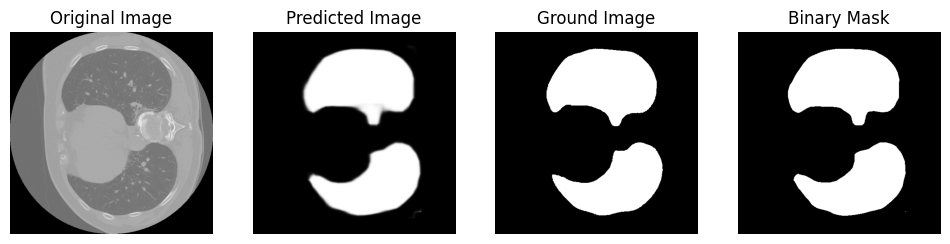

(1, 512, 512)
DICE loss :  0.020578710957975588


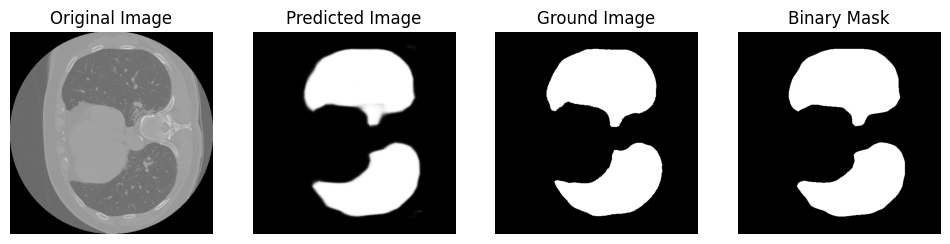

(1, 512, 512)
DICE loss :  0.027954773067112693


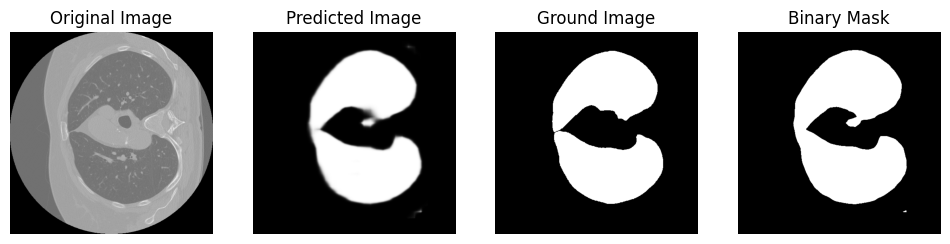

(1, 512, 512)
DICE loss :  0.029614604462562144


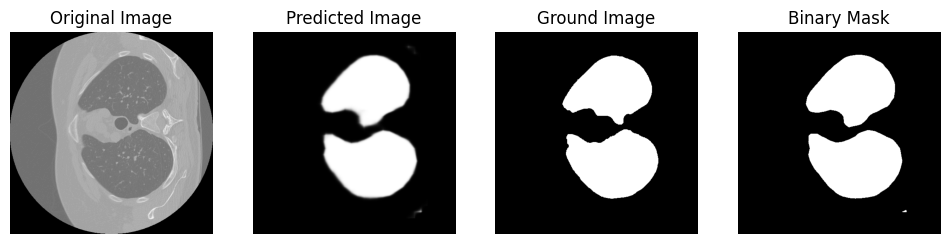

(1, 512, 512)
DICE loss :  0.02183425611723666


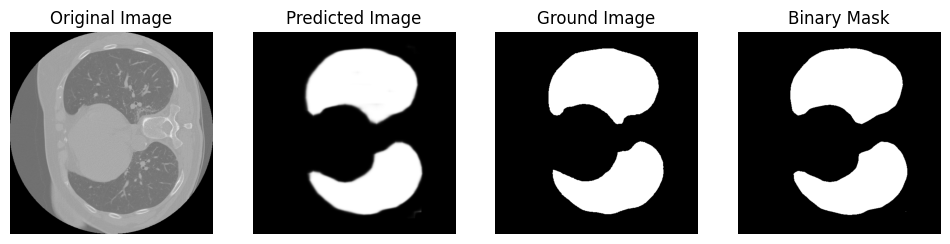

(1, 512, 512)
DICE loss :  0.14466874912623218


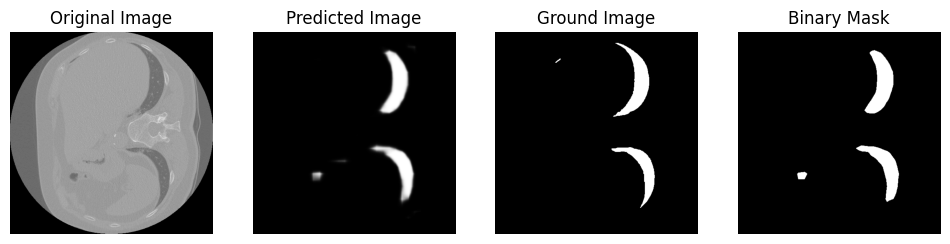

(1, 512, 512)
DICE loss :  0.05019759335741636


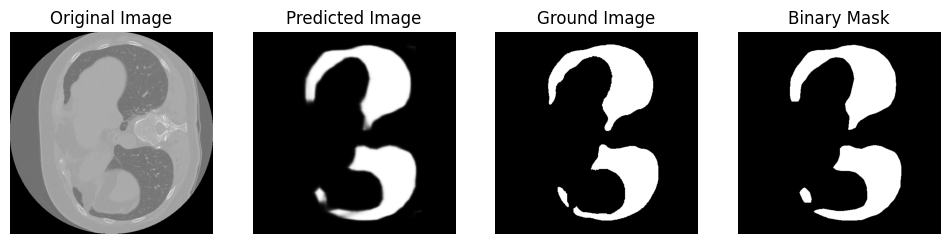

(1, 512, 512)
DICE loss :  0.03130640871956303


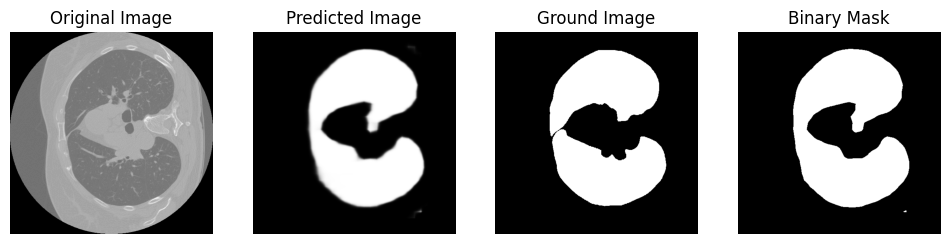

(1, 512, 512)
DICE loss :  0.02347386796451667


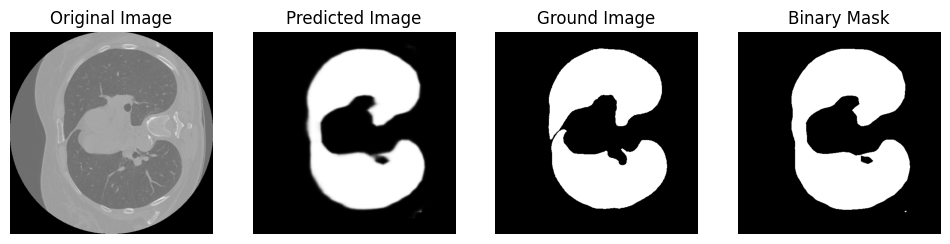

(1, 512, 512)
DICE loss :  1.0


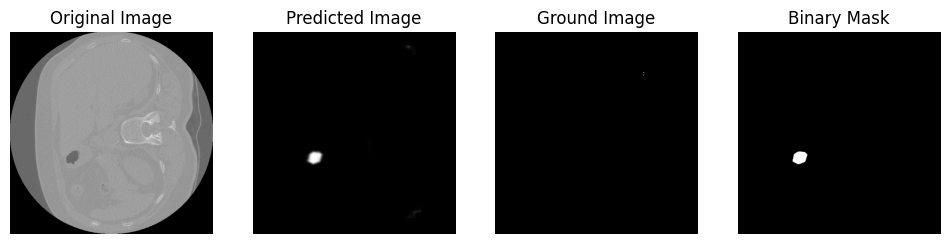

(1, 512, 512)
DICE loss :  1.0


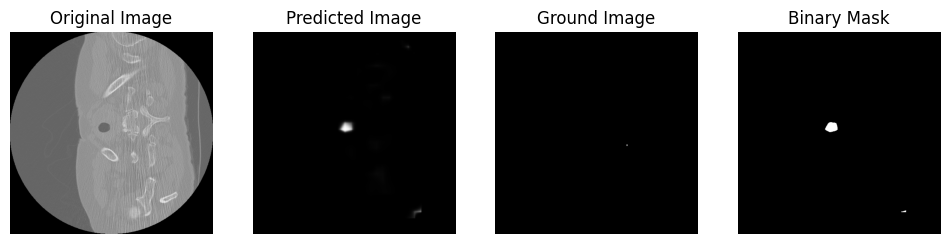

(1, 512, 512)
DICE loss :  0.03771954522956611


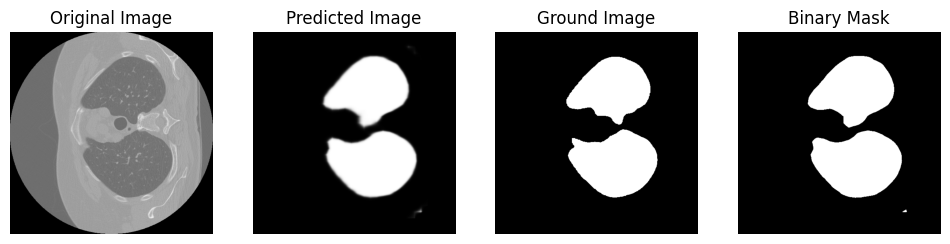

(1, 512, 512)
DICE loss :  0.2505210504383072


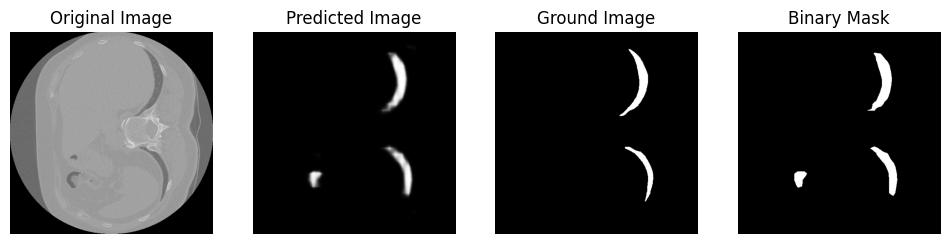

(1, 512, 512)
DICE loss :  0.03487811993303658


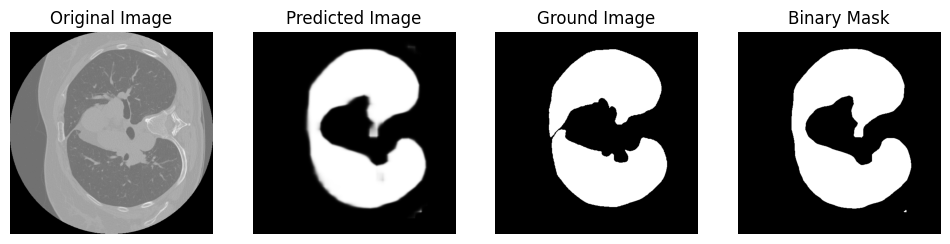

(1, 512, 512)
DICE loss :  1.0


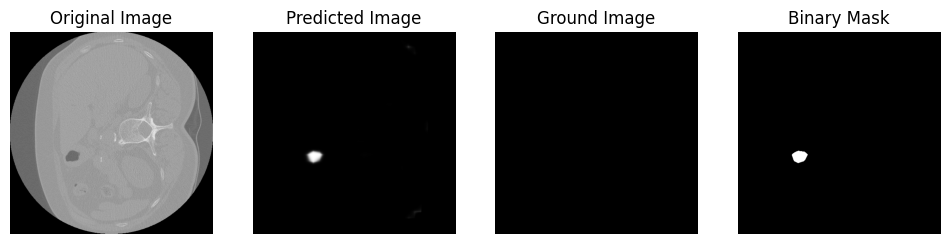

(1, 512, 512)
DICE loss :  0.028081516007278817


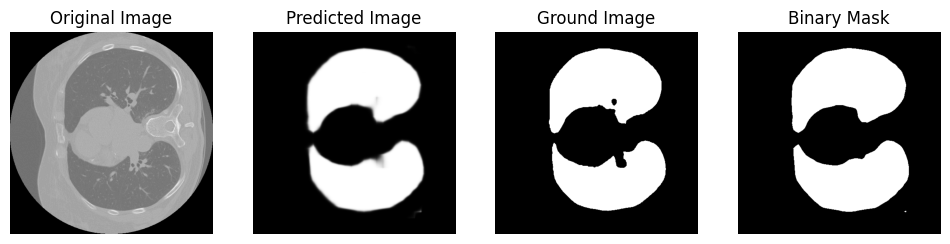

(1, 512, 512)
DICE loss :  0.20457169245023987


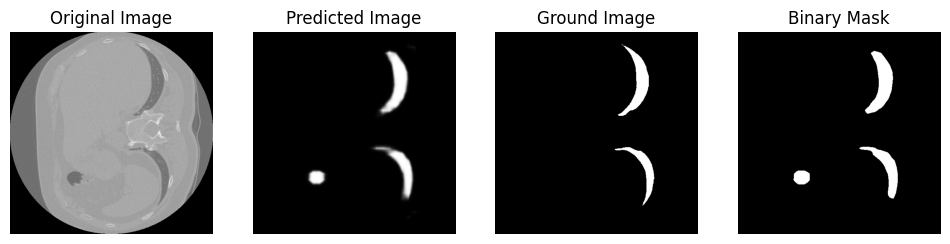

(1, 512, 512)
DICE loss :  0.024114212589043782


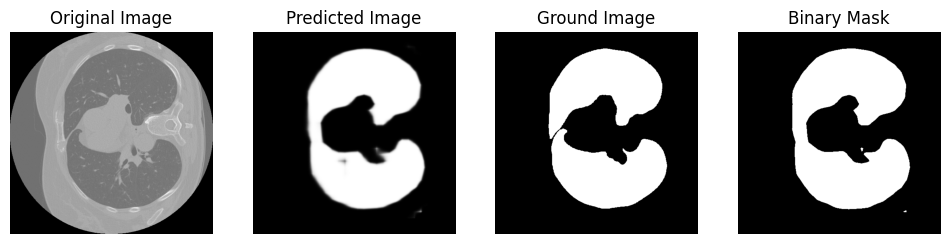

(1, 512, 512)
DICE loss :  0.02674701656481726


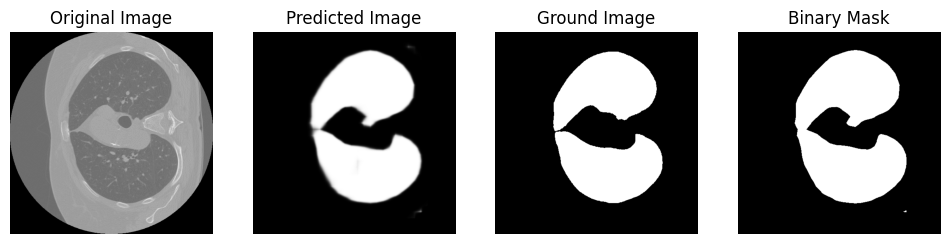

(1, 512, 512)
DICE loss :  0.022762384049819895


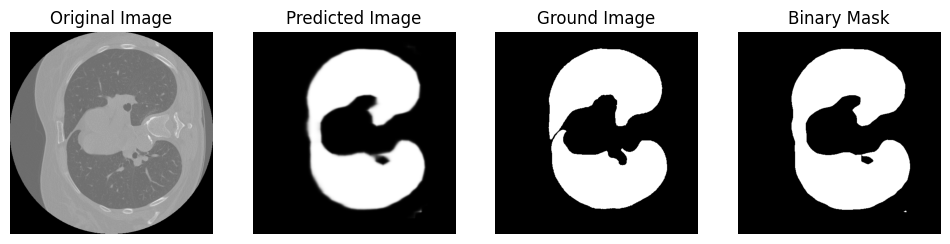

(1, 512, 512)
DICE loss :  0.04997915308063483


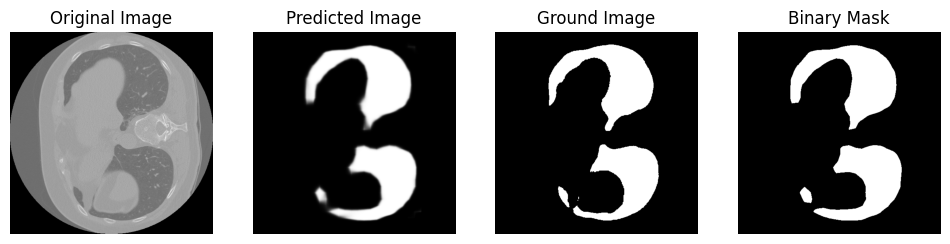

(1, 512, 512)
DICE loss :  0.02233124908348416


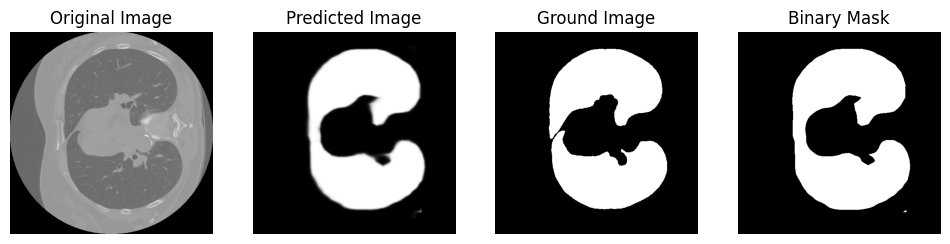

(1, 512, 512)
DICE loss :  0.02630482971726844


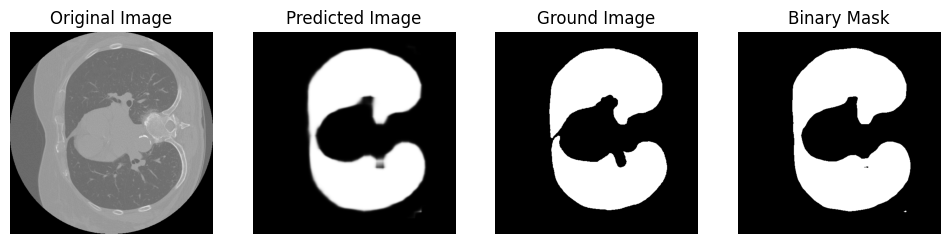

(1, 512, 512)
DICE loss :  0.055999148302178114


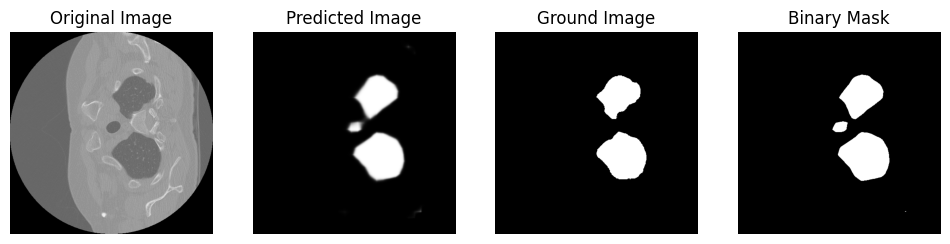

(1, 512, 512)
DICE loss :  0.039071631324208767


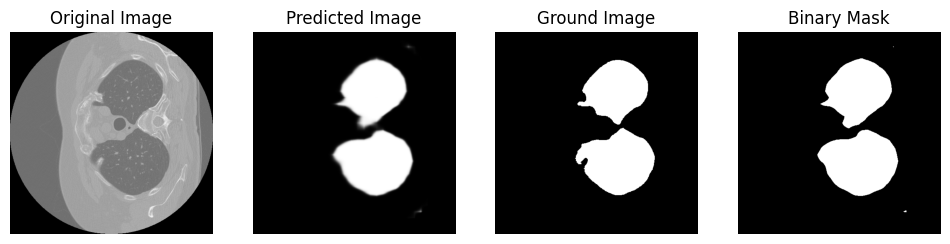

(1, 512, 512)
DICE loss :  0.024120236311628185


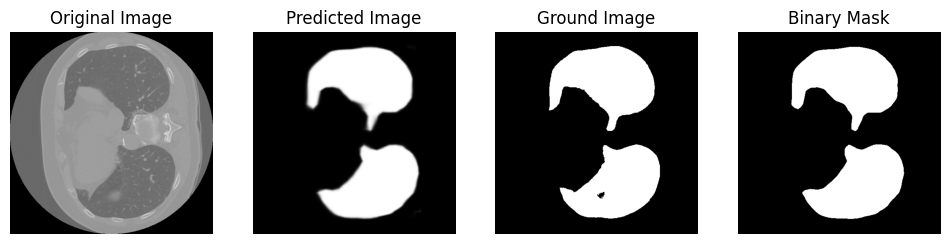

(1, 512, 512)
DICE loss :  0.03365438314625657


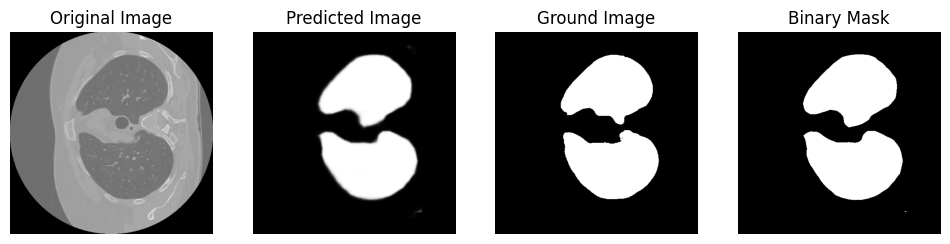

(1, 512, 512)
DICE loss :  0.05260290498019704


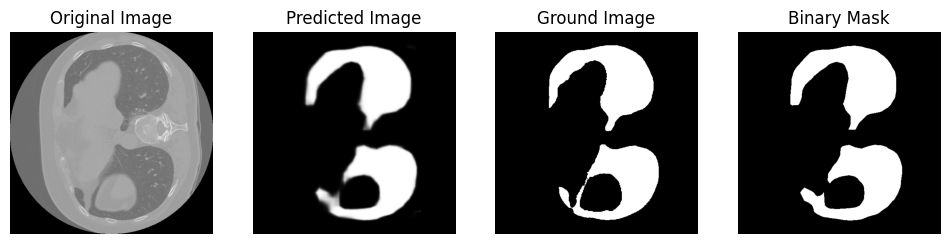

(1, 512, 512)
DICE loss :  0.09385612843493518


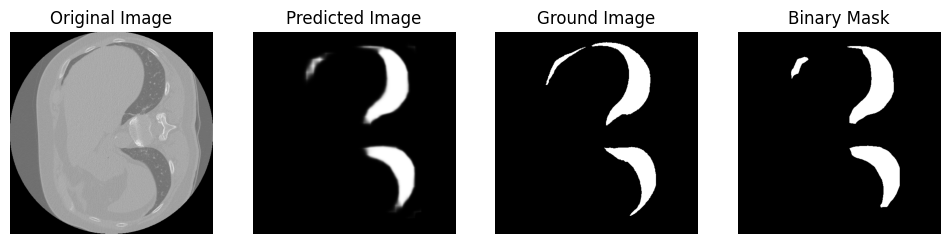

(1, 512, 512)
DICE loss :  0.03292930708337194


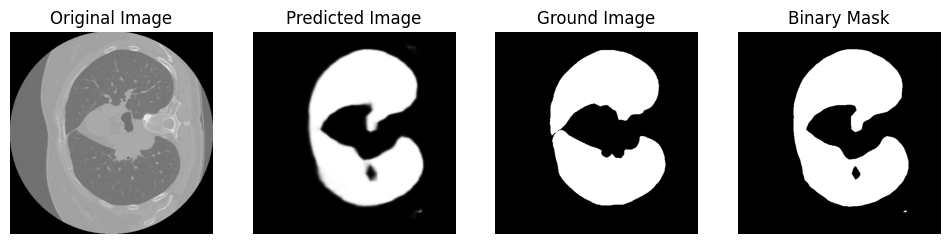

(1, 512, 512)
DICE loss :  0.10513627536358905


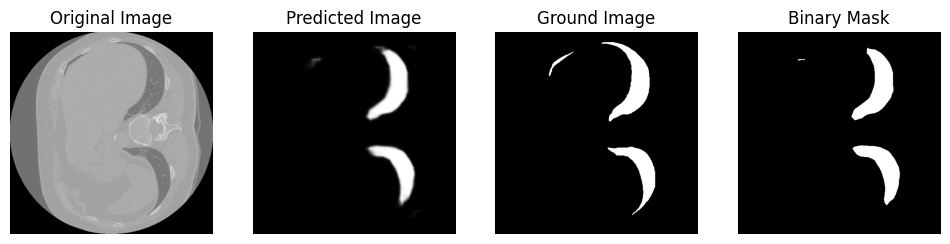

(1, 512, 512)
DICE loss :  0.02838334789417185


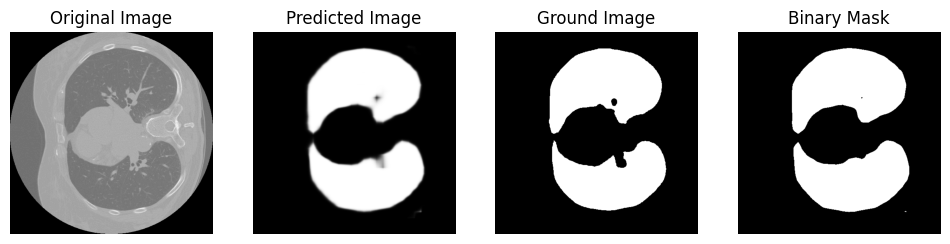

(1, 512, 512)
DICE loss :  0.03236138348483508


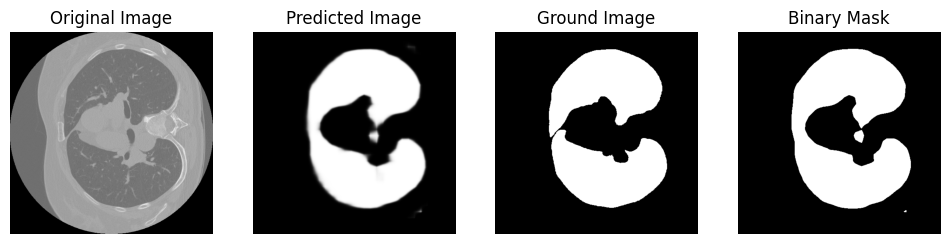

(1, 512, 512)
DICE loss :  0.31373852906062805


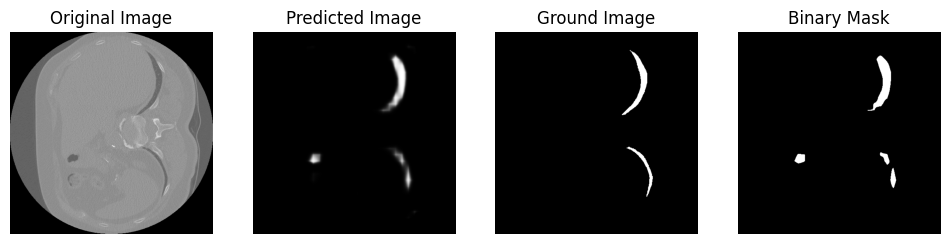

(1, 512, 512)
DICE loss :  0.04347094458169121


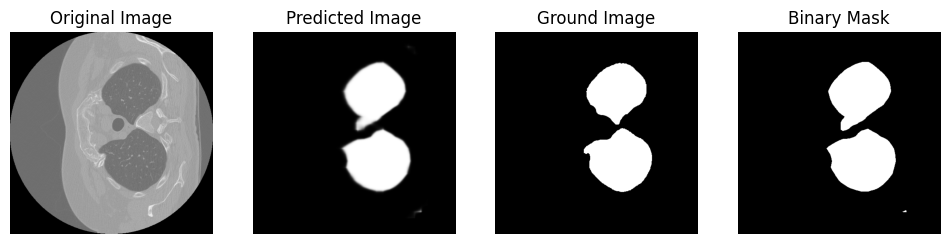

(1, 512, 512)
DICE loss :  0.026672920575435688


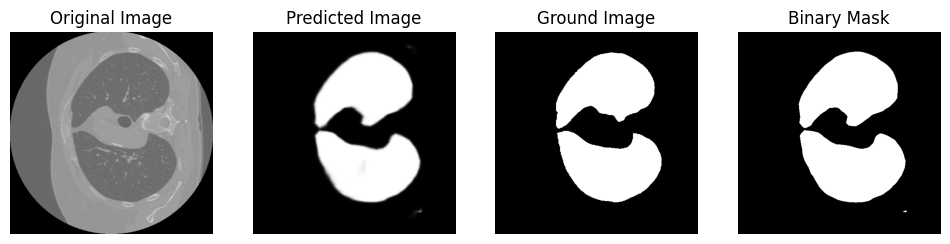

(1, 512, 512)
DICE loss :  0.019888949572257175


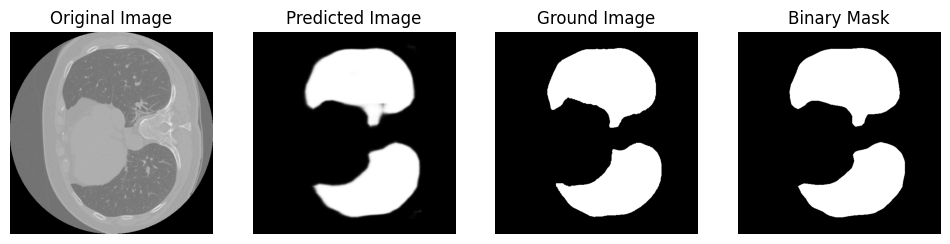

(1, 512, 512)
DICE loss :  0.10226660440421631


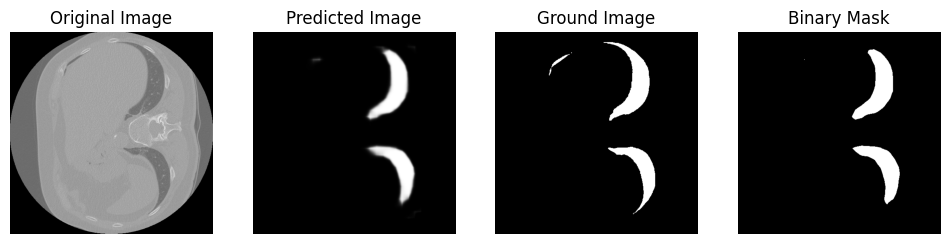

(1, 512, 512)
DICE loss :  0.040081919251151565


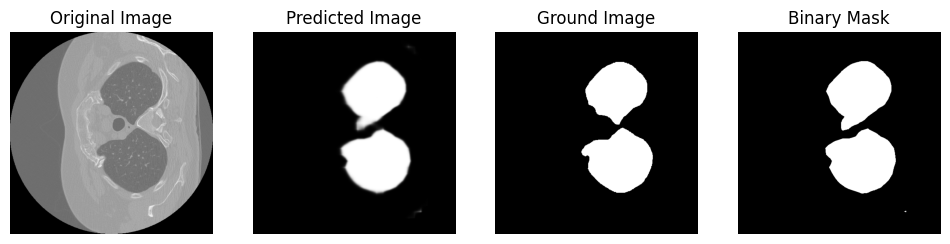

(1, 512, 512)
DICE loss :  0.08231627008537123


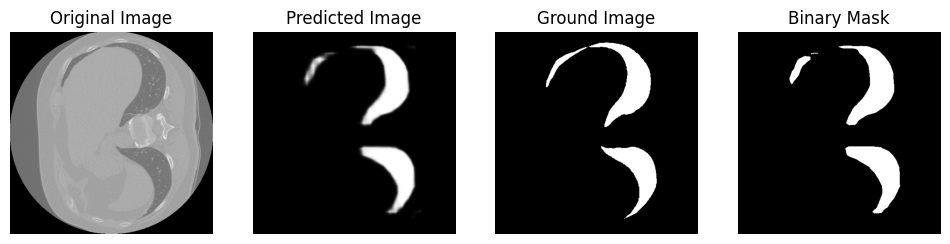

(1, 512, 512)
DICE loss :  0.02056497848204697


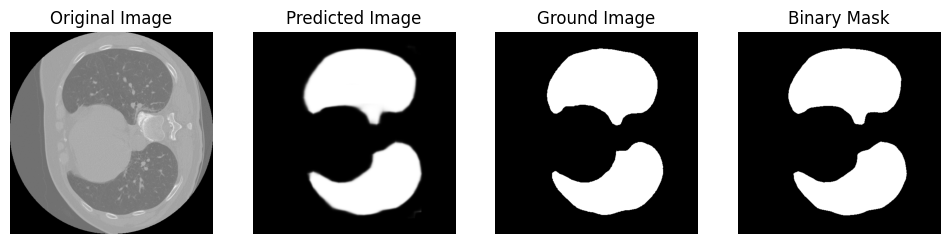

(1, 512, 512)
DICE loss :  0.03691694531706713


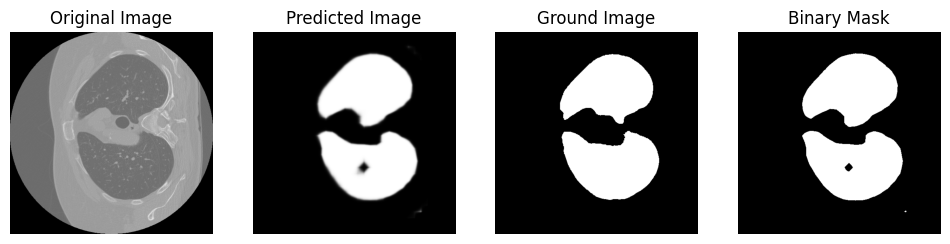

(1, 512, 512)
DICE loss :  0.03298017067244974


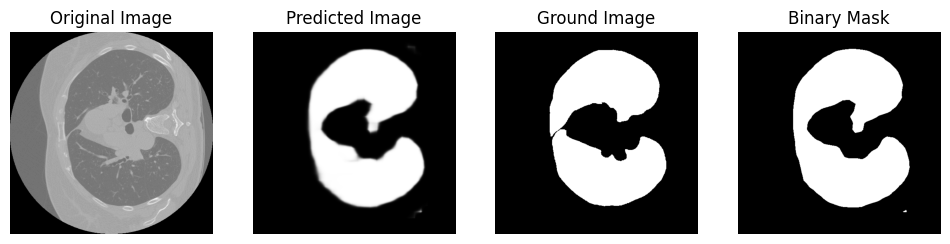

(1, 512, 512)
DICE loss :  0.09397735353670633


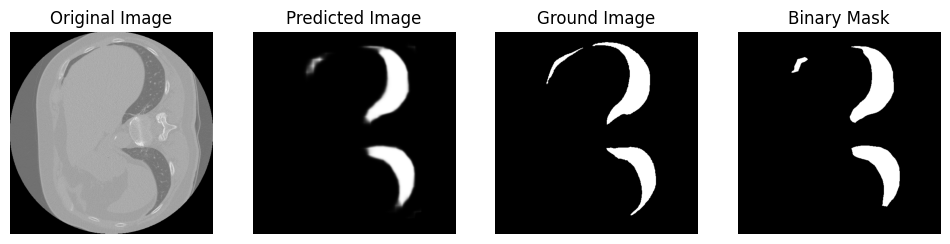

(1, 512, 512)
DICE loss :  0.025457268157087376


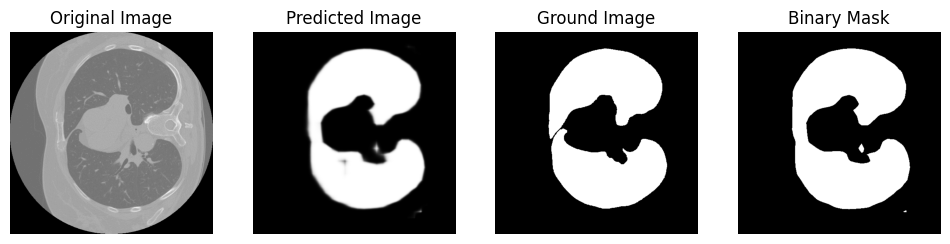

(1, 512, 512)
DICE loss :  0.026578073089776222


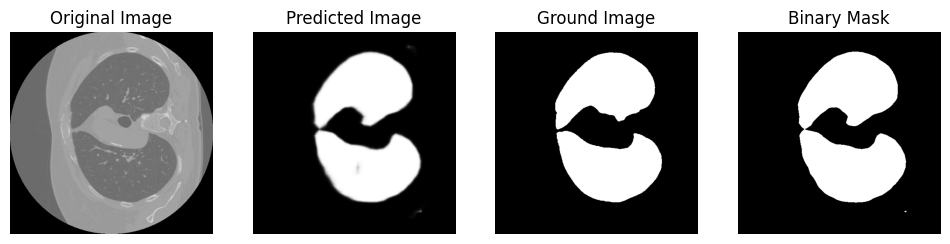

(1, 512, 512)
DICE loss :  1.0


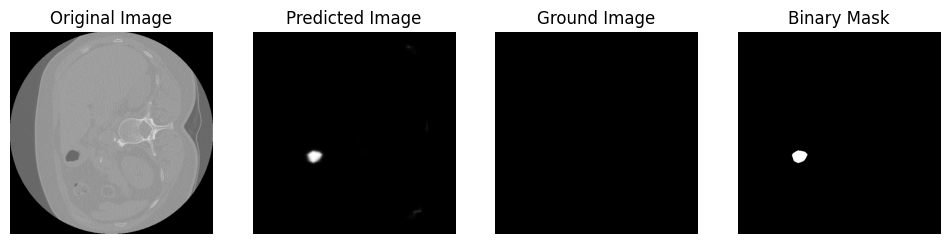

(1, 512, 512)
DICE loss :  0.026011790087449804


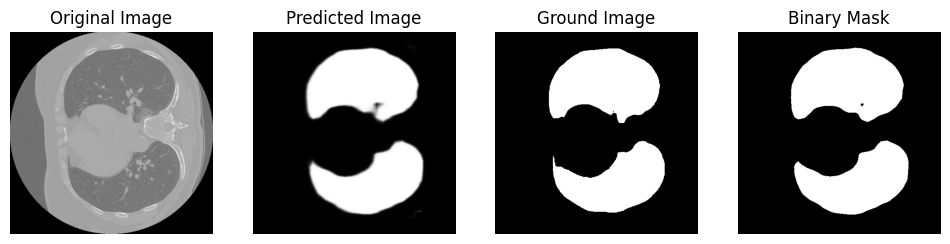

(1, 512, 512)
DICE loss :  0.060952990086494796


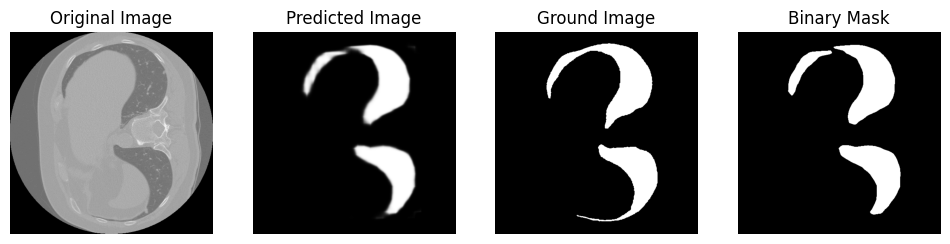

(1, 512, 512)
DICE loss :  0.025394664851873916


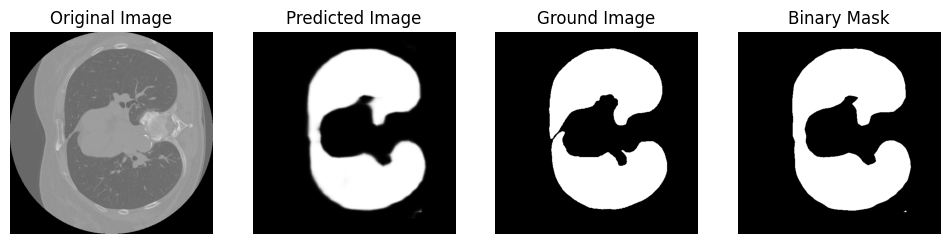

(1, 512, 512)
DICE loss :  0.05867252346072083


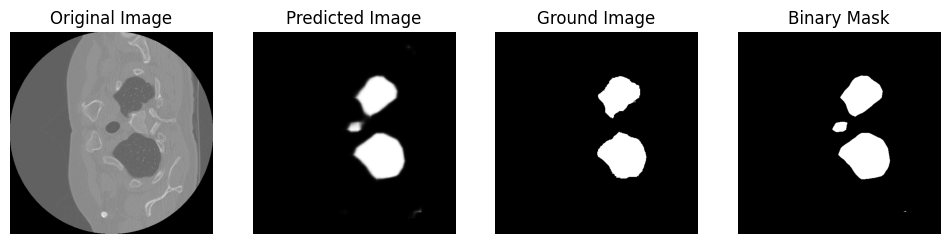

(1, 512, 512)
DICE loss :  0.034002365382023614


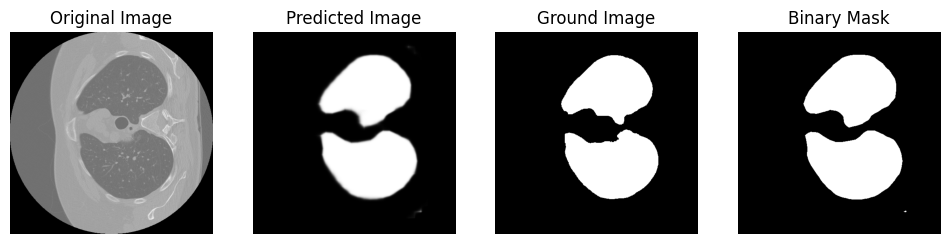

(1, 512, 512)
DICE loss :  0.08796139927667657


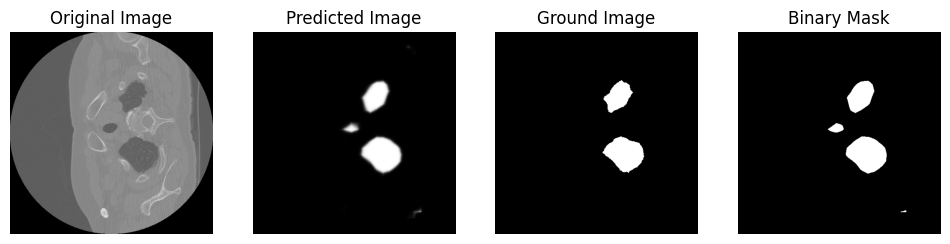

(1, 512, 512)
DICE loss :  0.07754645801331805


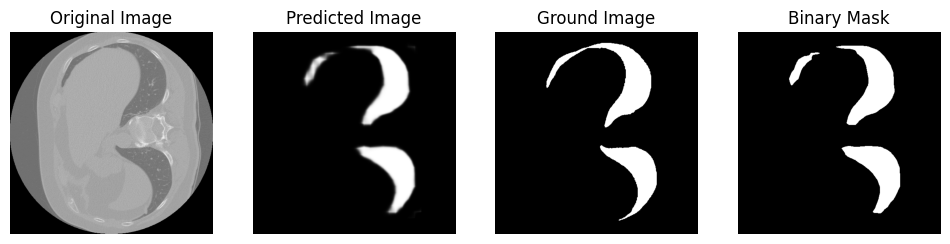

(1, 512, 512)
DICE loss :  0.03157632329730009


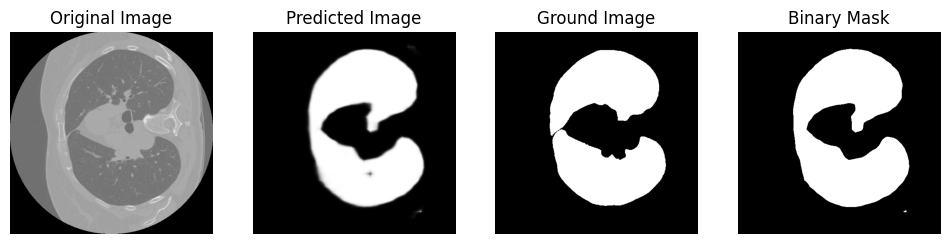

(1, 512, 512)
DICE loss :  0.0208637691746546


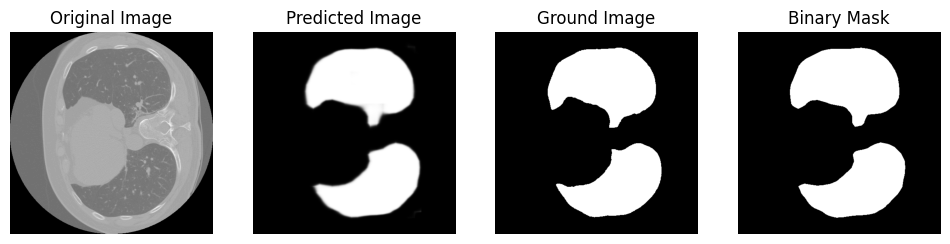

(1, 512, 512)
DICE loss :  0.18162151025075635


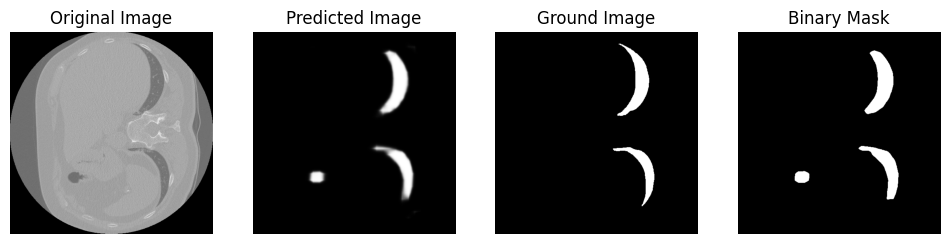

(1, 512, 512)
DICE loss :  0.03765772870674311


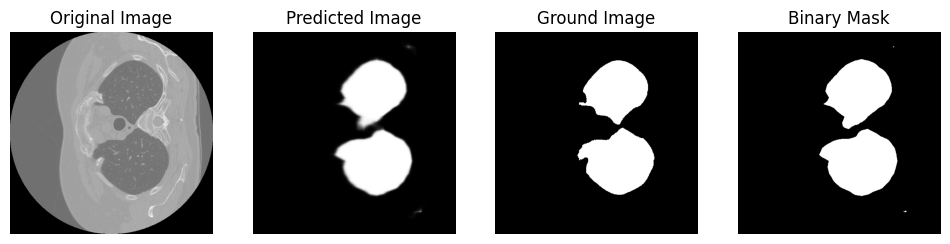

(1, 512, 512)
DICE loss :  1.0


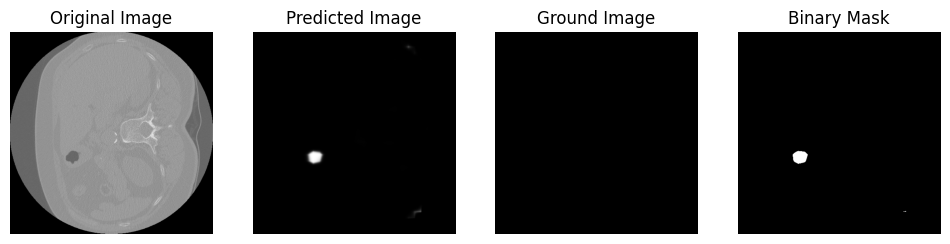

(1, 512, 512)
DICE loss :  0.029637494744562565


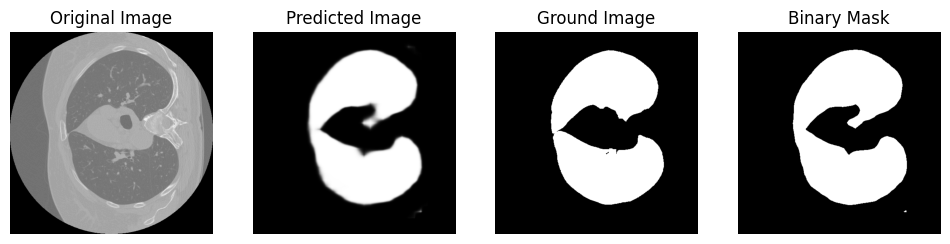

(1, 512, 512)
DICE loss :  0.024418563984260233


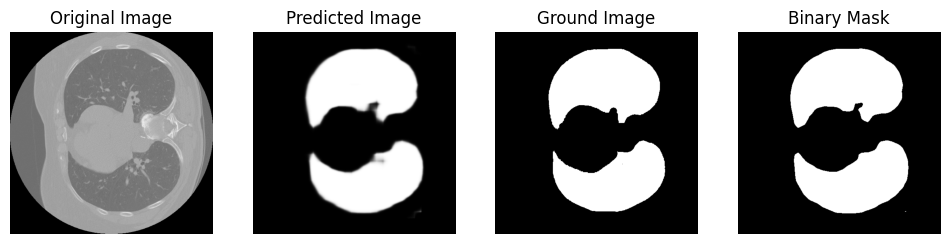

(1, 512, 512)
DICE loss :  0.021865477517724163


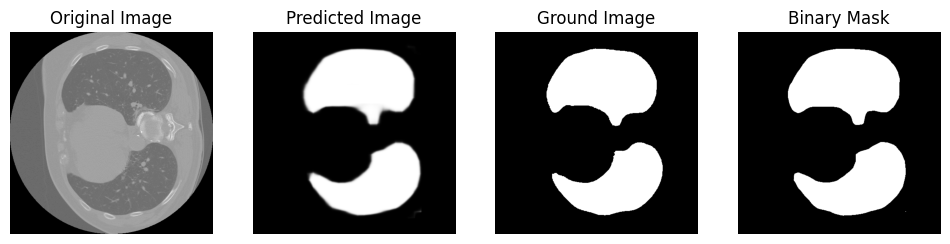

(1, 512, 512)
DICE loss :  0.020635839453994498


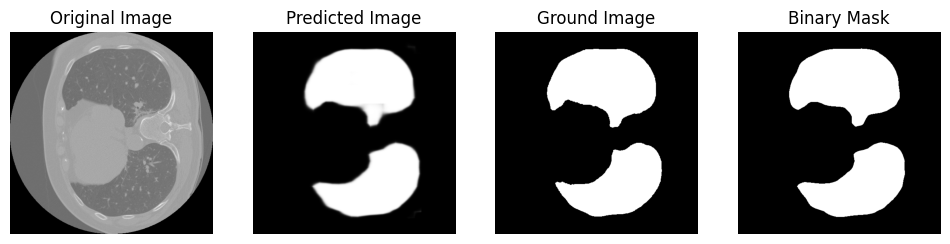

(1, 512, 512)
DICE loss :  0.056703617535911466


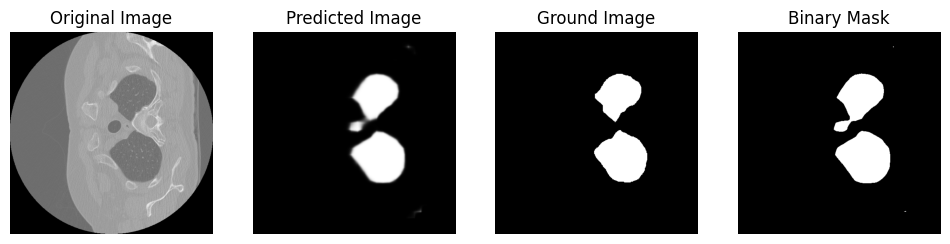

(1, 512, 512)
DICE loss :  0.07465130191144032


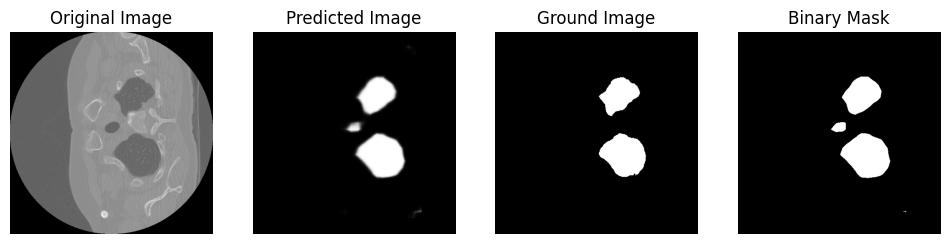

(1, 512, 512)
DICE loss :  0.0216176393984997


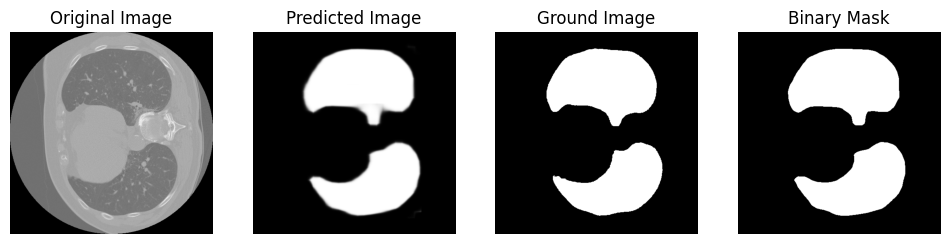

(1, 512, 512)
DICE loss :  1.0


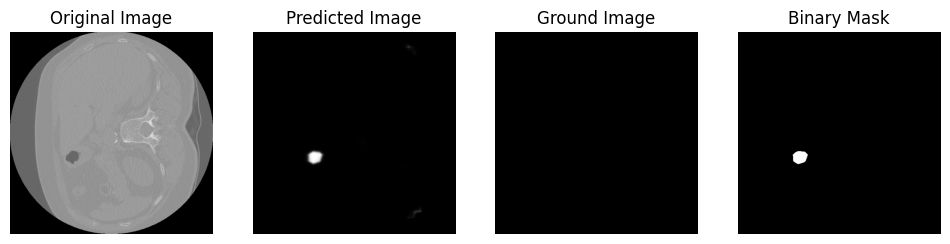

(1, 512, 512)
DICE loss :  1.0


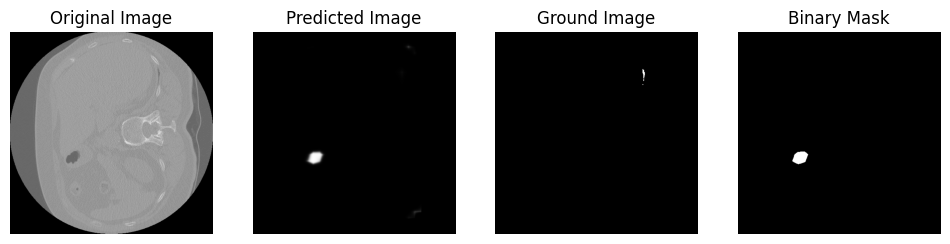

(1, 512, 512)
DICE loss :  0.05156855876217925


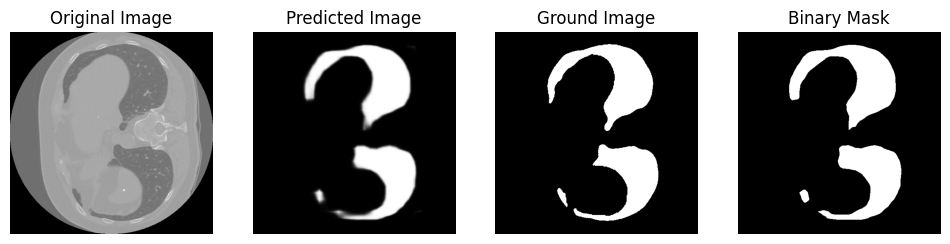

(1, 512, 512)
DICE loss :  0.056580445746045704


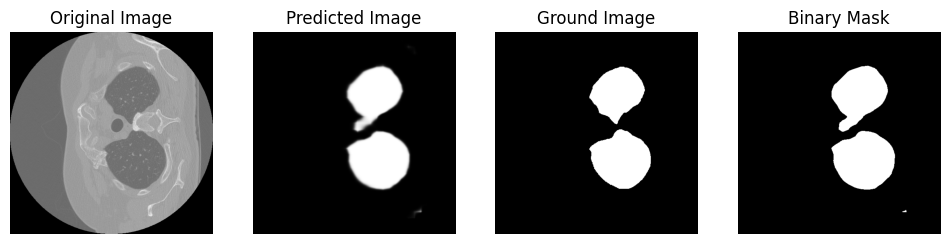

(1, 512, 512)
DICE loss :  0.028812753910367417


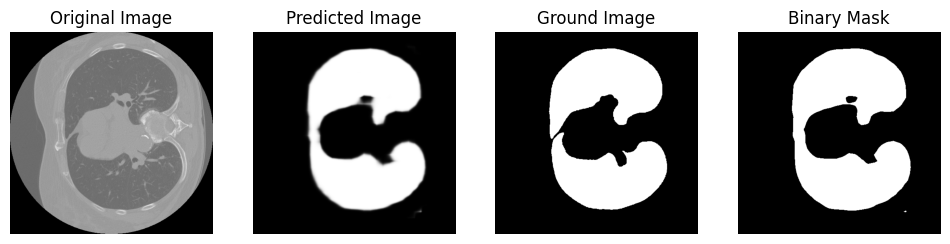

(1, 512, 512)
DICE loss :  0.604918683063844


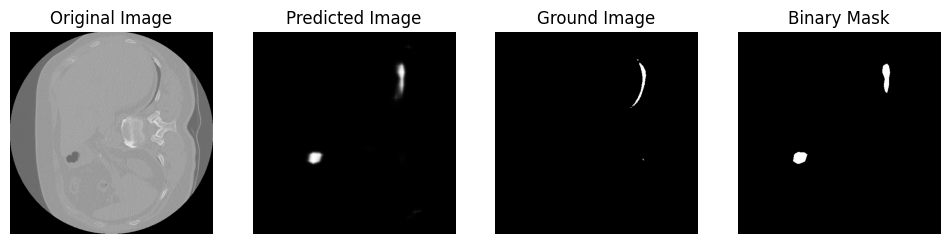

(1, 512, 512)
DICE loss :  0.032331054255245184


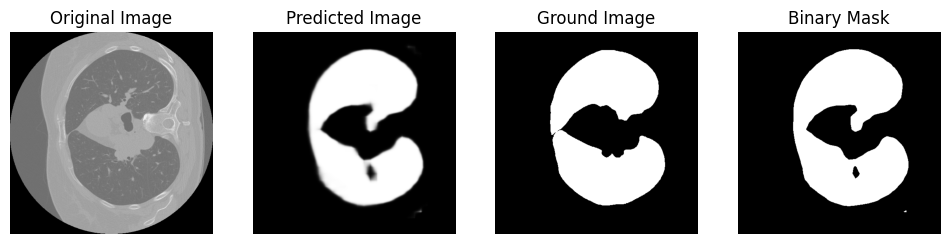

(1, 512, 512)
DICE loss :  0.02266258276104338


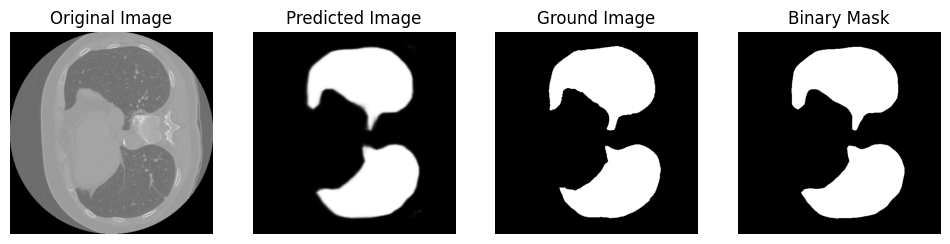

(1, 512, 512)
DICE loss :  0.05426077206490176


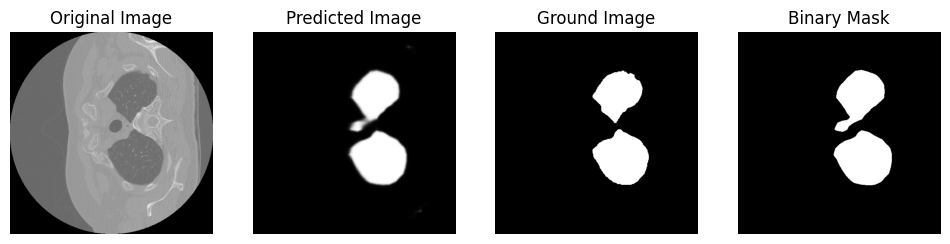

(1, 512, 512)
DICE loss :  0.02362761177120265


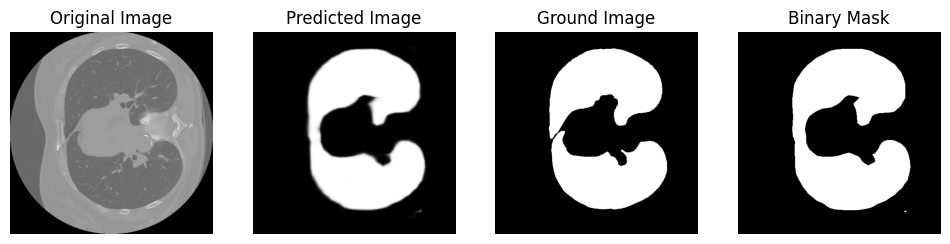

(1, 512, 512)
DICE loss :  0.036974576369186996


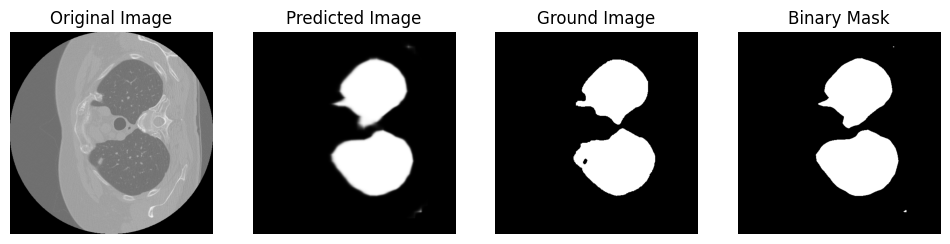

(1, 512, 512)
DICE loss :  0.08403839587241191


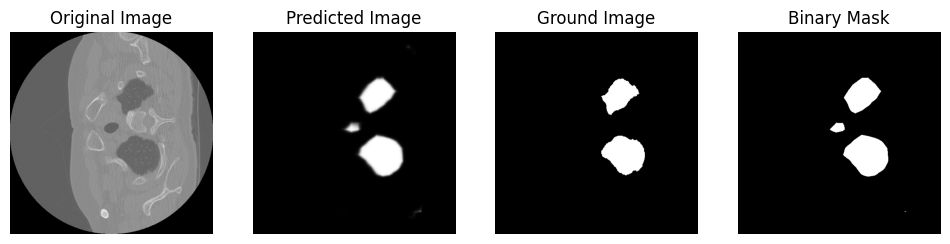

(1, 512, 512)
DICE loss :  0.05087868335680057


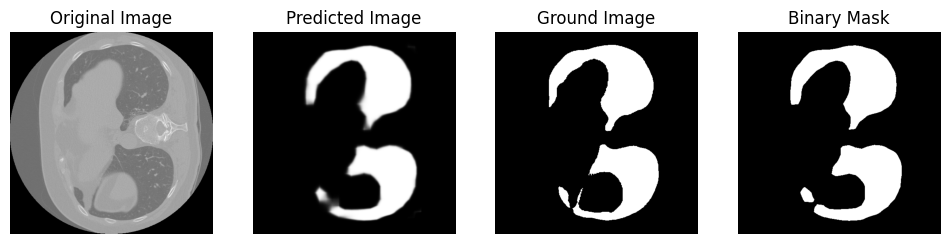

(1, 512, 512)
DICE loss :  0.05951434338506023


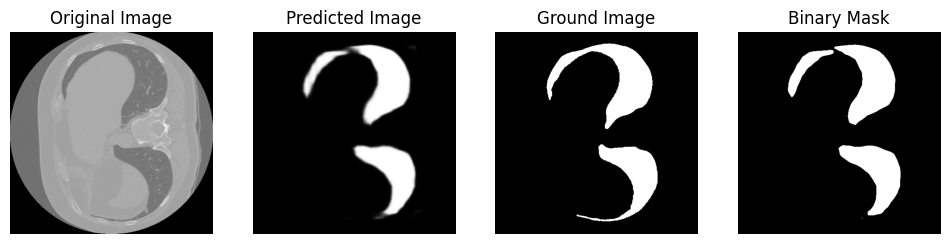

(1, 512, 512)
DICE loss :  0.026343729736347132


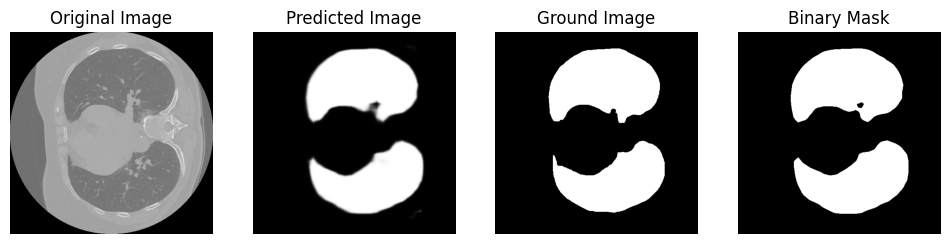

(1, 512, 512)
DICE loss :  0.07613001042375123


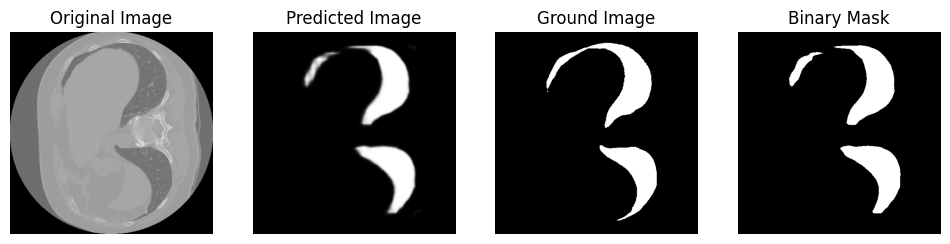

(1, 512, 512)
DICE loss :  0.19150481031186872


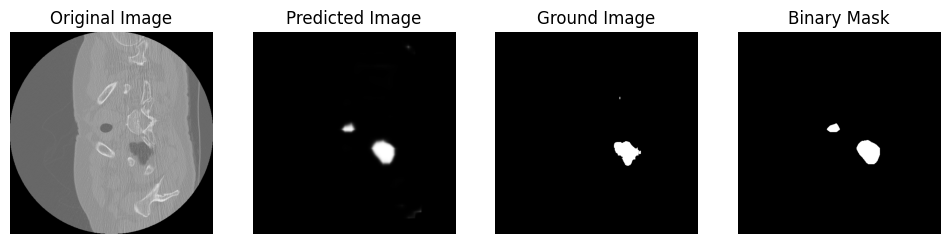

(1, 512, 512)
DICE loss :  0.027596957406649025


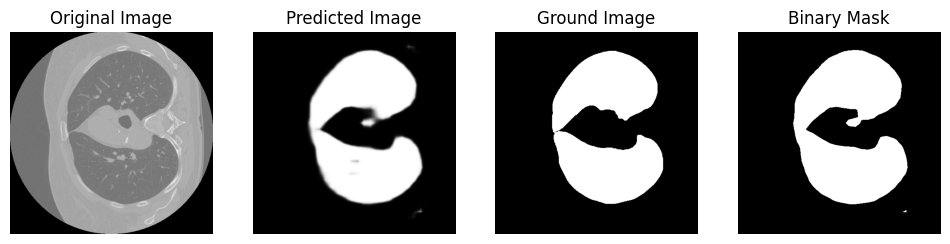

(1, 512, 512)
DICE loss :  0.03933763507747812


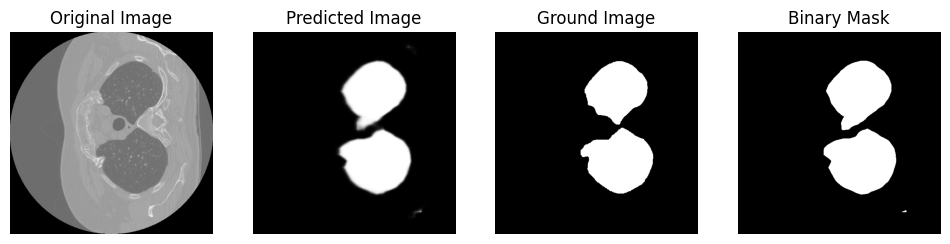

(1, 512, 512)
DICE loss :  0.03458898376033526


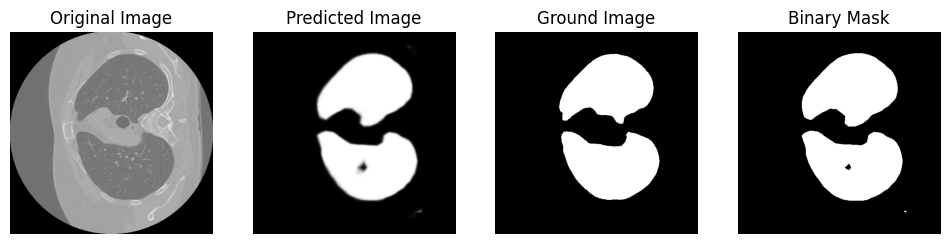

(1, 512, 512)
DICE loss :  1.0


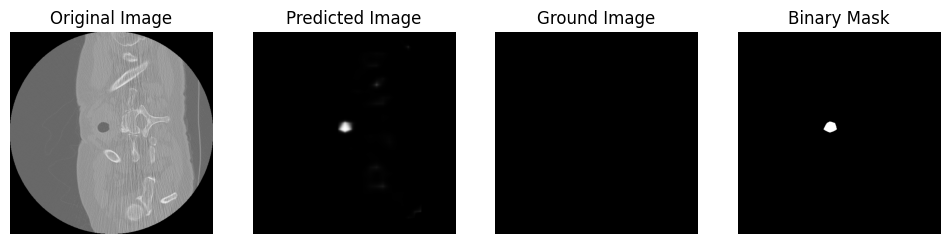

(1, 512, 512)
DICE loss :  0.037909654561680606


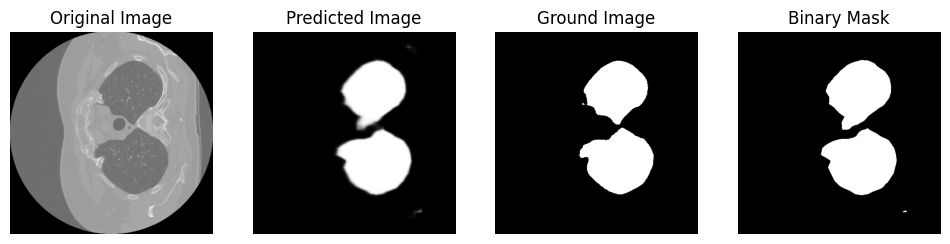

(1, 512, 512)
DICE loss :  0.055401141042181856


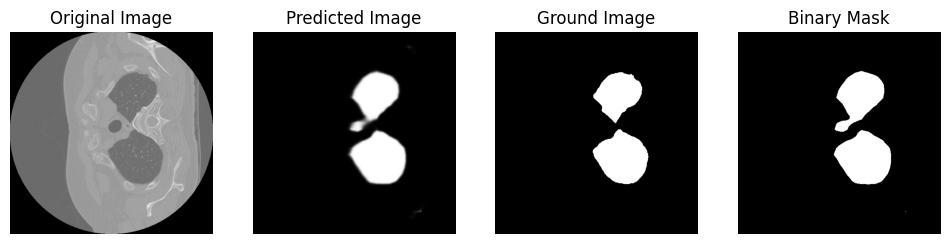

(1, 512, 512)
DICE loss :  0.03146711419902648


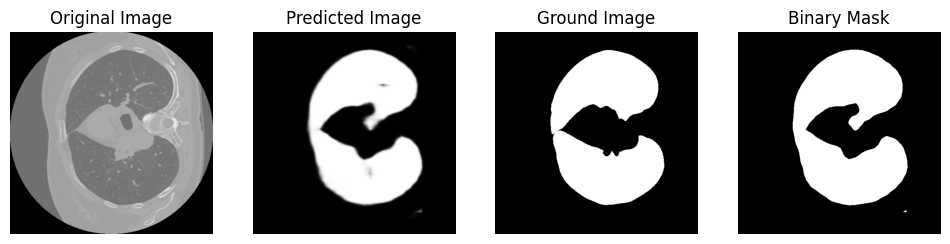

(1, 512, 512)
DICE loss :  0.05412074354346563


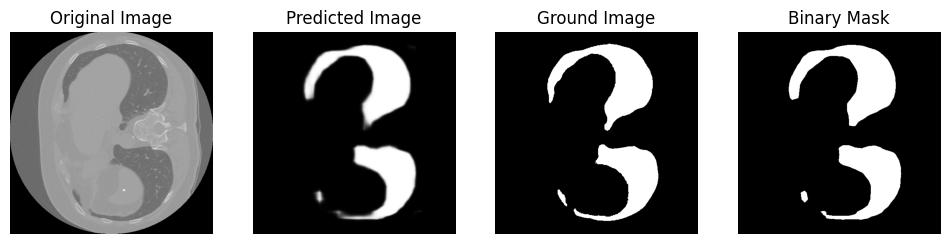

(1, 512, 512)
DICE loss :  0.07814236293131804


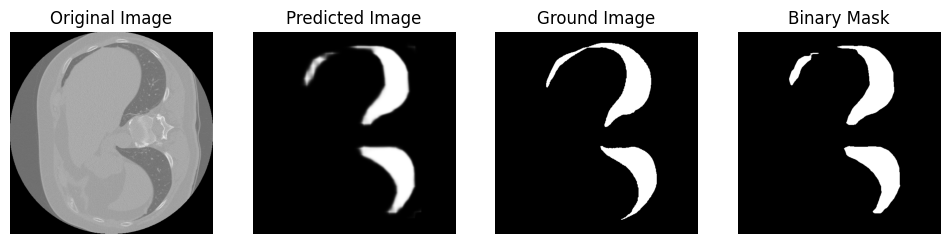

(1, 512, 512)
DICE loss :  0.021074321761002435


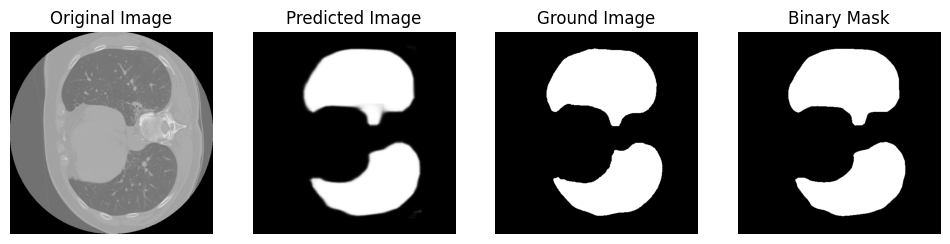

(1, 512, 512)
DICE loss :  0.41484869810095903


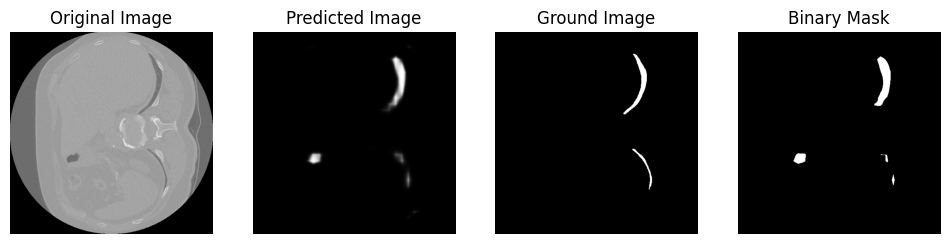

(1, 512, 512)
DICE loss :  0.05718047962982886


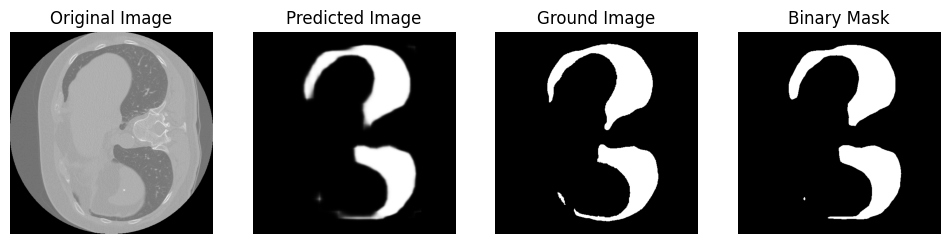

(1, 512, 512)
DICE loss :  0.03590285110887281


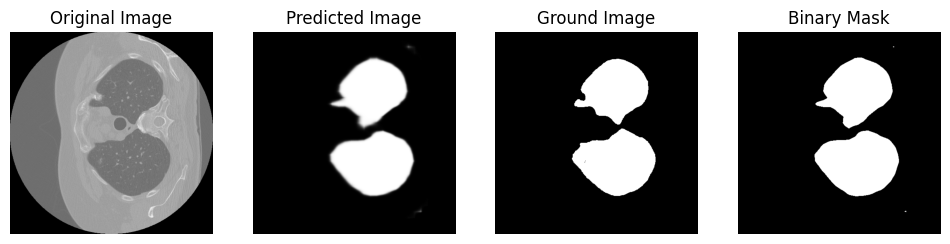

(1, 512, 512)
DICE loss :  0.03382491198941584


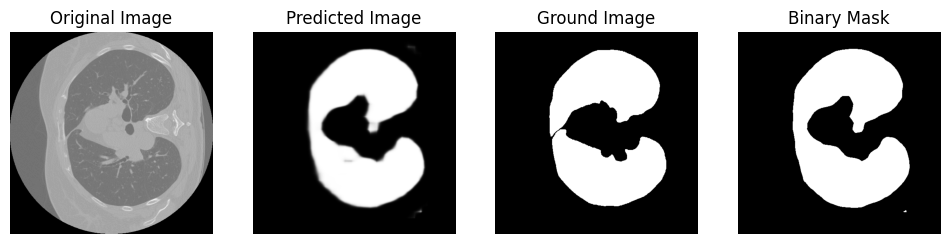

(1, 512, 512)
DICE loss :  1.0


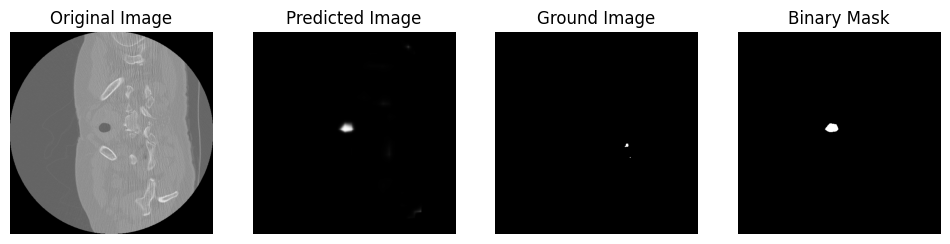

(1, 512, 512)
DICE loss :  0.03140501297600018


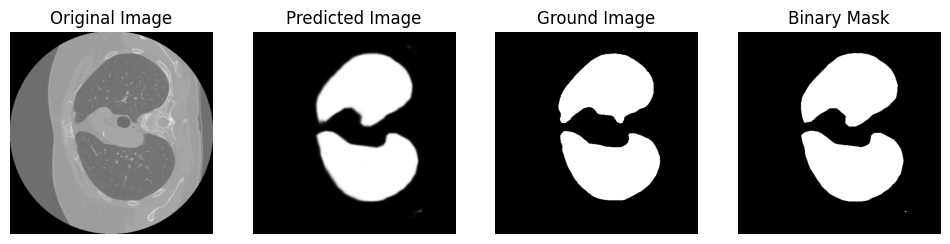

(1, 512, 512)
DICE loss :  0.033803249066785335


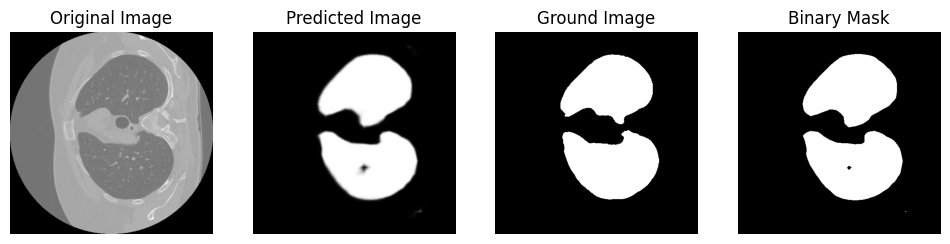

(1, 512, 512)
DICE loss :  0.027174823581512686


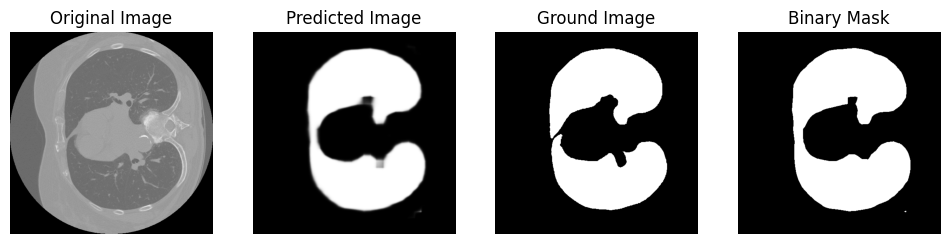

(1, 512, 512)
DICE loss :  0.11083437110872552


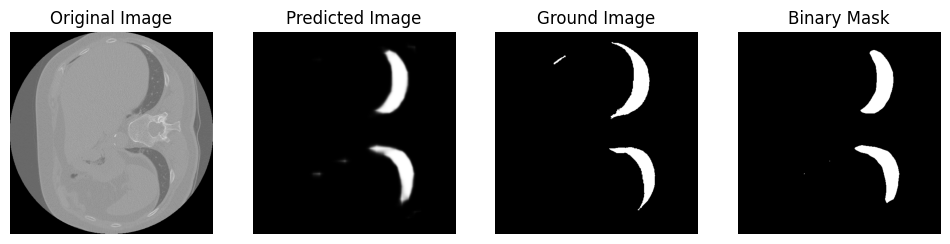

(1, 512, 512)
DICE loss :  0.03246695704934244


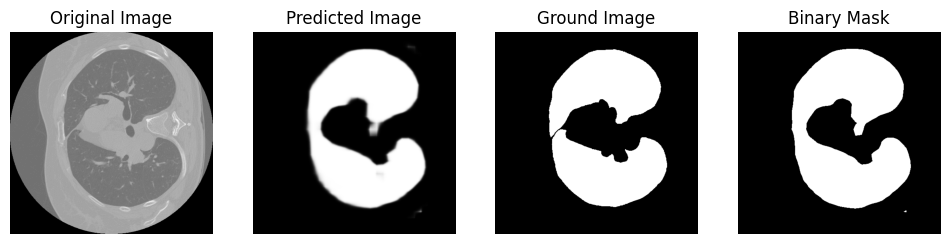

(1, 512, 512)
DICE loss :  0.09888707733813085


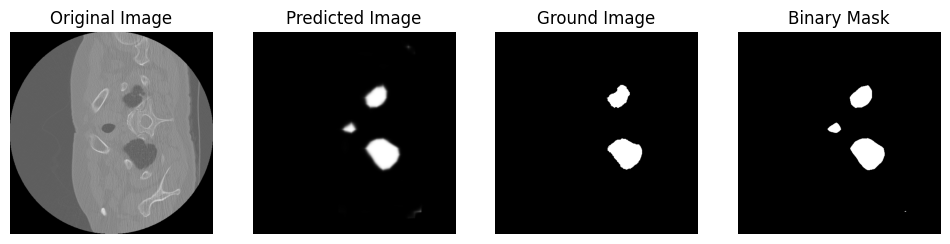

(1, 512, 512)
DICE loss :  1.0


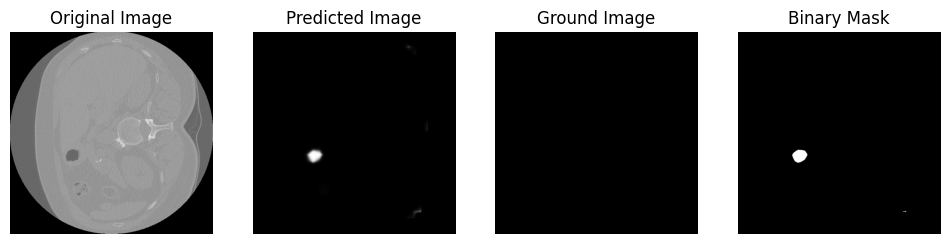

(1, 512, 512)
DICE loss :  0.06212391165511444


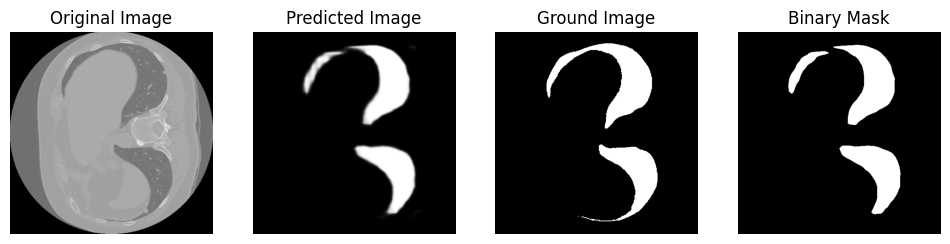

(1, 512, 512)
DICE loss :  0.03187542351850525


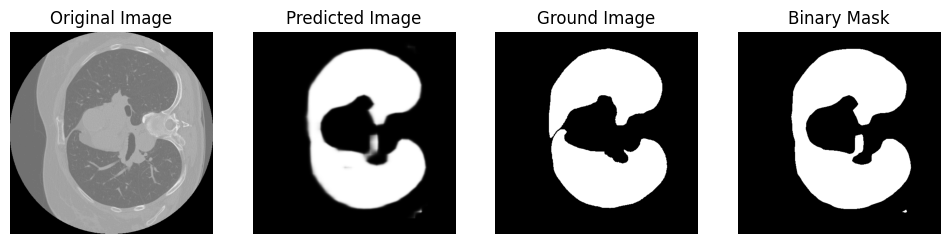

(1, 512, 512)
DICE loss :  0.02773001866514402


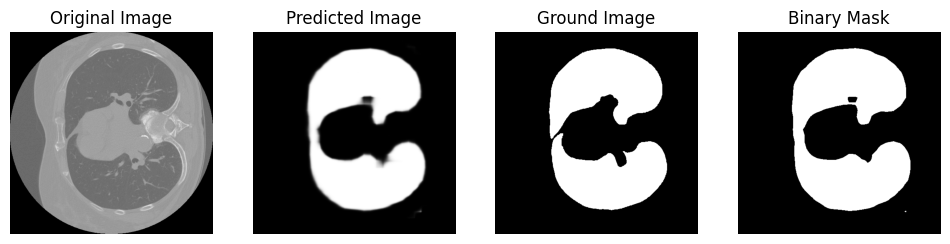

(1, 512, 512)
DICE loss :  0.033422116463702634


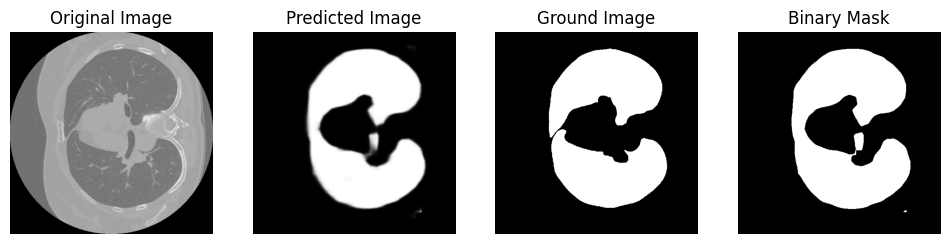

(1, 512, 512)
DICE loss :  0.023252076469671312


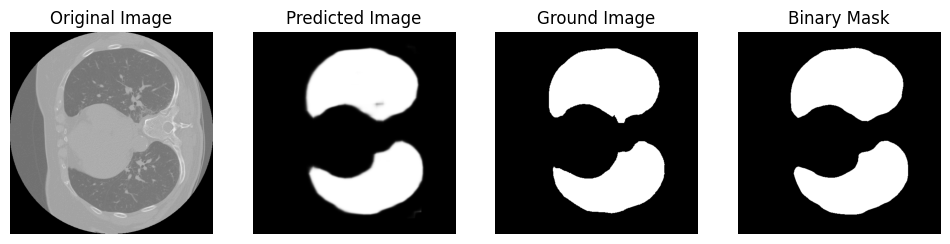

(1, 512, 512)
DICE loss :  0.023076353403019945


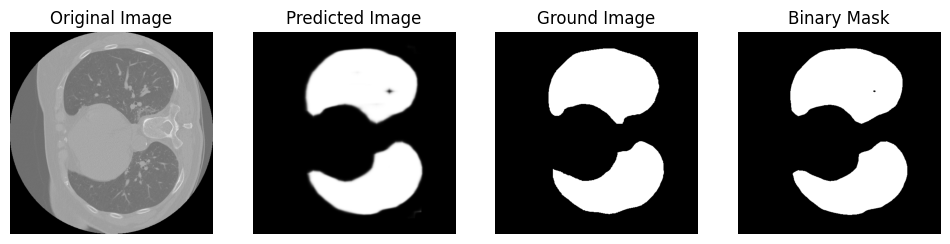

(1, 512, 512)
DICE loss :  0.023698264352537968


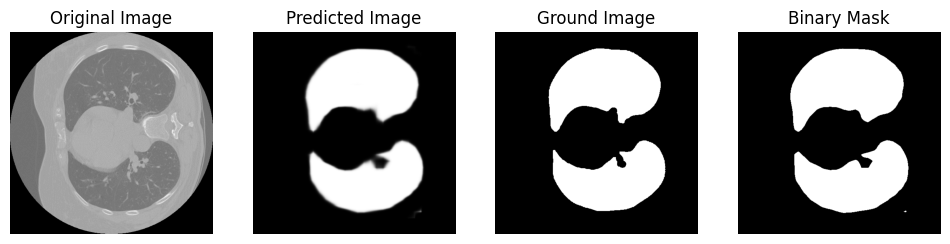

(1, 512, 512)
DICE loss :  0.02062438617905571


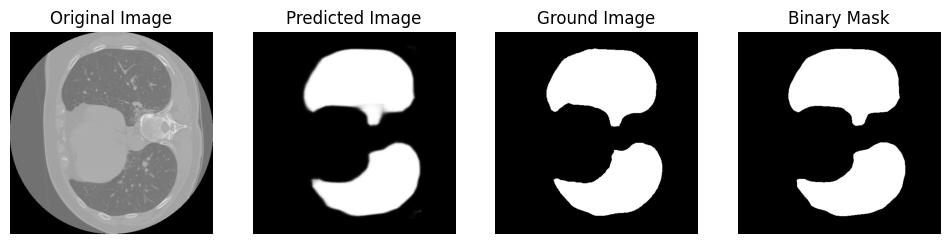

(1, 512, 512)
DICE loss :  0.03891981214134643


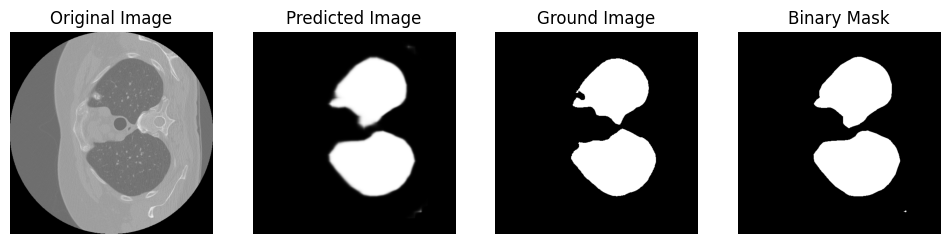

(1, 512, 512)
DICE loss :  0.023635271096942856


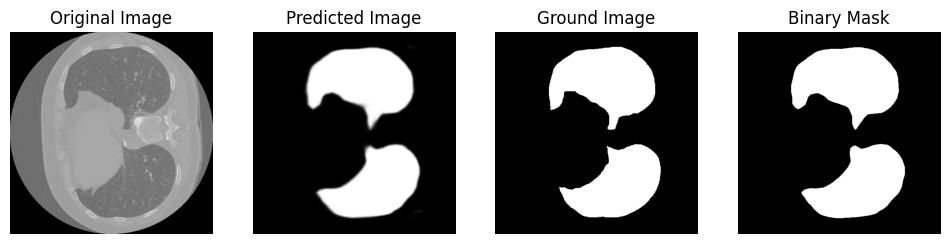

(1, 512, 512)
DICE loss :  0.05300886625179946


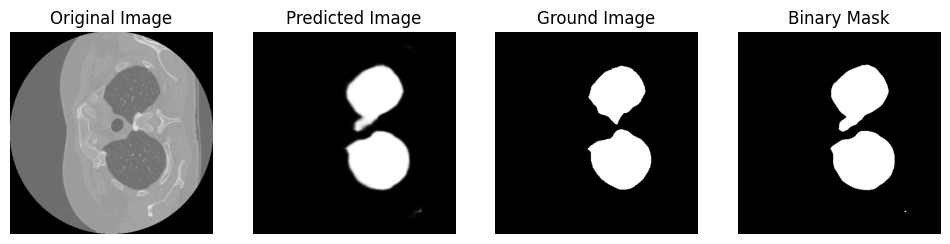

(1, 512, 512)
DICE loss :  0.041484716157335955


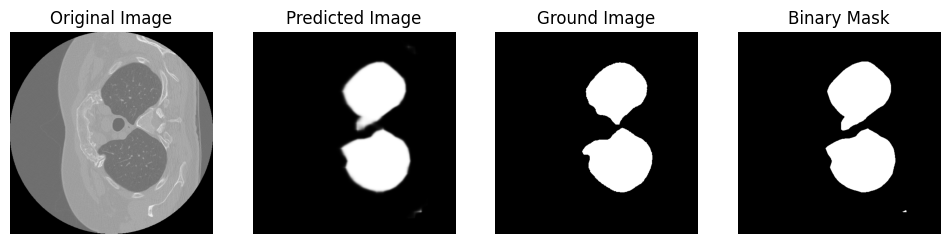

(1, 512, 512)
DICE loss :  0.025804775319378526


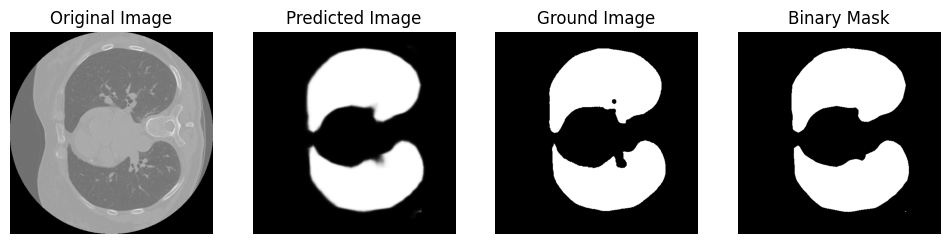

(1, 512, 512)
DICE loss :  1.0


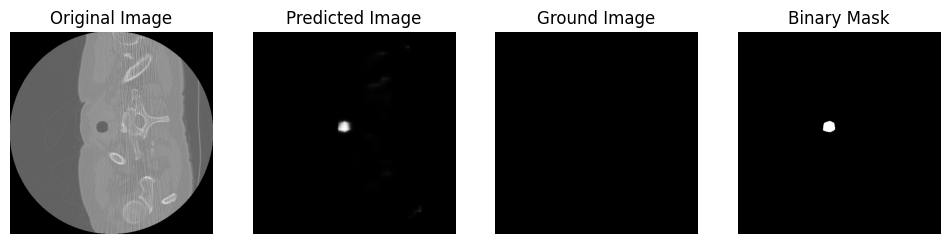

(1, 512, 512)
DICE loss :  0.47374822623256896


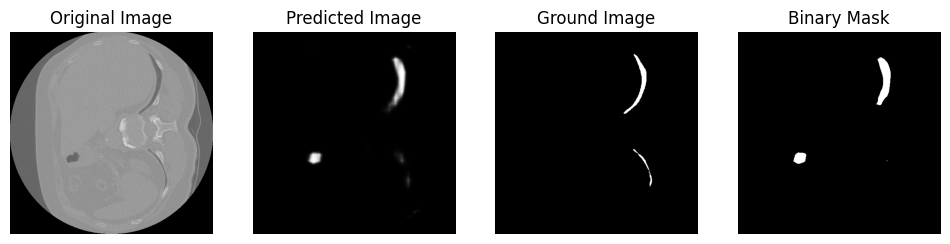

(1, 512, 512)
DICE loss :  0.03291130849802526


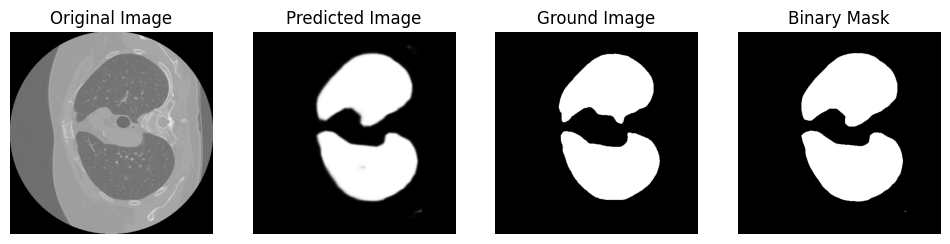

(1, 512, 512)
DICE loss :  0.02232689298283086


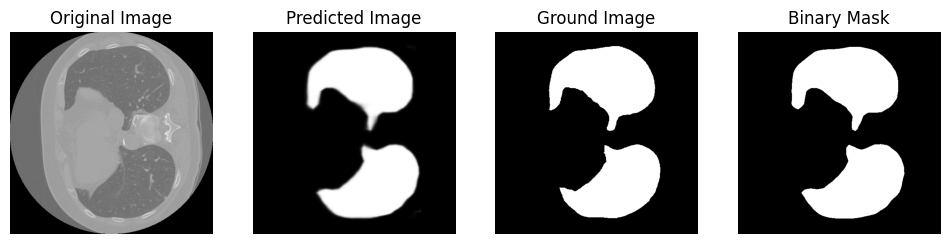

(1, 512, 512)
DICE loss :  0.026787376985845213


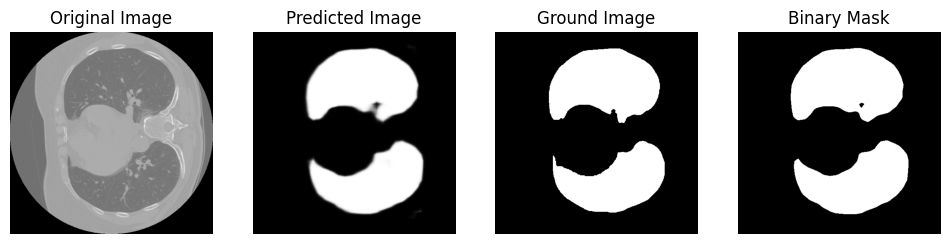

(1, 512, 512)
DICE loss :  1.0


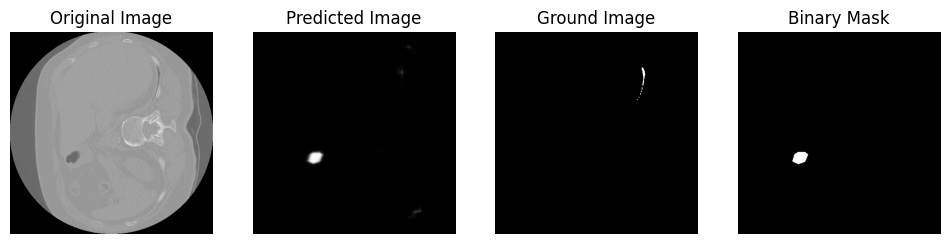

(1, 512, 512)
DICE loss :  0.02264372340353793


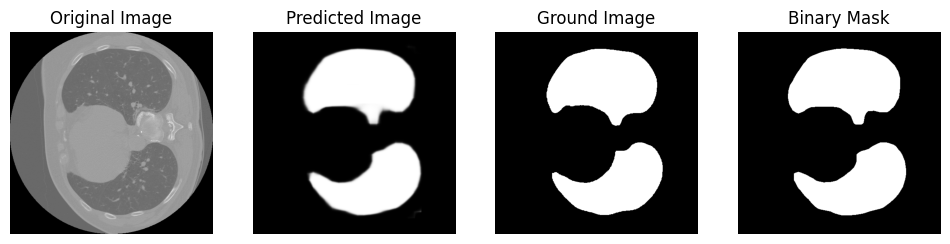

(1, 512, 512)
DICE loss :  0.026935623859049906


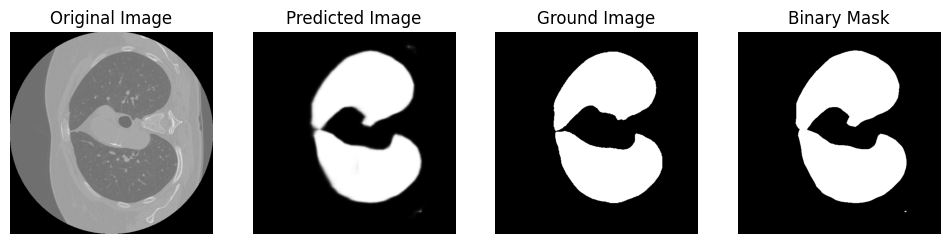

(1, 512, 512)
DICE loss :  0.024044308341585774


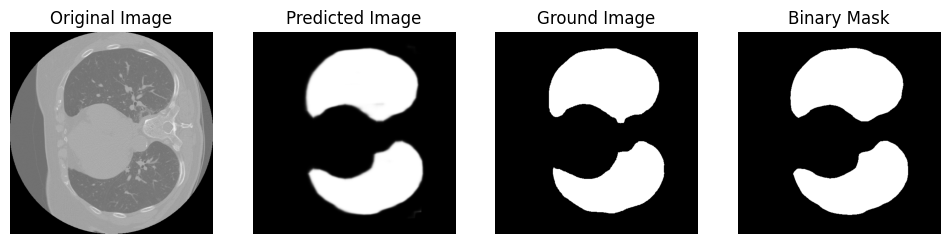

In [38]:
total_loss = inference(model)

In [39]:
print("Average Dice loss : ", total_loss/len(lung_image_val))

Average Dice loss :  0.6084397874482507


INFERENCE

FOR inferencing part you can give input as numpy_array

In [41]:
import torch
import numpy as np

def predict(model, input_data):
    model.eval()  # Set the model to evaluation mode

    # Convert input to PyTorch tensor if it's a NumPy array
    if isinstance(input_data, np.ndarray):
        input_tensor = torch.from_numpy(input_data).float()
    elif isinstance(input_data, torch.Tensor):
        input_tensor = input_data.float()
    else:
        raise ValueError("Input must be either a NumPy array or a PyTorch tensor.")

    with torch.no_grad():
        # Make predictions
        outputs = model(input_tensor)
        predictions = torch.sigmoid(outputs)  # Assuming you are dealing with binary classification

    # Convert the model output to probabilities (assuming BCEWithLogitsLoss was used)
    # probabilities = torch.sigmoid(model_output)

    # Convert probabilities to a binary mask (assuming a threshold of 0.5)
    binary_mask = (predictions > 0.5).float()

    # Convert the result back to a NumPy array
    binary_mask = binary_mask.cpu().numpy()

    return binary_mask


In [42]:
# loading the pretrained model_temp

# model_temp = Model()
# # model_temp = model_temp.to(device)
# model_temp_path = '/content/drive/MyDrive/lungs/lung_segmentation.pth'
# model_temp_state_dict = torch.load(model_temp_path, map_location=torch.device('cpu'))
# model_temp.load_state_dict(model_temp_state_dict)
# # model_temp.eval()

model_temp = Model()
checkpoint = torch.load('/content/drive/MyDrive/lungs/lung_segmentation_1.pth')
model_temp.load_state_dict(checkpoint['model_state_dict'])

opti = optim.Adam(model_temp.parameters(),learning_rate)
opti.load_state_dict(checkpoint['optimizer_state_dict'])
model_temp = model_temp.to(device)
model_temp.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model(
  (resnet): ModifiedDilatedResNet(
    (resnet_layers): Sequential(
      (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace

In [43]:
import numpy as np
import matplotlib.pyplot as plt

def apply_mask(image, mask):
    masked_image = image * mask

    return masked_image


In [44]:
def inference(input_array, model_temp):
    input_array = input_array.cpu().numpy()
    input_array = np.expand_dims(input_array, axis=0)
    input_array = np.expand_dims(input_array, axis=1)


    prediction = predict(model_temp, input_array)
    binary_mask = (prediction > 0.2).astype(np.uint8)
    plt.figure(figsize=(12, 4))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(input_array.squeeze(), cmap='gray')  # Use cmap='gray' for grayscale images
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(binary_mask.squeeze(), cmap='gray')
    plt.title('Binary Mask')
    plt.axis('off')

    plt.show()

    return binary_mask

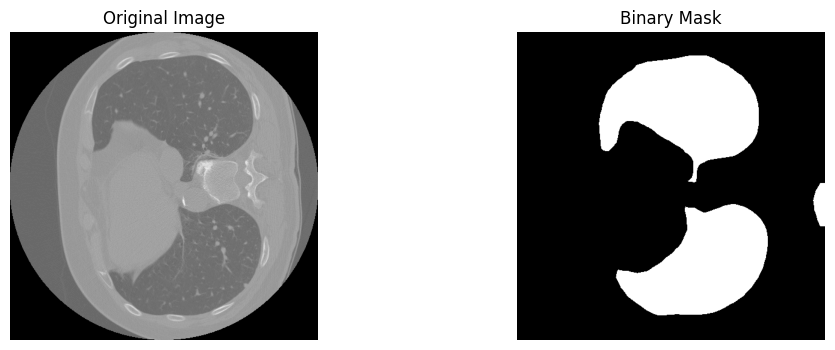

In [47]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Assuming lung_image_train[20] is a PyTorch tensor
input_tensor = lung_image_train[20].float().to("cpu")  # device is your current device (cuda:0 or cpu)

# Make a prediction
model_temp = model_temp.to("cpu")
mask = inference(input_tensor, model_temp)


In [48]:

def get_lungs(image, mask):
    masked_image = apply_mask(image, mask)
    plt.figure(figsize=(12, 4))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    # Binary mask
    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.title('Binary Mask')
    plt.axis('off')

    # Masked image
    plt.subplot(1, 3, 3)
    plt.imshow(masked_image)
    plt.title('Masked Lung Image')
    plt.axis('off')

    plt.show()


In [49]:

def get_lungs(image, mask):
    masked_image = apply_mask(image, mask)
    plt.figure(figsize=(12, 4))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    # Binary mask
    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.title('Binary Mask')
    plt.axis('off')

    # Masked image
    plt.subplot(1, 3, 3)
    plt.imshow(masked_image)
    plt.title('Masked Lung Image')
    plt.axis('off')

    plt.show()


In [50]:
def bioCliq(numpy_image):
    input_tensor = numpy_image.float().to(device)

    # Make a prediction
    mask = inference(input_tensor, model_temp)
    get_lungs(numpy_image, mask.squeeze())



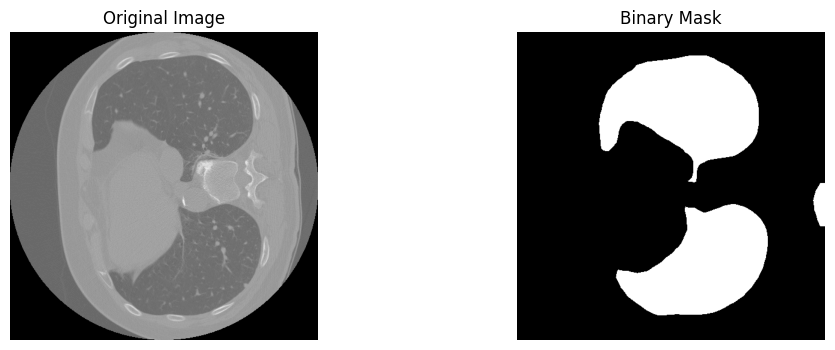

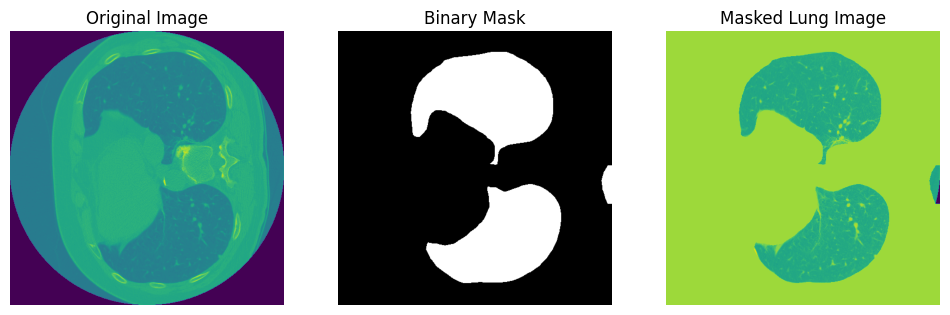

In [51]:
bioCliq(lung_image_train[20])

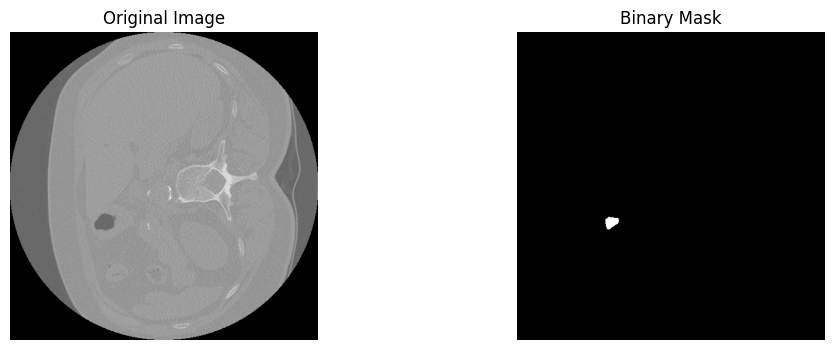

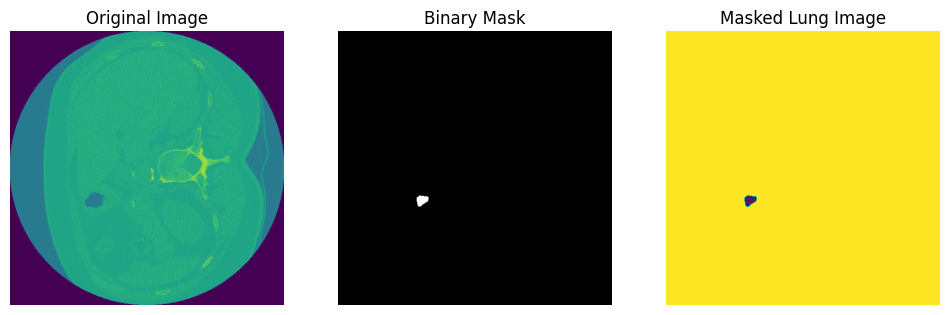

In [52]:
bioCliq(lung_image_train[30])